In [1]:
# import libraries & setup plotting constants

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
from matplotlib.colors import ListedColormap
pltC = ('red', 'blue', 'green', 'purple')
pltM = ('o', 'x', '*', '.', '+')

In [2]:
class PolyCalc(object):
    """ Return values of Polynomial """

    def __init__(self):                            
        """ """
        return None
    
    def values(self, coefs, x):
        """ returns y values for given x values       
        
        Parameters
        ----------
            coefs : {array-like}, shape = [deg+1]   
            x     : {array-like}, shape = [npts]
            
        """        
        deg1 = len(coefs)
        deg = deg1 - 1
        npts = len(x)        
        polyval = np.zeros(npts)
        for j in range(0, npts):
            polyval[j] = coefs[0]
            for k in range(1, deg1):
                polyval[j] +=  coefs[k] * x[j]**k  
        return (polyval)


In [3]:
# now prepare to generate a sample generated by a polynomial with random noise.

In [4]:
# set up the polynomial

ncoefs = 4
coefs = np.zeros(ncoefs)
coefs[0] = -6.0
coefs[1] = 7.0
coefs[2] = 6.0
coefs[3] = -9.0

xpoly = np.linspace(-1.0, 1.0,501)
PC = PolyCalc()
ypoly = PC.values(coefs,xpoly)

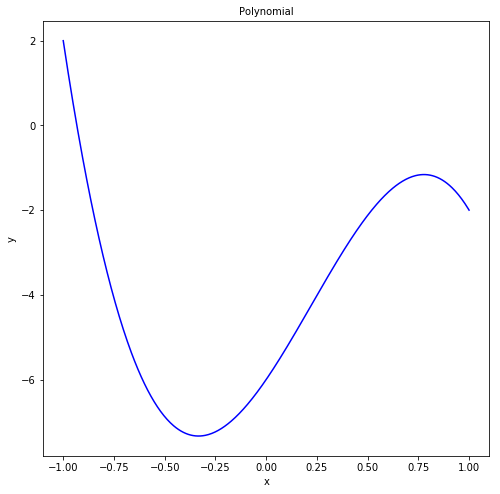

In [5]:
# plot polyn

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Polynomial', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypoly, color = pltC[1])
plt.axis(range=1, aspect=1)
plt.show()

In [6]:
# prepare to normalize polynomial and add random noise 

s_tilda = 1.0
n_tilda = 1.0
g = 2.0 /(s_tilda + 2* n_tilda)
s = g * s_tilda
n = g * n_tilda

ymin = ypoly.min()
ymax = ypoly.max()

tr_ = (ymax - ymin)/s
if (tr_ < 0.0001): 
    t = 1000.0
else:
    t = 1/tr_

ypolyt = -1 +(ypoly - ymin)*t + n

cf = np.zeros(4)
cf[0] = -1 +(coefs[0] - ymin)*t + n
for i in range(1,4):
    cf[i] = coefs[i]*t

ypolycheck = PC.values(cf,xpoly)- ypolyt
print('maximum error - should be a very small number: ',np.sqrt((ypolycheck**2).max()))

maximum error - should be a very small number:  2.22044604925e-16


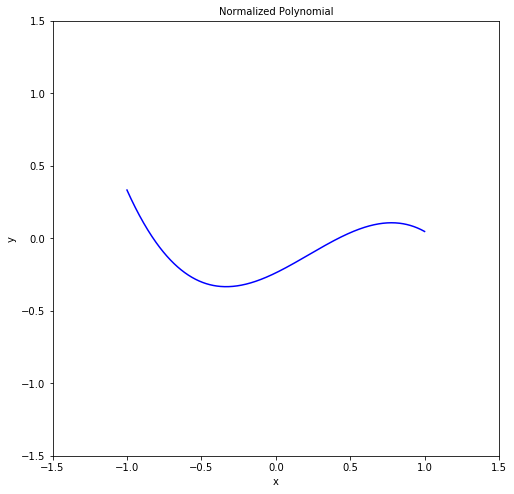

In [7]:
# plot poly

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Normalized Polynomial', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1])
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
#plt.axis(range=1, aspect=1)
plt.show()

In [8]:
# generate a sample from a polynomial with random noise.

npts = 1000
sigma = 0.20
x = np.random.uniform(-1.0, 1.0,size = npts)
yrandom = np.random.normal(0.0, sigma, size = npts)

#limit yrandom to range [-1, +1]
for i in range(0,npts):
    if (yrandom[i] > 1.0):
        yrandom[i] = 1.0
    elif (yrandom[i] < -1.0):
        yrandom[i] = -1.0       

y = -1 + (PC.values(coefs,x)- ymin)*t +n + yrandom*n


In [9]:
# divide data into training and test sets

fractest = 0.50
ntest = int(fractest * npts)
ntrain = npts - ntest

# set up and randomize index array
# if index is < 0, it's a test value; if it's >=0 it's a training value
s = np.arange(-ntest, npts-ntest)
np.random.shuffle(s)

x_train = np.zeros(ntrain)
y_train = np.zeros(ntrain)
x_test = np.zeros(ntest)
y_test = np.zeros(ntest)

# there is probably a more elegant way of writing the following code

for i in range(0,npts):
    if (s[i] < 0):
        x_test[-1-s[i]] = x[i]
        y_test[-1-s[i]] = y[i]
    else:
        x_train[s[i]] = x[i]
        y_train[s[i]] = y[i]

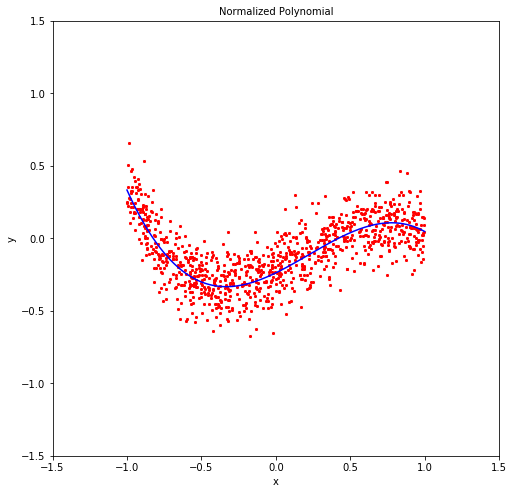

In [10]:
# plot points and polynomial curve

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Normalized Polynomial', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1])
plt.scatter(x,y, color = pltC[0], marker = pltM[1], s=5)
plt.axis(range=1, aspect=1)
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.show()

# --------------------------------Assignment for Week 6---------------------------------
## ---------------------------------------------Pooneet Thaper-------------------------------------------

In [11]:
# Pooneet Thaper
# Professor Grimmelmann
# CSC 59929

# Assignment for Week 6:

# Curve fitting regularization cases:
#     - No Regularization
#     - L1 Regularization
#     - L1 Regularization with power parameter
#     - L2 Regularization
#     - L2 Regularization with power parameter

# Notes:

# Power parameter was added to the PolyFit class with default value 0. Power can be set to another value when
# intiailizing the instance of PolyFit by giving the desired power as the reg_power parameter of the class constructor
# For generalization, power was integrated into the code such that the power parameter is always applied and, as such,
# L1 and L2 regularizations without power parameter will use the default power parameter value of zero to the same end.

# Format for each case:
#     0. Parameters are specified for each case (reg_type, lambda_reg, and reg_power)
#           - lambda in [0.01, 0.1, 1, 10, 100]
#     1. Code from above is used to run each case using up to seven degrees
#     2. Information from each run of each degree are stored in a list 
#     3. A summary of the runs and a discussion of the results are provided

records = []
case_num = 0

In [12]:
class PolyFit(object):
    """ Polynomial Fit to a curve

Parameters
    ------------
    eta : float
        Fitting rate (between 0.0 and 1.0)
    n_iter : int
        Passes over the training dataset.
    lambda_reg: regularization parameter (is set to 1.0 for reg_type = 0)
    reg_type: regularization type
        0: none
        1: L1
        2: L2
    reg_power: power for regularization power parameter
        default 0 for no power parameter
    
    Attributes
    -----------
    c : 1d-array
        Polynomial coefficeints.
    cost_hist : list
        root-mean-squared error in every epoch.
    grad_hist : list
        magnitude of the cost gradient in every epoch

    """
    def __init__(self, batchsize=1, eta=0.1, n_iter=500, lambda_reg=0.0, reg_type=0, reg_power=0):
        self.batchsize = batchsize
        self.eta = eta
        self.n_iter = n_iter
        self.lambda_reg = lambda_reg
        self.reg_type = reg_type
        self.reg_power = reg_power
        return(None)
    
    def fit(self, deg, x, y):
        """ Fit curve in batch mode

        Parameters
        ----------
        deg: degree of the polynomial [integer]
        x : {array-like}, shape = [n_samples]
            x values of the curve
        y : {array-like}, shape = [n_samples]
            y values of the curve       
        
        Returns
        -------
        self : object

        """
        
        n_val = len(x)
        self.deg = deg
        self.deg1 = deg + 1
        self.c = np.zeros(deg+1)
        self.cost_hist = []
        self.grad_hist = []
        xbatch = np.zeros(n_val)
        ybatch = np.zeros(n_val)
        
        for n in range(self.n_iter):
            g = self.g(x)
            errors = (y - g)            
                        
            # create a batch
            if (self.batchsize >= n_val):
                # use all values
                xbatch = x
                ybatch = y          
            else:
                # use self.batchsize values
                s = np.arange(0,n_val)
                np.random.shuffle(s)
                xbatch = x[s[:self.batchsize]]
                ybatch = y[s[:self.batchsize]]
            # calculate gradient for batch and update the coefficients   
            gradient = self.gradcost(xbatch, ybatch)
            self.c -= self.eta * gradient
            cost = (errors**2).sum() 
            rmscost = np.sqrt(cost/n_val)
            self.cost_hist.append(rmscost)
            gradmag = np.sqrt(np.dot(gradient,gradient))    
            self.grad_hist.append(gradmag)
        return self
    
    def g(self, x):
        """ returns g values for given x values """
        nval = len(x)
        g_val = np.zeros(nval)
        for j in range(0, nval):
            g_val[j] = self.c[0]
            for k in range(1, self.deg1):
                g_val[j] +=  self.c[k] * x[j]**k  
        return (g_val)
    
    def cost(self, x, y):
        """ return cost cost function for a given x, y """
        n_val = len(x)
        cost_val = (0.5 / n_val) *  ((y - g(x))**2).sum()
        if (self.reg_type ==2 ):
            for j in range (1, self.deg1):
                cost_val += (j**self.reg_power) * (0.5 * self.lambda_reg * self.c[j]**2)
        elif(self.reg_type == 1):
            for j in range (1, self.deg1):
                cost_val += (j**self.reg_power) * (0.5 * self.lambda_reg * abs(self.c[j]))
        return(cost_val)
        
    def gradcost(self, x, y):
        """ returns the gradient for a sample of given x values """
        n_val = len(x)
        self.grad = np.zeros(self.deg1) 
        for m in range(0, self.deg1):                              
            self.grad[m] = - (1/n_val) * ((y - self.g(x))*x**m).sum()
            if (m > 0):
                if (self.reg_type == 2):
                    self.grad[m] += (m**self.reg_power) * (self.lambda_reg * self.c[m])
                elif (self.reg_type == 1):
                    self.grad[m] += (m**self.reg_power) * (self.lambda_reg) 
        return(self.grad)
    
    def gerr(self, x, y):
        """ return the root-mean-squared error of given x and and y values """
        n_val = len(x)             
        perr = y - self.g(x)  
        rmserr = np.sqrt((perr**2).sum()/n_val) 
        return (rmserr)
    
    def getcoef(self):
        """ get the coefficents """
        return(self.c)
    
    def setcoef(self,coef):
        """ set the coefficients """ 
        self.c = coef
        return 

In [13]:
ndegrees = 7
ndegrees1 = ndegrees+1
niters = 5000
err_train = None 
err_test = None
xxx = None
yyyi = None
yyye = None 
costi = None 
gradi = None
degrees = None

def run(reg_type, lambda_reg=0, reg_power=0):
    # Variables that dont change
    global case_num, ndegrees, ndegrees1, niters
    # Variables that will change each run
    global err_train, err_test,xxx, yyyi, yyye, costi, gradi, degrees
    
# fit training data for a variety of polynoical degrees

    # zero out the variables
    degrees = np.arange(0,ndegrees1)
    err_train = np.zeros(ndegrees1)
    err_test = np.zeros(ndegrees1)
    xxx = np.linspace(-1.0, 1.0,501)
    yyyi = np.zeros((501,ndegrees1))
    yyye = np.zeros((501,ndegrees1))
    cffit = np.zeros((ndegrees1))

    # assume ndegrees > coefs 
    cfinp = np.zeros(ndegrees1)
    for i in range(0,ncoefs):
        cfinp[i] = cf[i]
    for i in range(ncoefs+1,ndegrees1):
        cfinp[i] = 0    

    barwidth = 0.4
    xbarinp = np.zeros(ndegrees1)
    xbarfit = np.zeros(ndegrees1)
    for i in range(0,ndegrees1):
        xbarinp[i] = i - barwidth/2
        xbarfit[i] = i + barwidth/2   
    # set parameters

    nbatchsize = 100000
    Eta = 0.5
    Lvalue = lambda_reg
    RType = reg_type
    Power = reg_power
    costi = np.zeros((niters,ndegrees1))
    gradi = np.zeros((niters,ndegrees1))

    for i in range (0, ndegrees1):

        print('case_num:       ', case_num)
        print('degree:         ', degrees[i])
        print('sample size:    ', ntrain)
        print('parameters:     ', degrees[i]+1)
        print('iterations:     ', niters)
        print('batch size:     ', nbatchsize)
        print('eta:            ', Eta )
        print('lambda          ', Lvalue)
        print('Regularization: ', RType)
        print('Power:          ', Power)
        print('inner loop:     ', min(nbatchsize,ntrain)*(degrees[i]+1)*niters)

        PF = PolyFit(batchsize=nbatchsize, eta=Eta, n_iter=niters, lambda_reg=Lvalue, reg_type=RType, reg_power=Power)
        PF.fit(degrees[i], x_train, y_train)
        gerr = PF.gerr(x_train, y_train)
        perr = PF.gerr(x_test, y_test)
        err_train[i] = gerr
        err_test[i] = perr  
        yyyi[:,i] = PF.g(xxx)
        yyye[:,i] = yyyi[:,i] - ypolyt[:] 
        costi[:,i] = PF.cost_hist[:]
        gradi[:,i] = PF.grad_hist[:]

        print('train rms error:', gerr)
        print('test rms error: ', perr)

    # plot coefficients
        for j in range(0,ndegrees1):
            if (j <= degrees[i]):
                cffit[j] = PF.c[j]           
        plt.close('all')
        fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
        ax.bar(xbarinp, cfinp, barwidth, color = 'red', align='center', label='Input')
        ax.bar(xbarfit, cffit, barwidth, color = 'blue', align='center', label='Fit')
        ax.set_xlabel('i')
        ax.set_ylabel('Coefficient')
        ax.legend(loc='upper right', fontsize='medium')
        ax.set_title('Scaled Polynomial Coefficients', fontsize ='medium')
        plt.show()   
    # plot rms error by epoch   
        plt.close('all')
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,4))
        ax[0].set_xlabel('epoch')
        ax[0].set_ylabel('rms error')
        ax[0].set_title('RMS Error', fontsize ='medium')
        ax[0].plot(range(1, niters + 1),costi[:,i])
        ax[1].set_xlabel('epoch')
        ax[1].set_ylabel('rms error')
        ax[1].set_title('RMS Error', fontsize ='medium')
        ax[1].semilogy(range(1, niters + 1),costi[:,i])
        plt.show()
    # plot ||gradient|| by epoch
        plt.close('all')
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,4))
        ax[0].set_xlabel('epoch')
        ax[0].set_ylabel('||gradient||')
        ax[0].set_title('Gradient', fontsize ='medium')
        ax[0].plot(range(1, niters + 1),gradi[:,i])
        ax[1].set_xlabel('epoch')
        ax[1].set_ylabel('||gradient||')
        ax[1].set_title('Gradient', fontsize ='medium')
        ax[1].semilogy(range(1, niters + 1),gradi[:,i])
        plt.show()

        print(' ')
        
    # append to records for each case tried
        records.append([case_num, reg_type, lambda_reg, reg_power, degrees[i], gerr, perr])
        case_num += 1
    print ('done')

## -------------------------------------------No Regularization-------------------------------------------

case_num:        0
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0
Regularization:  0
Power:           0
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


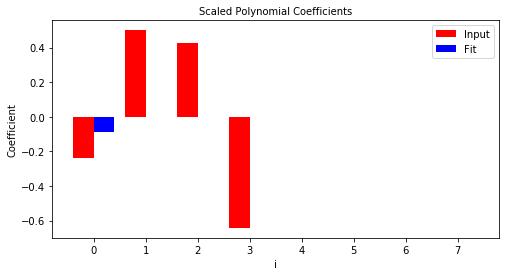

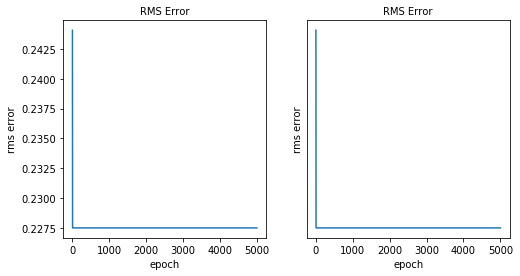

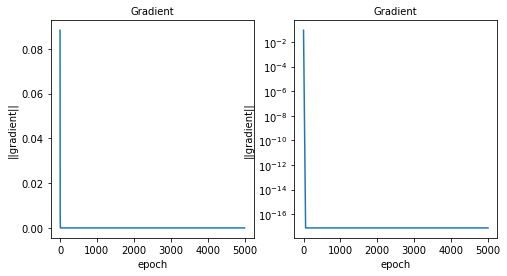

 
case_num:        1
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0
Regularization:  0
Power:           0
inner loop:      5000000
train rms error: 0.21802458661
test rms error:  0.205483363595


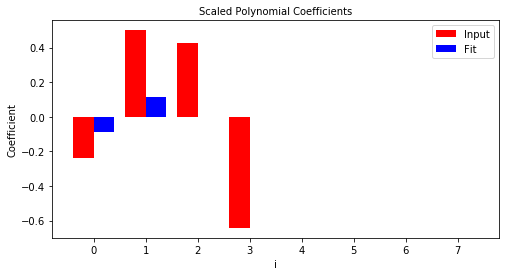

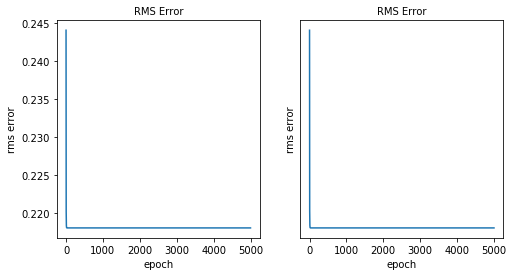

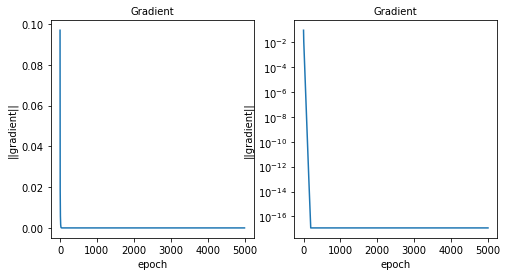

 
case_num:        2
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0
Regularization:  0
Power:           0
inner loop:      7500000
train rms error: 0.177297131483
test rms error:  0.163054881955


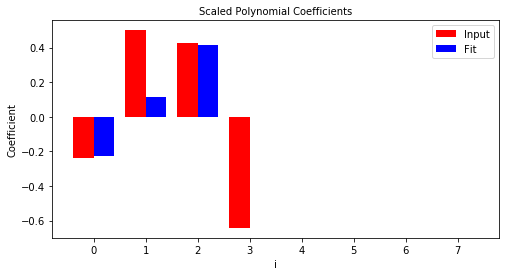

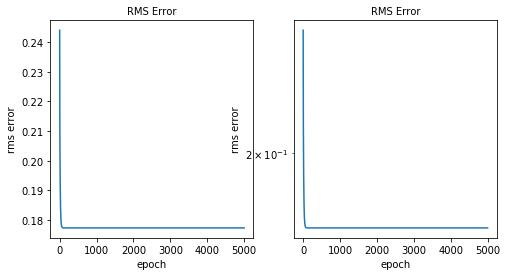

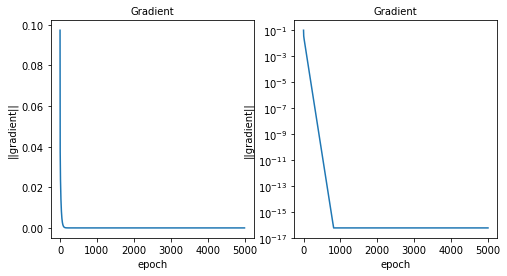

 
case_num:        3
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0
Regularization:  0
Power:           0
inner loop:      10000000
train rms error: 0.136844247355
test rms error:  0.133772792765


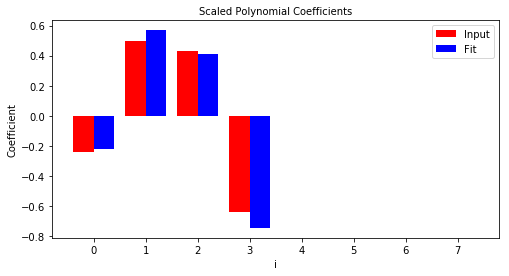

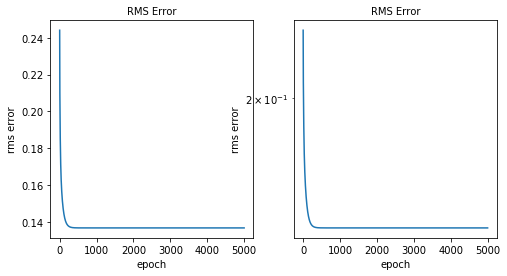

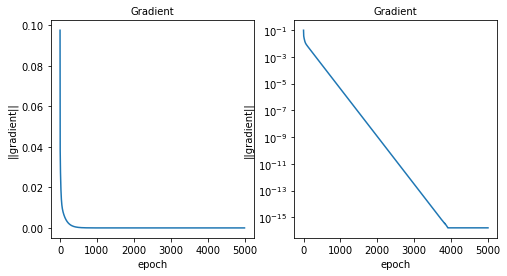

 
case_num:        4
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0
Regularization:  0
Power:           0
inner loop:      12500000
train rms error: 0.136262243678
test rms error:  0.134060424114


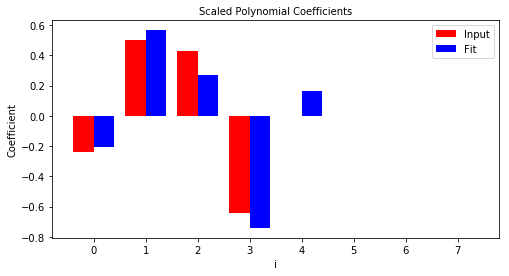

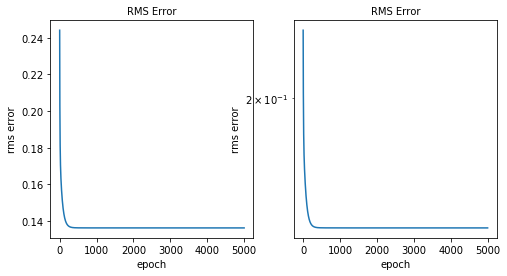

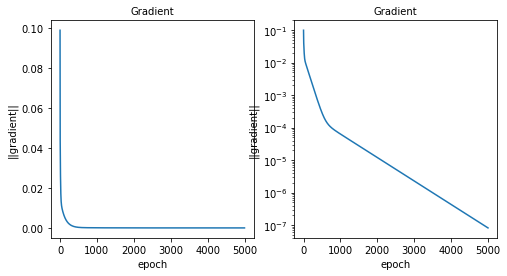

 
case_num:        5
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0
Regularization:  0
Power:           0
inner loop:      15000000
train rms error: 0.136263267994
test rms error:  0.13401431581


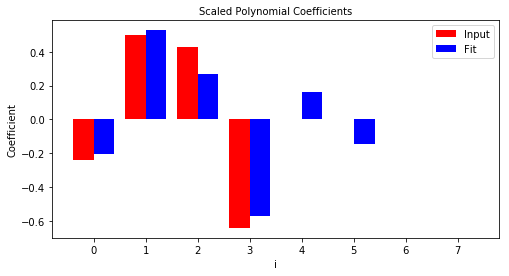

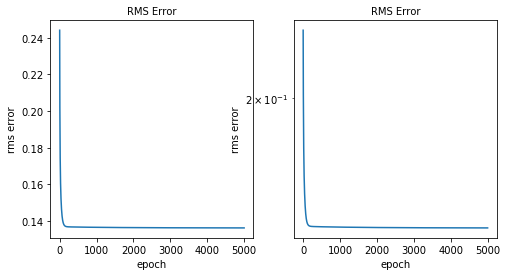

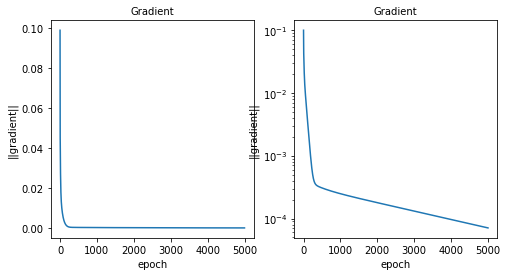

 
case_num:        6
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0
Regularization:  0
Power:           0
inner loop:      17500000
train rms error: 0.136215162129
test rms error:  0.134101876803


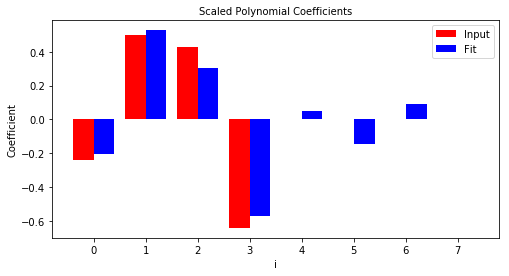

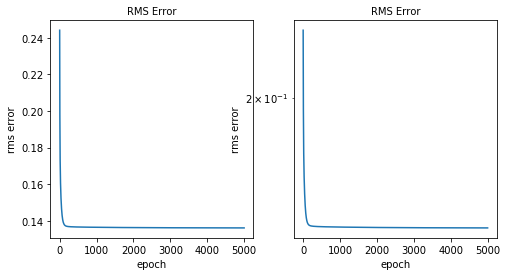

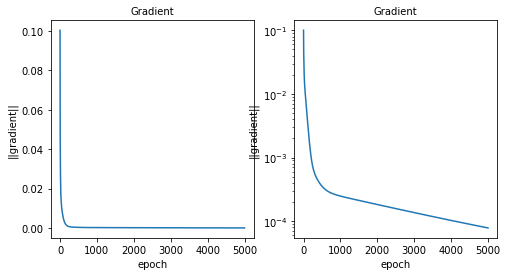

 
case_num:        7
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0
Regularization:  0
Power:           0
inner loop:      20000000
train rms error: 0.136210629572
test rms error:  0.134084565107


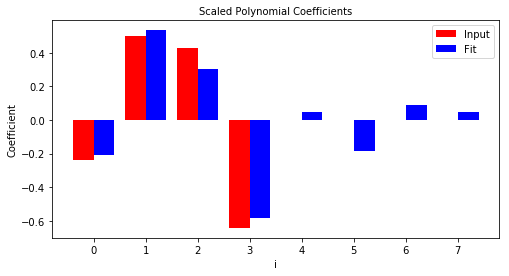

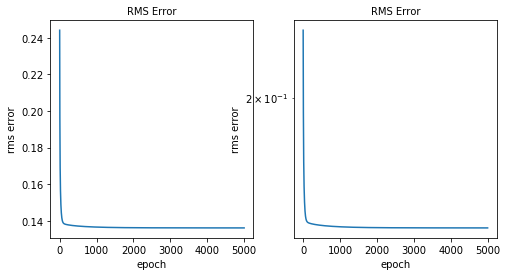

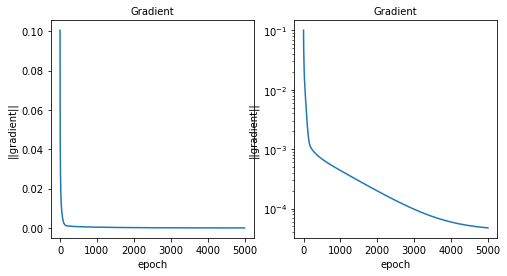

 
done


In [14]:
# Case: No regularization
# Case parameters
# Type of regularization: 0 => No regularization
reg_type = 0
# Lambda: 0 => No regularization so lambda is irrelevant
lambda_reg = 0
# Power parameter: 0 => No regularization so power is irrelevant
reg_power = 0
run(reg_type, lambda_reg, reg_power)

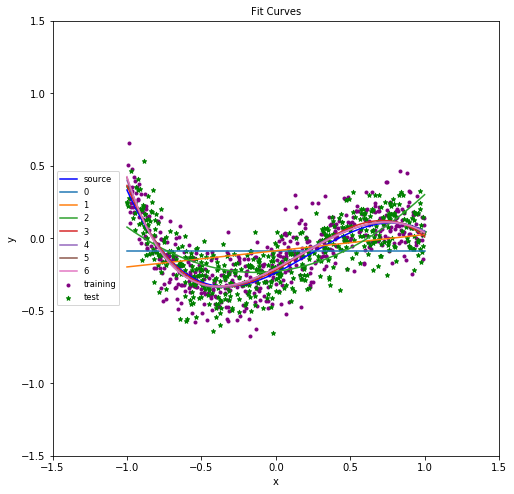

In [15]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

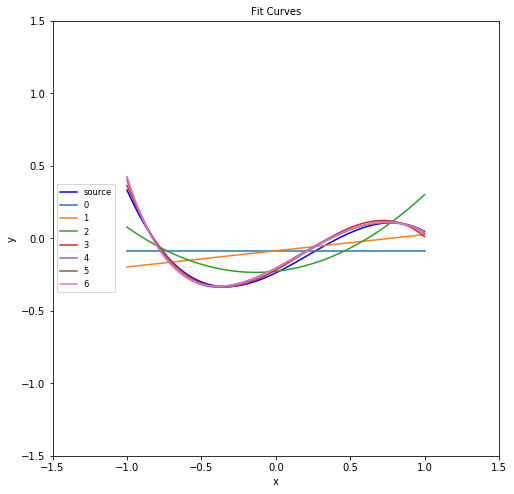

In [16]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

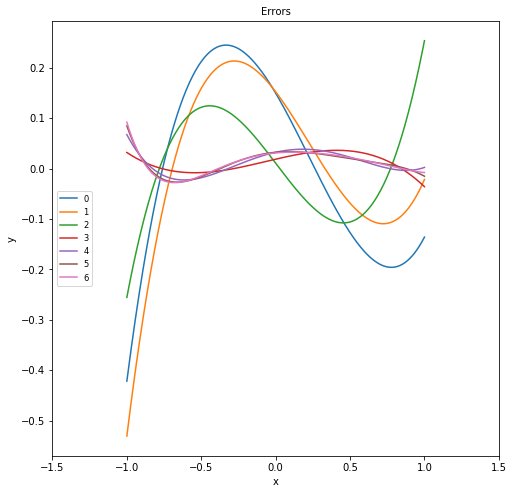

In [17]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

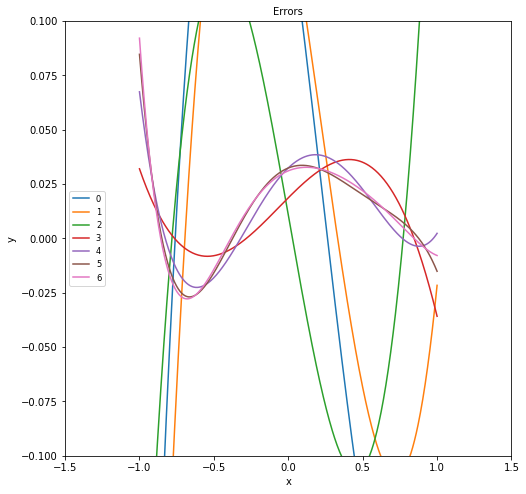

In [18]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

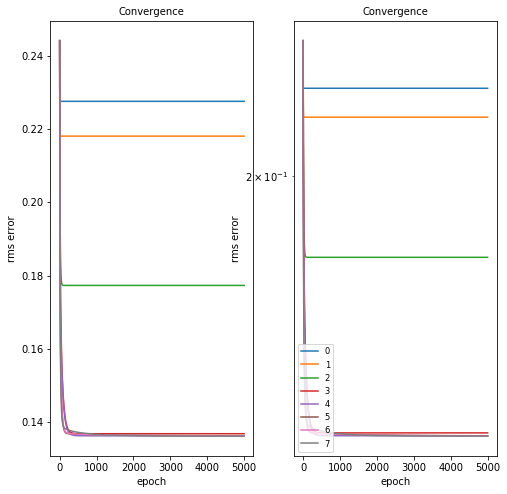

In [19]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i] , label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


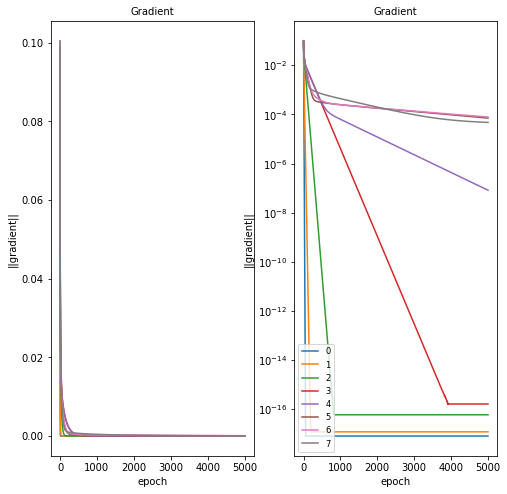

In [20]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


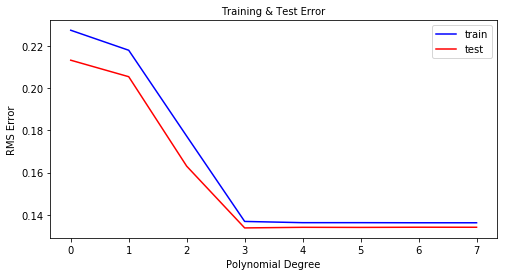

In [21]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

## -----------------------------L1 Regularization without power parameter----------------------------

case_num:        8
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           0
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


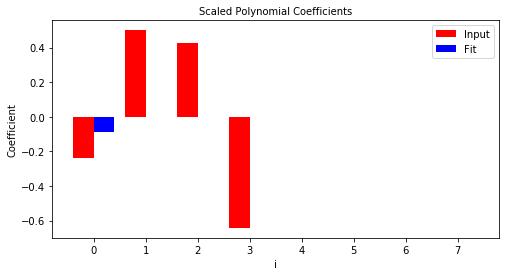

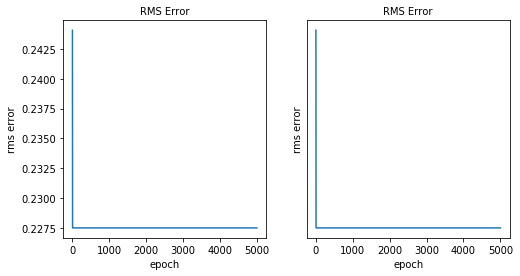

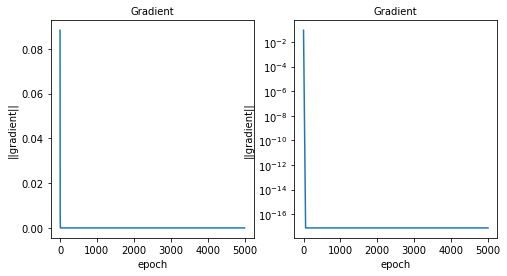

 
case_num:        9
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           0
inner loop:      5000000
train rms error: 0.218699496499
test rms error:  0.205573076748


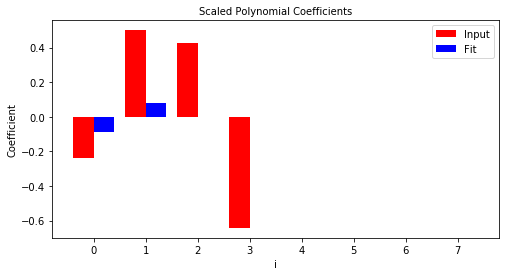

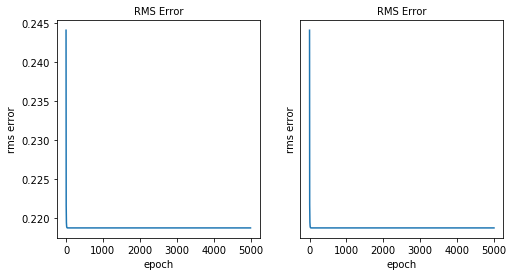

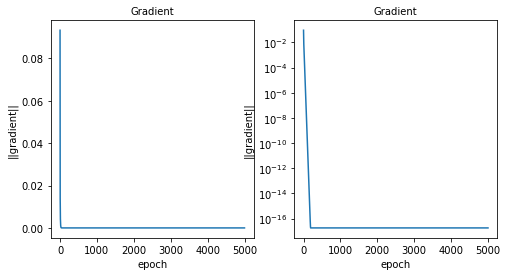

 
case_num:        10
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           0
inner loop:      7500000
train rms error: 0.181133479346
test rms error:  0.166039129149


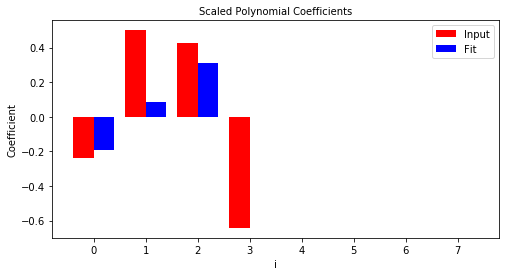

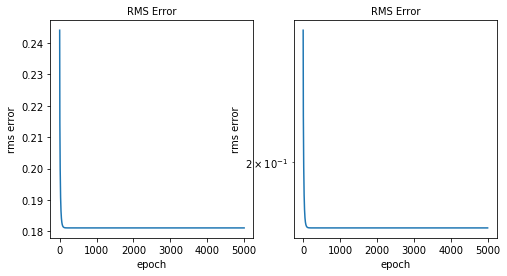

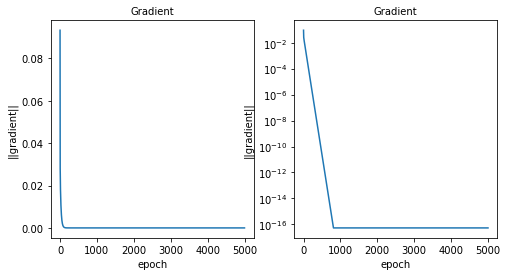

 
case_num:        11
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           0
inner loop:      10000000
train rms error: 0.14421417212
test rms error:  0.143390423876


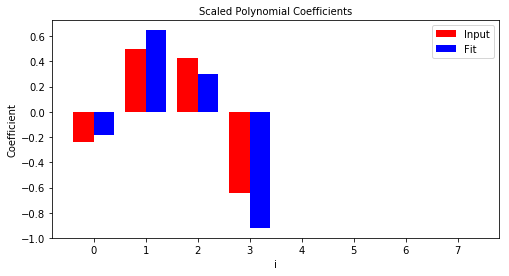

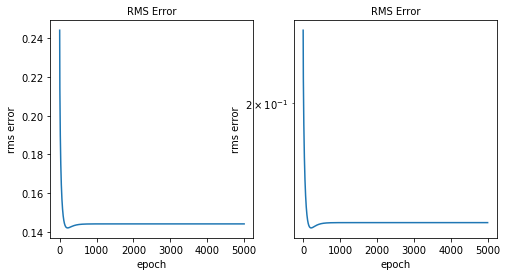

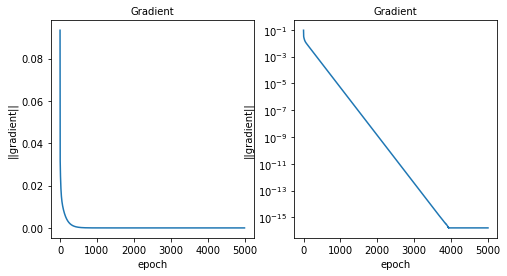

 
case_num:        12
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           0
inner loop:      12500000
train rms error: 0.144959804886
test rms error:  0.1438711307


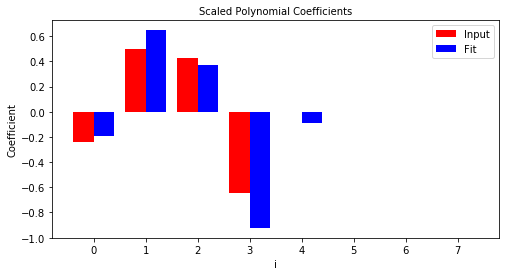

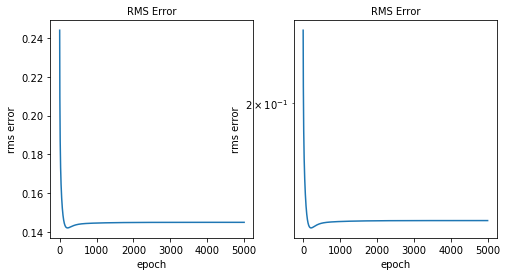

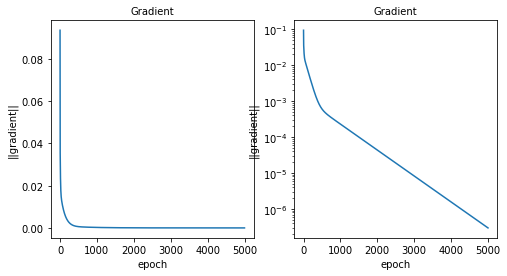

 
case_num:        13
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           0
inner loop:      15000000
train rms error: 0.147999607217
test rms error:  0.14794018044


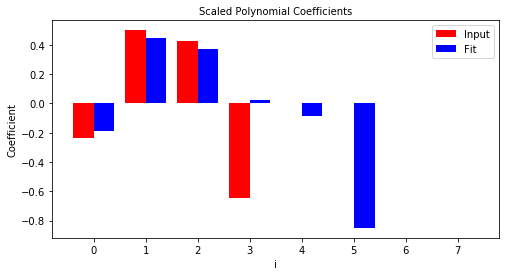

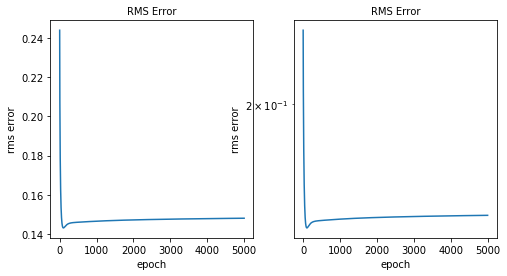

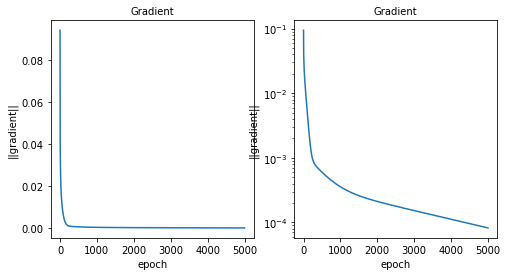

 
case_num:        14
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           0
inner loop:      17500000
train rms error: 0.14946640321
test rms error:  0.148726565418


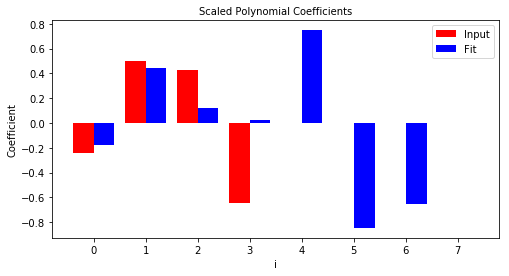

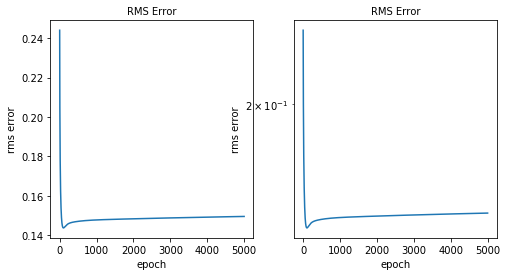

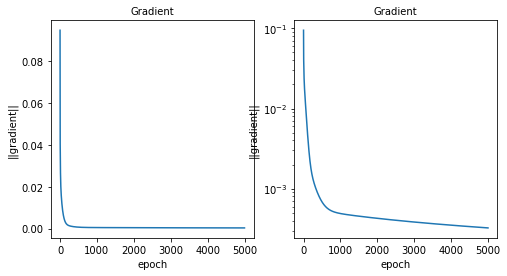

 
case_num:        15
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           0
inner loop:      20000000
train rms error: 0.151159038596
test rms error:  0.151066695316


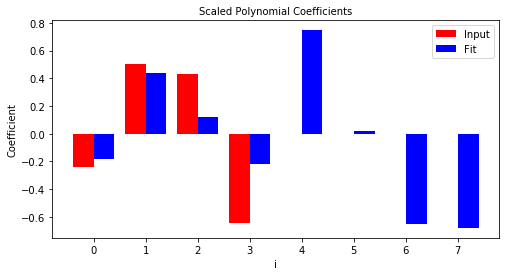

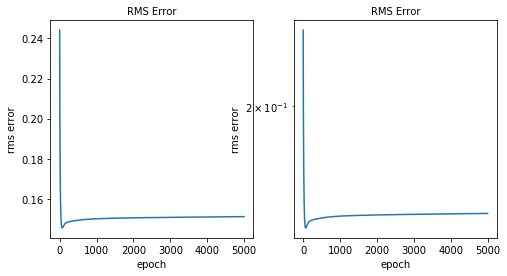

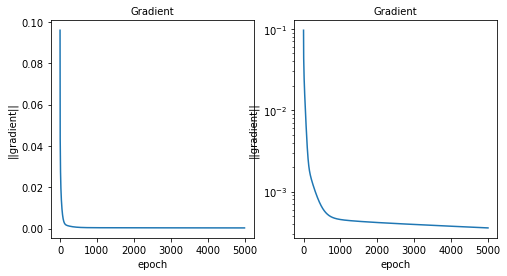

 
done


In [22]:
# Case: L1 regularization without power parameter, lambda=0.01
# Case parameters
# Type of regularization: 1 => L1 regularization
reg_type = 1
# Lambda: 0.01
lambda_reg = 0.01
# Power parameter: 0 => No power parameter
reg_power = 0
run(reg_type, lambda_reg, reg_power)

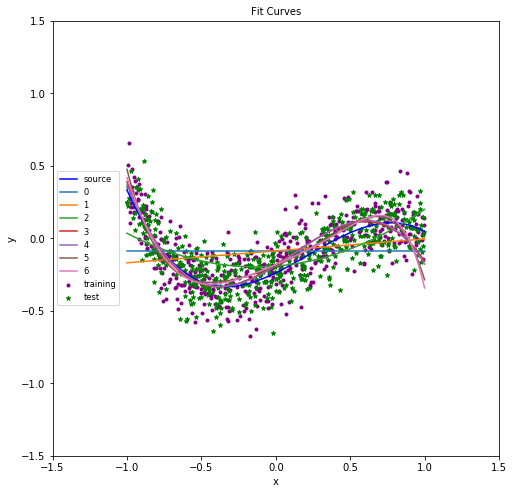

In [23]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

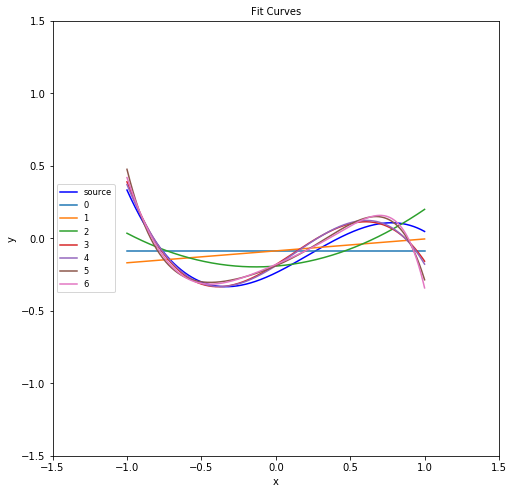

In [24]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

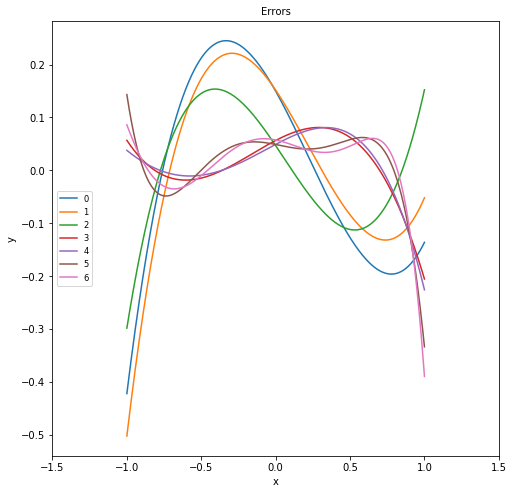

In [25]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

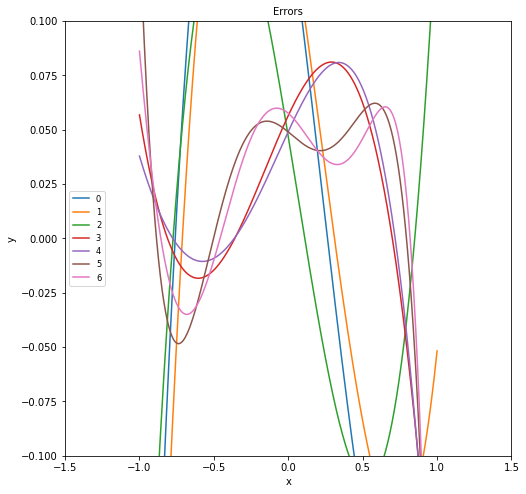

In [26]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

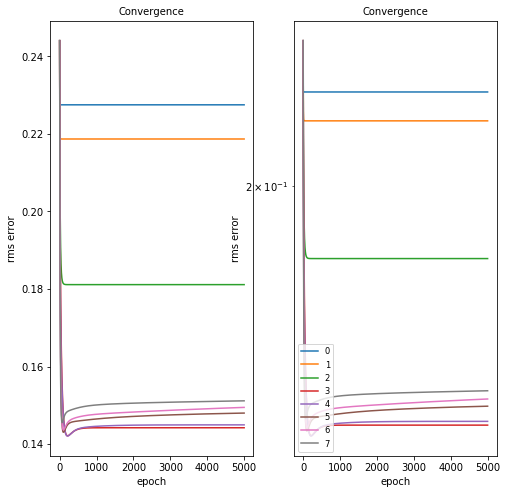

In [27]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


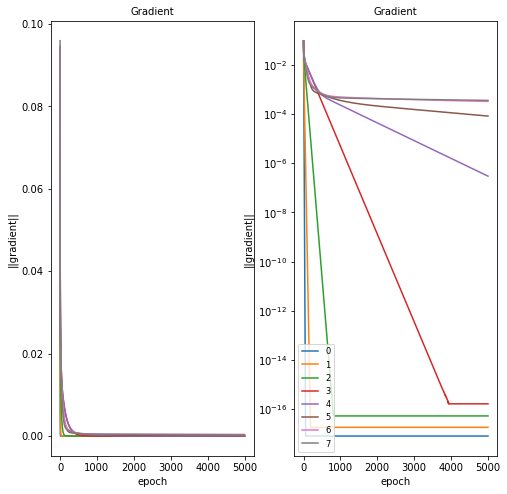

In [28]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


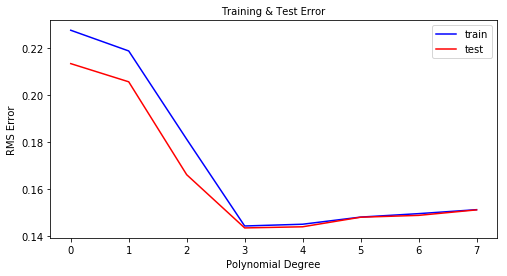

In [29]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        16
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           0
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


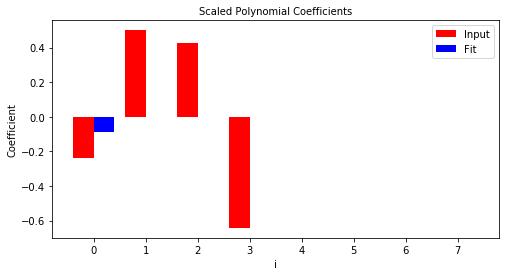

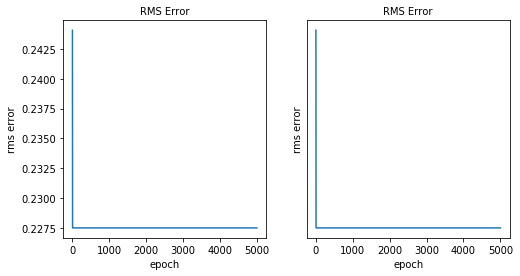

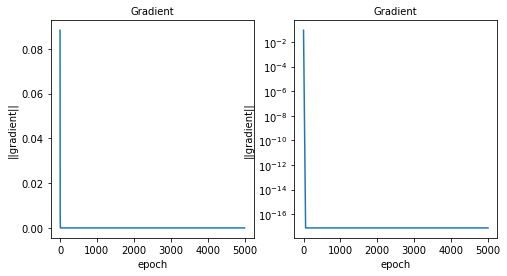

 
case_num:        17
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           0
inner loop:      5000000
train rms error: 0.277506145164
test rms error:  0.263324007207


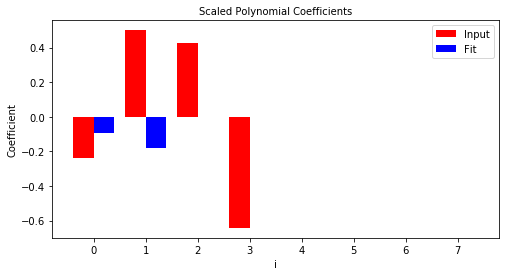

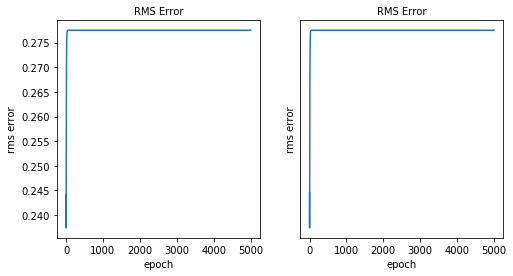

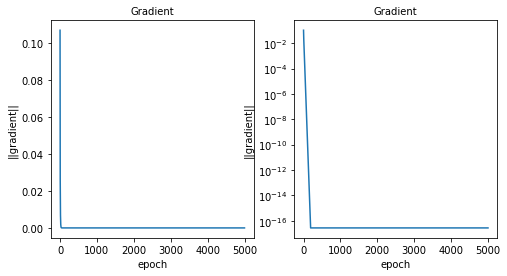

 
case_num:        18
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           0
inner loop:      7500000
train rms error: 0.411023993994
test rms error:  0.401064886084


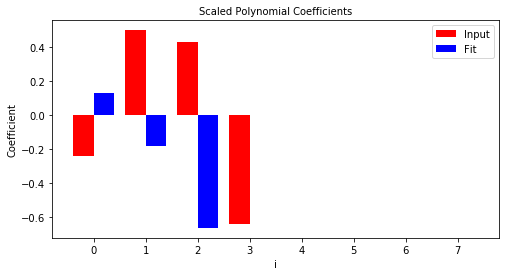

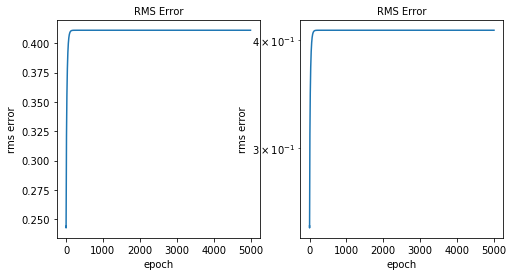

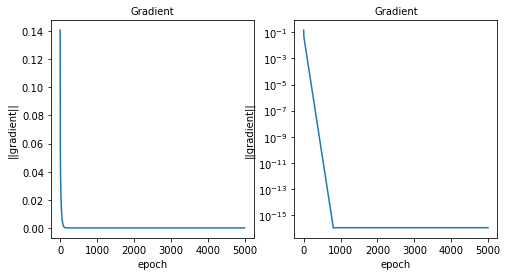

 
case_num:        19
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           0
inner loop:      10000000
train rms error: 0.475251816035
test rms error:  0.482151163104


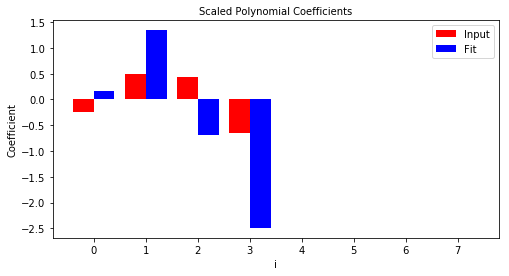

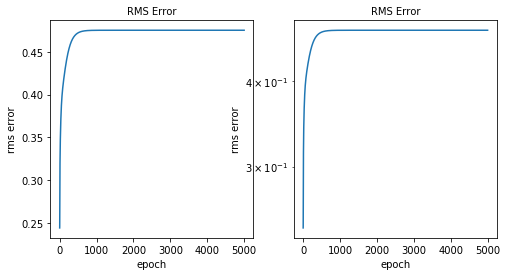

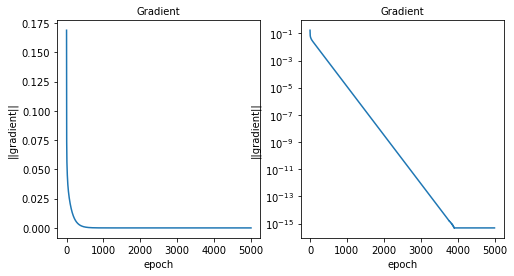

 
case_num:        20
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           0
inner loop:      12500000
train rms error: 0.51299694805
test rms error:  0.528631444148


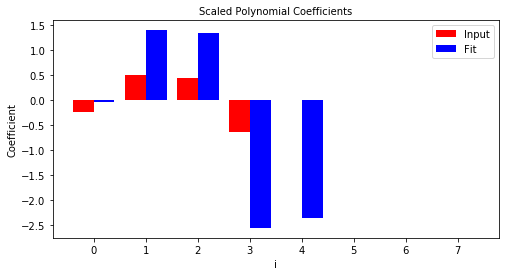

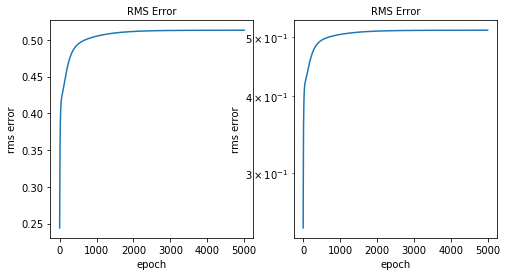

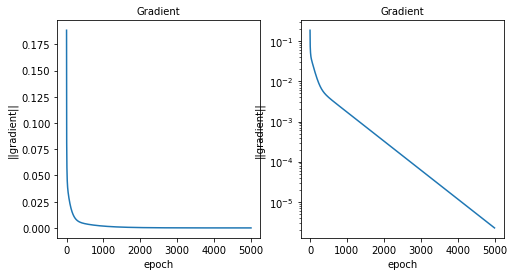

 
case_num:        21
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           0
inner loop:      15000000
train rms error: 0.583591114706
test rms error:  0.617114108979


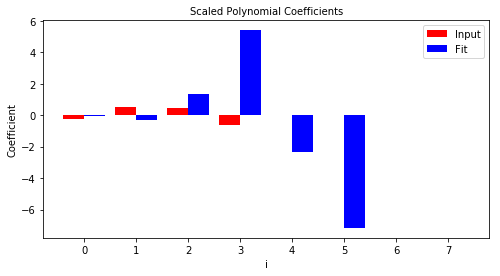

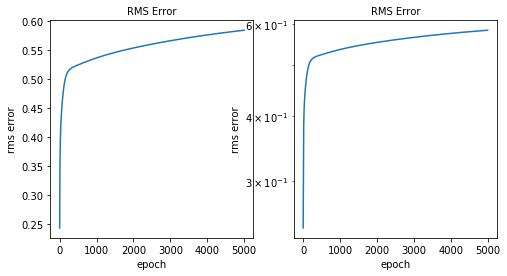

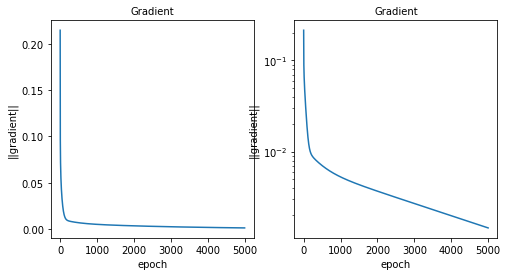

 
case_num:        22
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           0
inner loop:      17500000
train rms error: 0.615961673853
test rms error:  0.652414659983


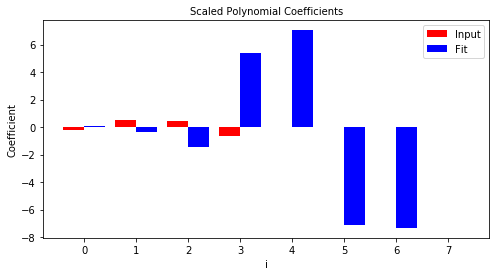

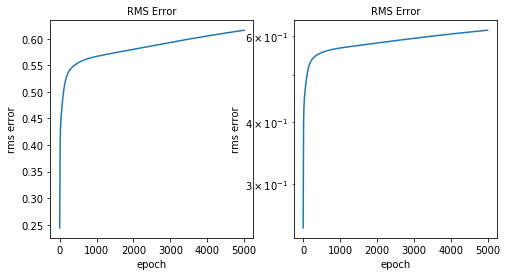

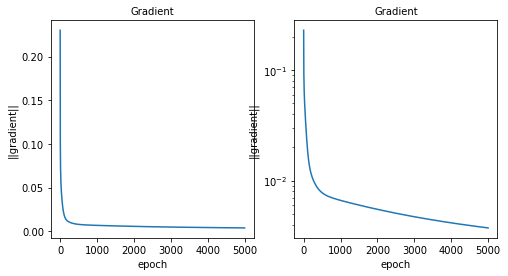

 
case_num:        23
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           0
inner loop:      20000000
train rms error: 0.664611838817
test rms error:  0.704608928834


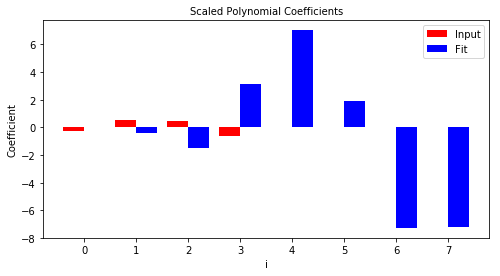

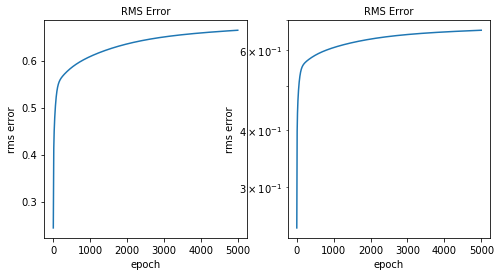

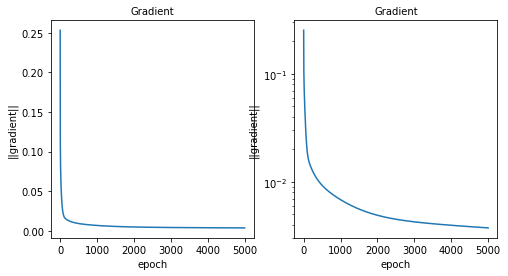

 
done


In [30]:
# Case: L1 regularization without power parameter, lambda=0.1
# Case parameters
# Type of regularization: 1 => L1 regularization
reg_type = 1
# Lambda: 0.1
lambda_reg = 0.1
# Power parameter: 0 => No power parameter
reg_power = 0
run(reg_type, lambda_reg, reg_power)

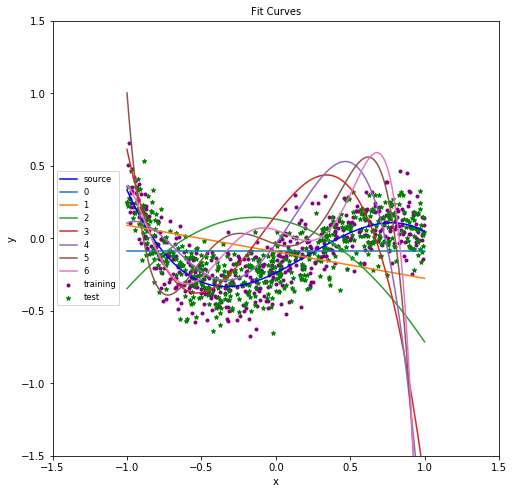

In [31]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

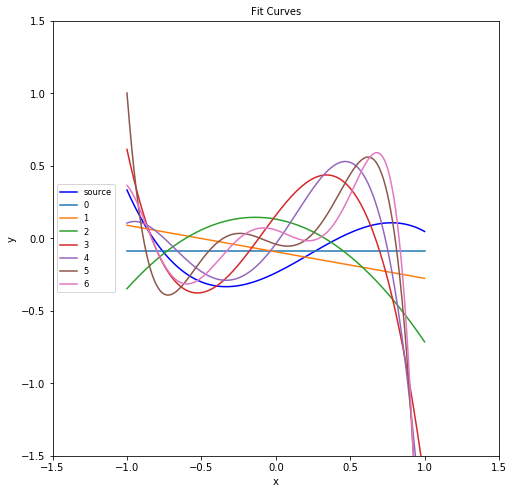

In [32]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

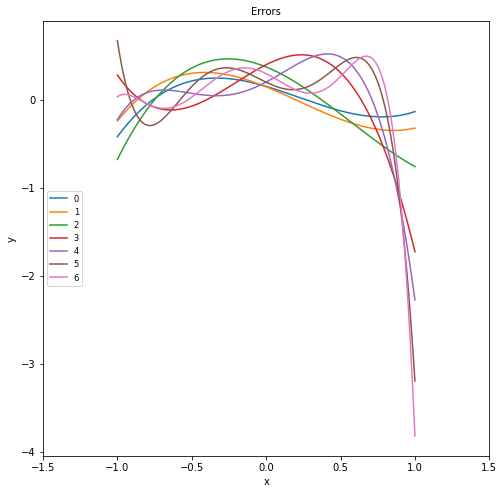

In [33]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

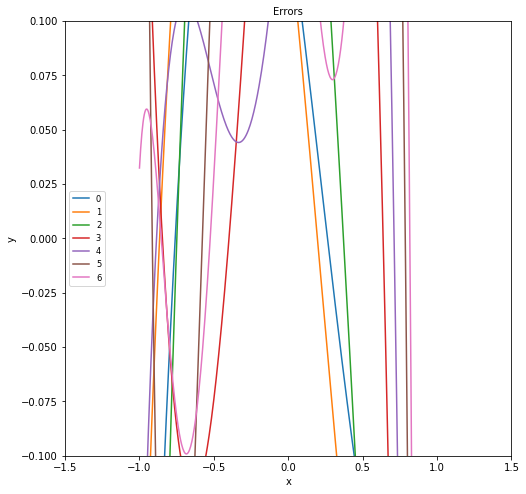

In [34]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

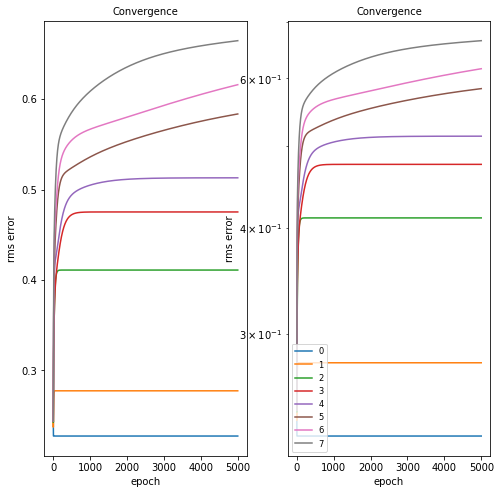

In [35]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


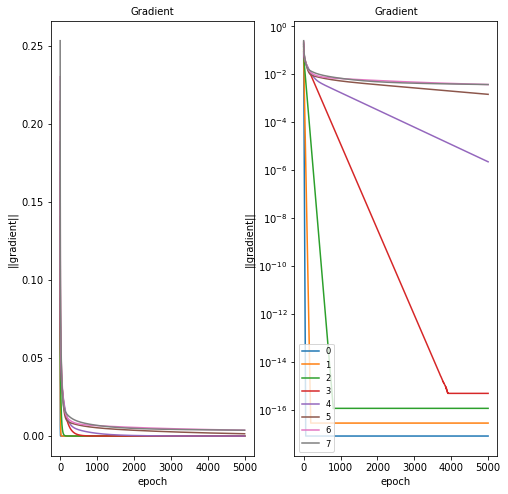

In [36]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


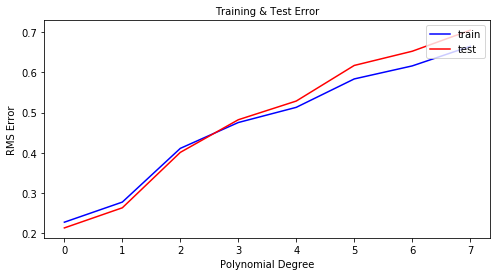

In [37]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        24
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           0
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


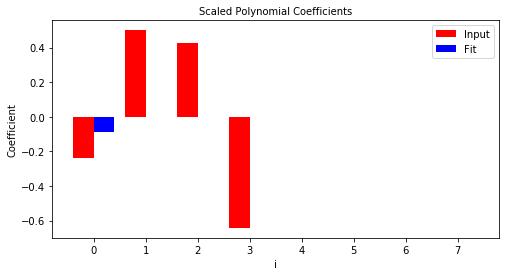

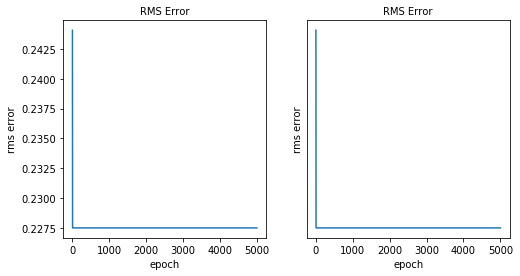

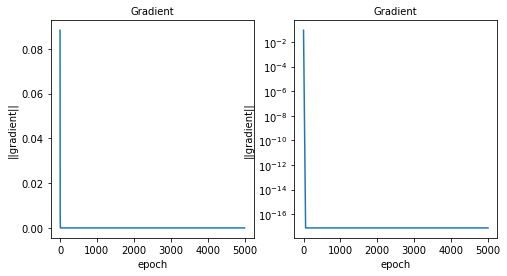

 
case_num:        25
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           0
inner loop:      5000000
train rms error: 1.7306151346
test rms error:  1.72861778586


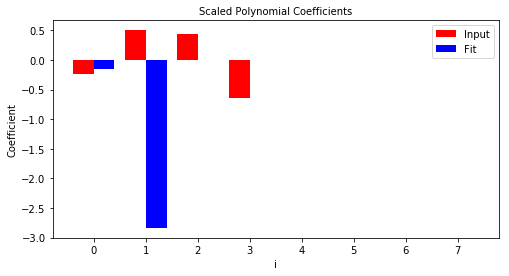

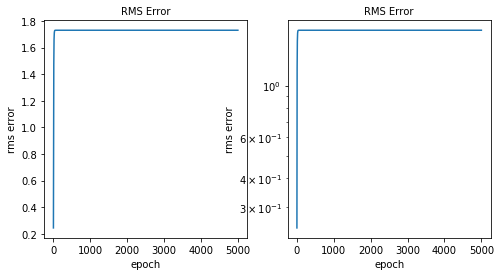

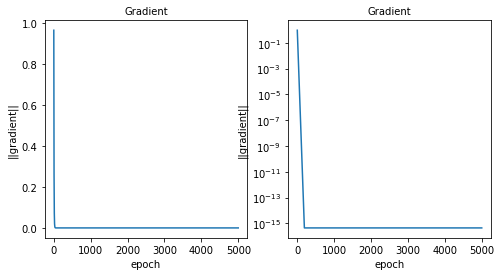

 
case_num:        26
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           0
inner loop:      7500000
train rms error: 3.71242230269
test rms error:  3.71668741362


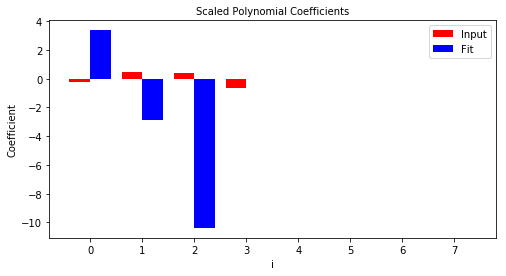

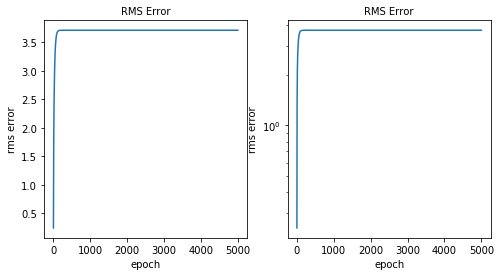

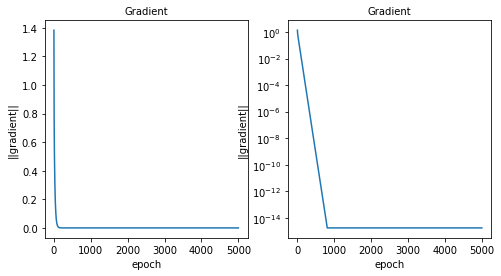

 
case_num:        27
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           0
inner loop:      10000000
train rms error: 4.55329775097
test rms error:  4.57771185472


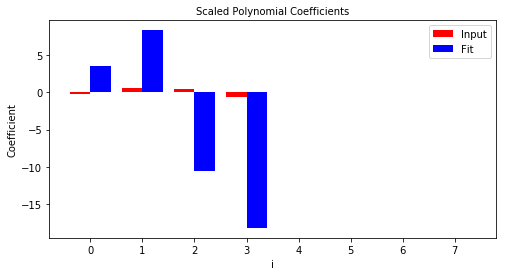

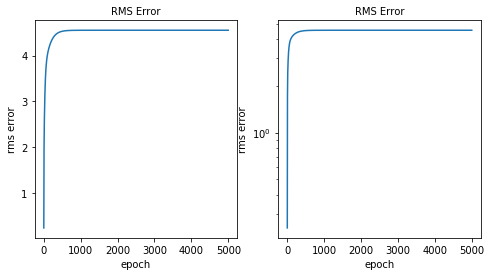

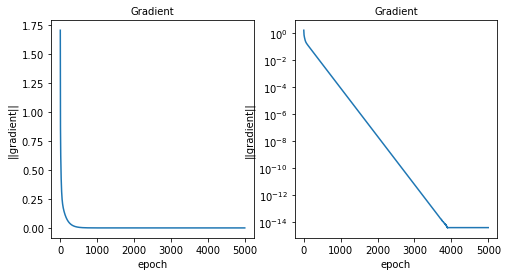

 
case_num:        28
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           0
inner loop:      12500000
train rms error: 4.94757042202
test rms error:  5.10430778551


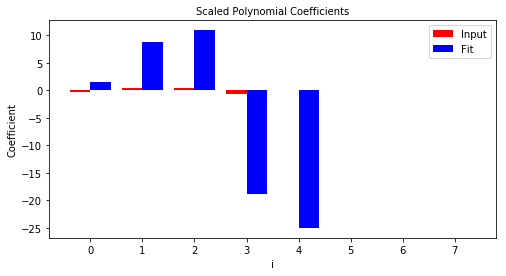

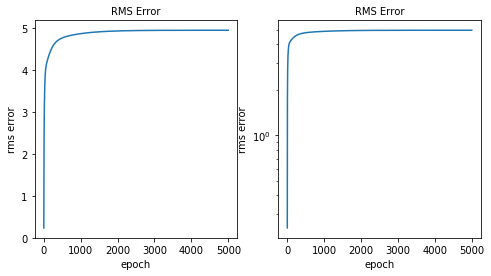

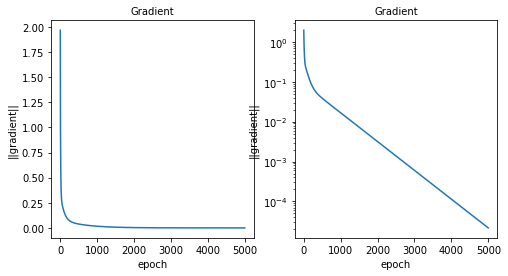

 
case_num:        29
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           0
inner loop:      15000000
train rms error: 5.66600056052
test rms error:  6.0005998219


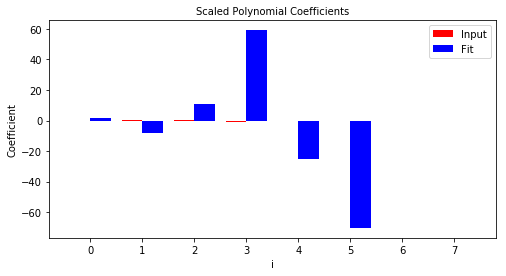

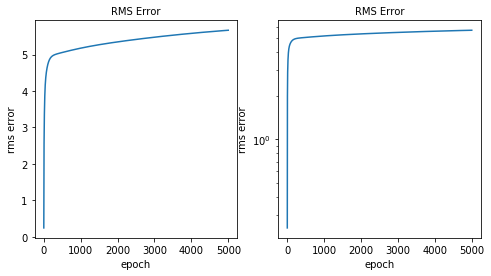

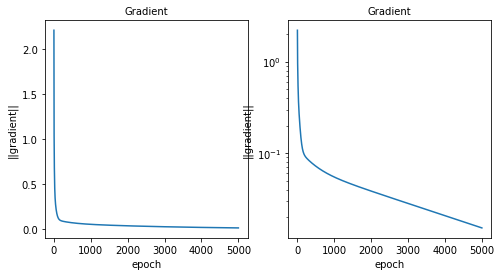

 
case_num:        30
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           0
inner loop:      17500000
train rms error: 5.99390379757
test rms error:  6.38157337075


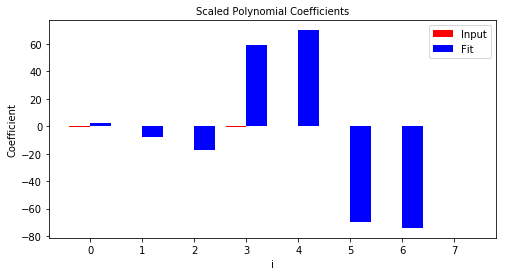

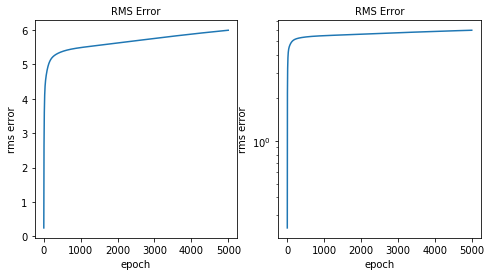

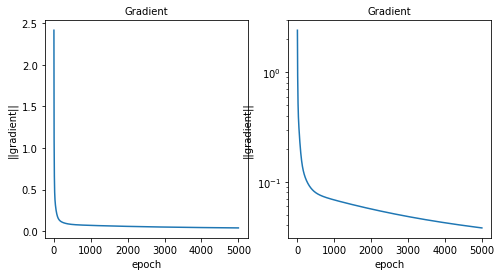

 
case_num:        31
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           0
inner loop:      20000000
train rms error: 6.5015341013
test rms error:  6.91447472743


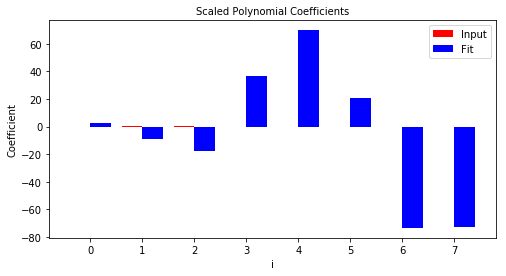

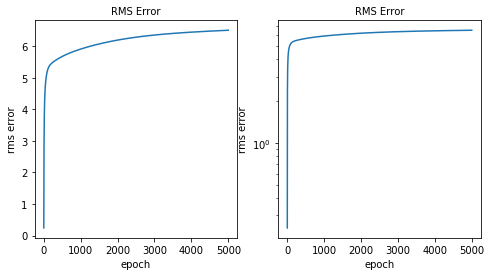

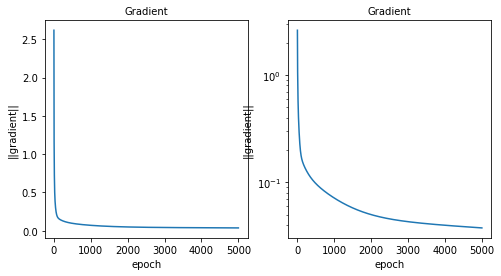

 
done


In [38]:
# Case: L1 regularization without power parameter, lambda=1
# Case parameters
# Type of regularization: 1 => L1 regularization
reg_type = 1
# Lambda: 1
lambda_reg = 1
# Power parameter: 0 => No power parameter
reg_power = 0
run(reg_type, lambda_reg, reg_power)

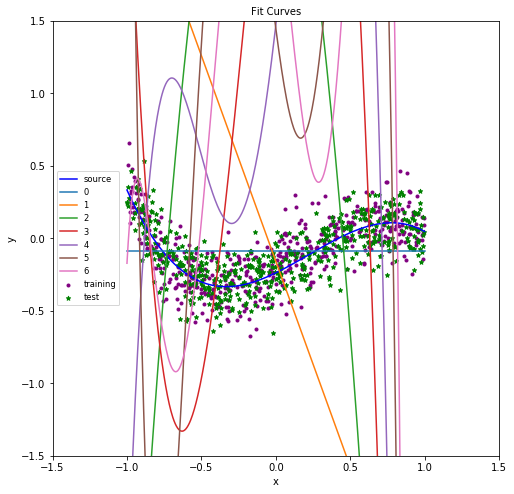

In [39]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

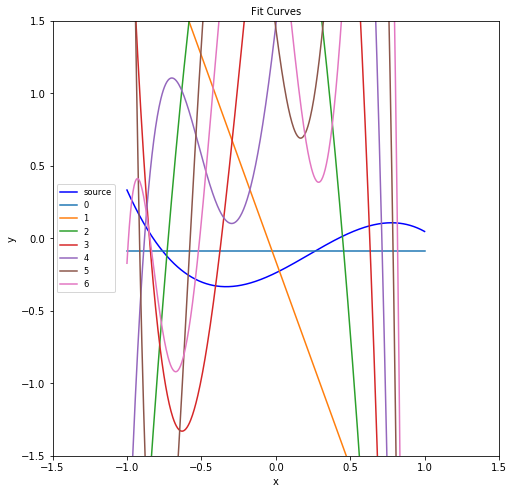

In [40]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

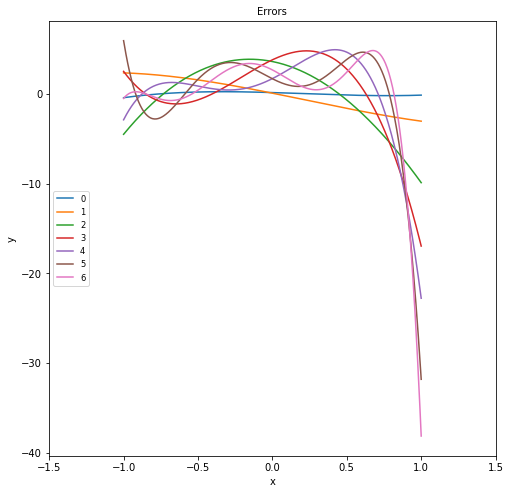

In [41]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

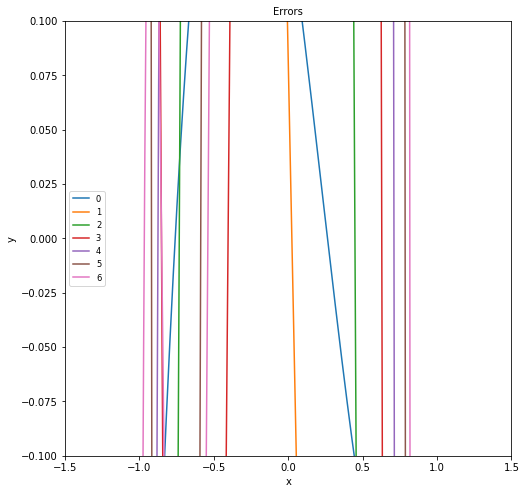

In [42]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

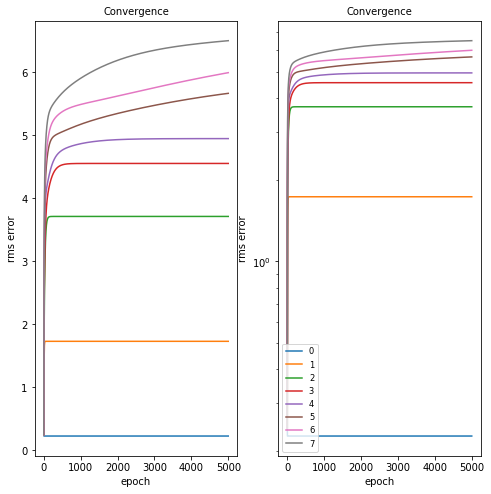

In [43]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


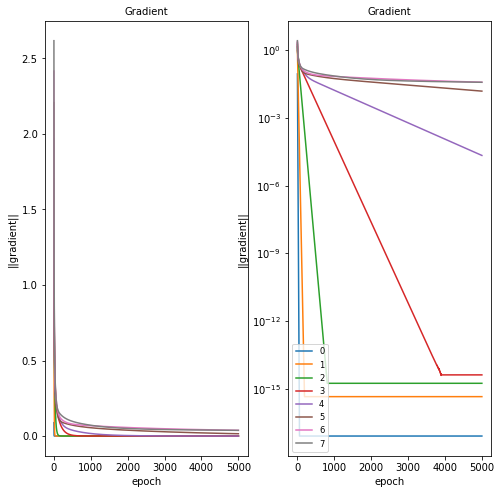

In [44]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


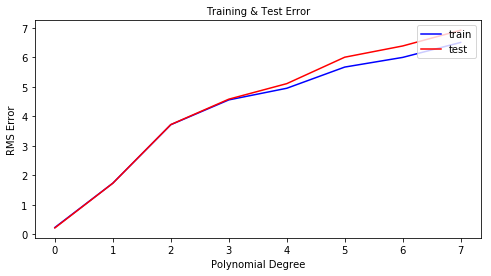

In [45]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        32
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           0
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


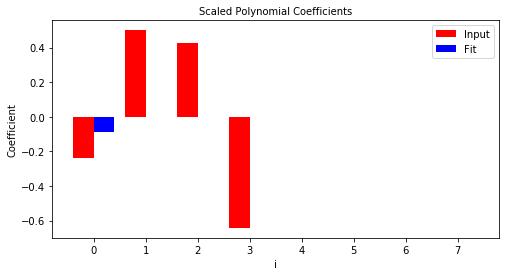

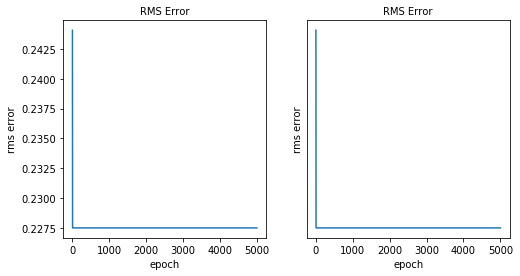

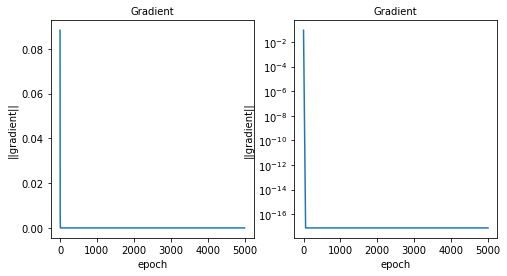

 
case_num:        33
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           0
inner loop:      5000000
train rms error: 17.1696516299
test rms error:  17.232952951


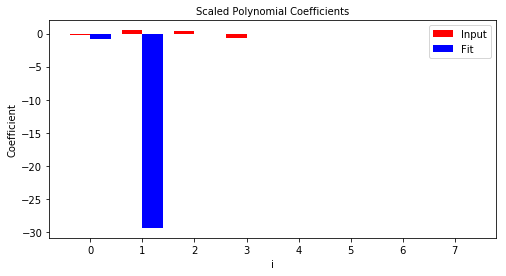

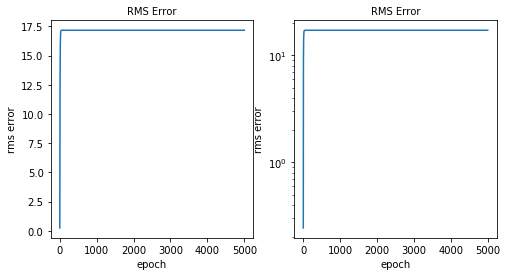

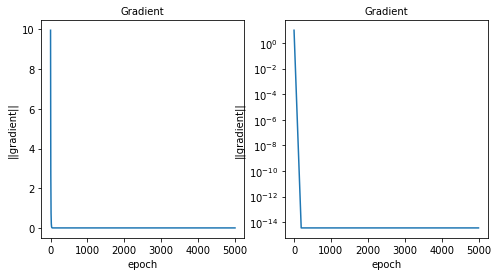

 
case_num:        34
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           0
inner loop:      7500000
train rms error: 37.0822860992
test rms error:  37.1799686194


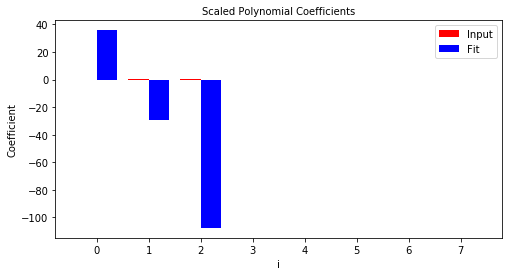

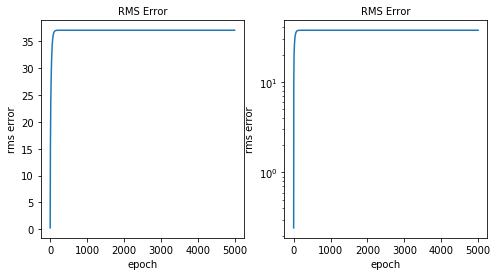

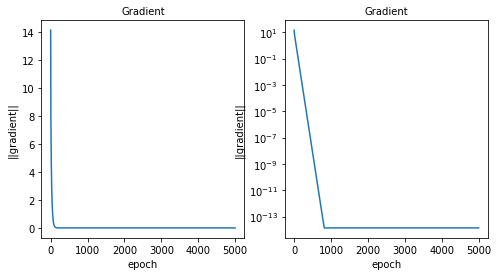

 
case_num:        35
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           0
inner loop:      10000000
train rms error: 45.5126150913
test rms error:  45.700917762


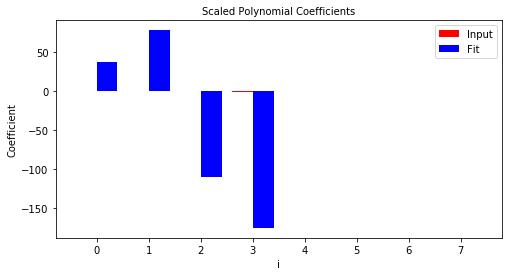

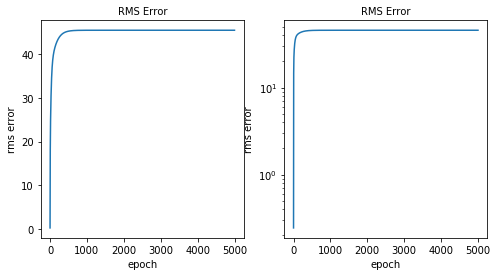

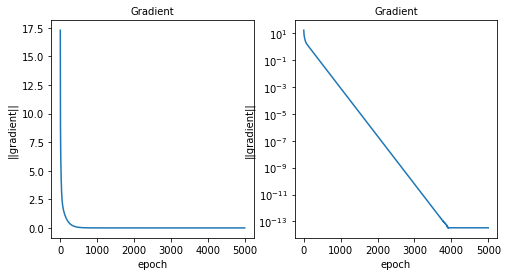

 
case_num:        36
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           0
inner loop:      12500000
train rms error: 49.4571281287
test rms error:  51.0146782866


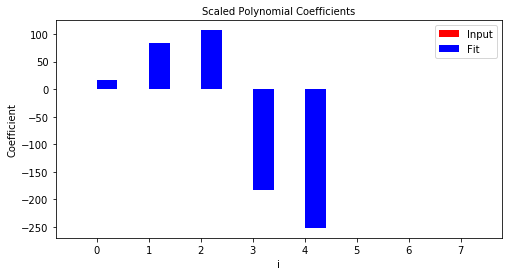

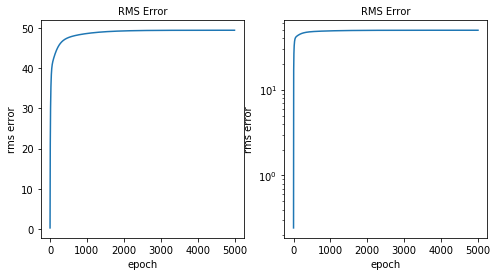

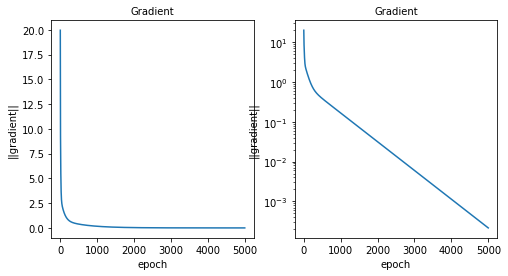

 
case_num:        37
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           0
inner loop:      15000000
train rms error: 56.633533095
test rms error:  59.9663588657


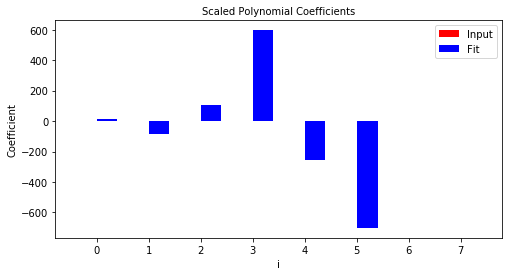

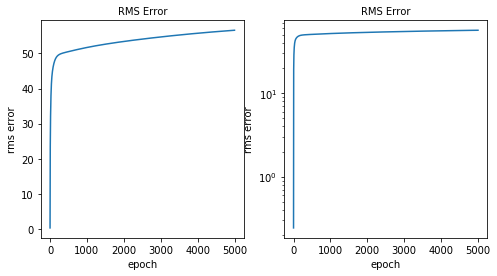

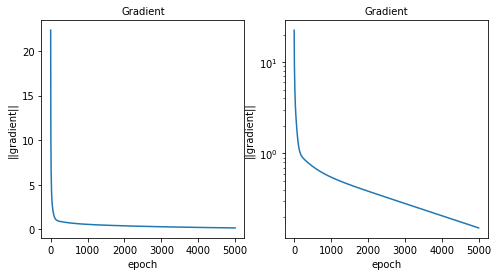

 
case_num:        38
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           0
inner loop:      17500000
train rms error: 59.9089345537
test rms error:  63.7971072945


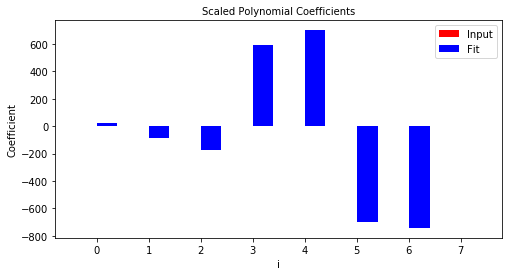

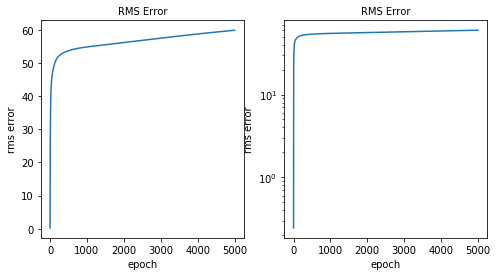

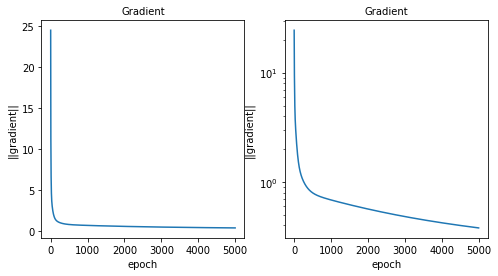

 
case_num:        39
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           0
inner loop:      20000000
train rms error: 64.9962779663
test rms error:  69.1277146743


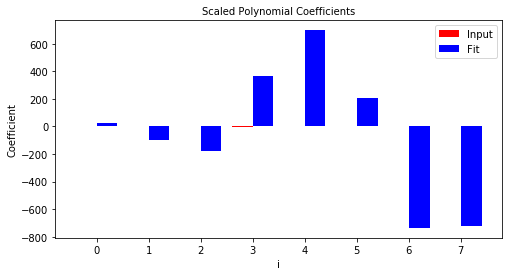

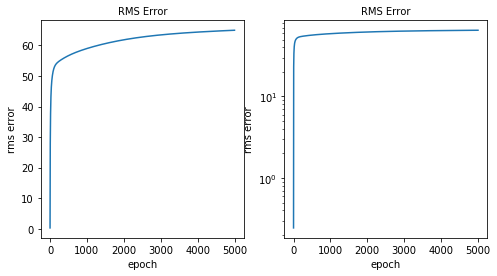

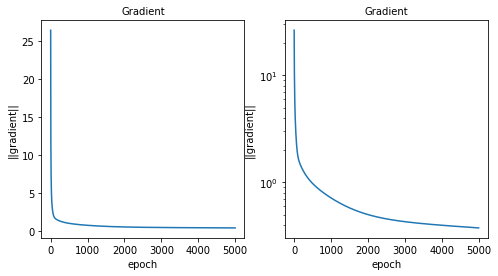

 
done


In [46]:
# Case: L1 regularization without power parameter, lambda=10
# Case parameters
# Type of regularization: 1 => L1 regularization
reg_type = 1
# Lambda: 10
lambda_reg = 10
# Power parameter: 0 => No power parameter
reg_power = 0
run(reg_type, lambda_reg, reg_power)

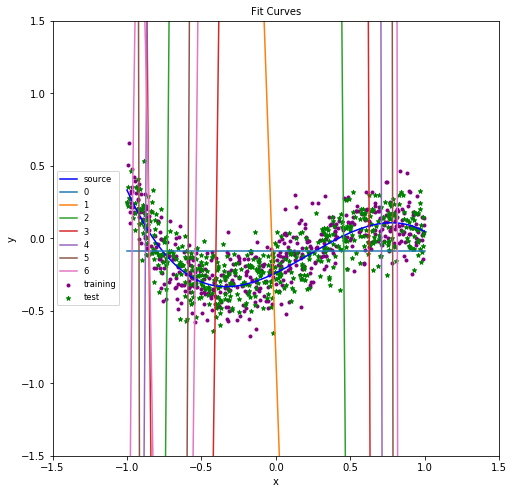

In [47]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

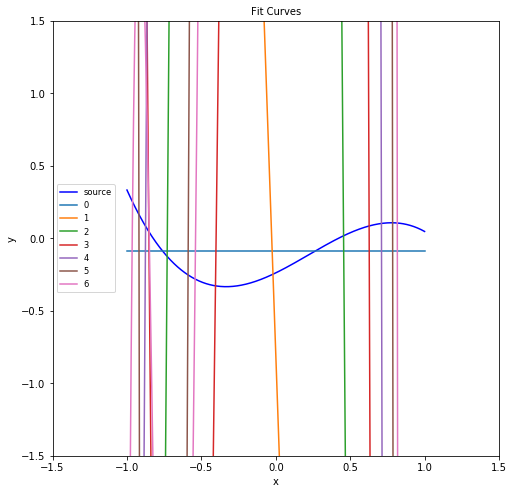

In [48]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

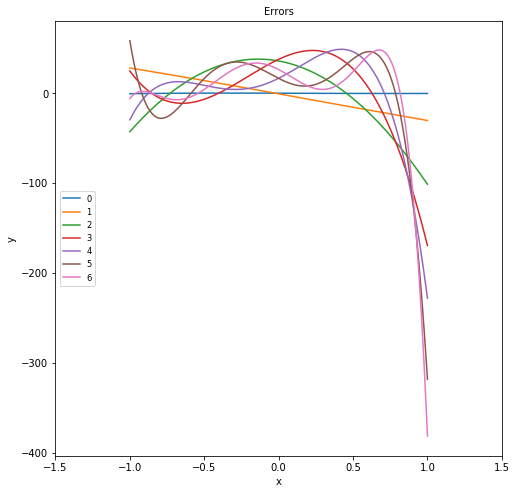

In [49]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

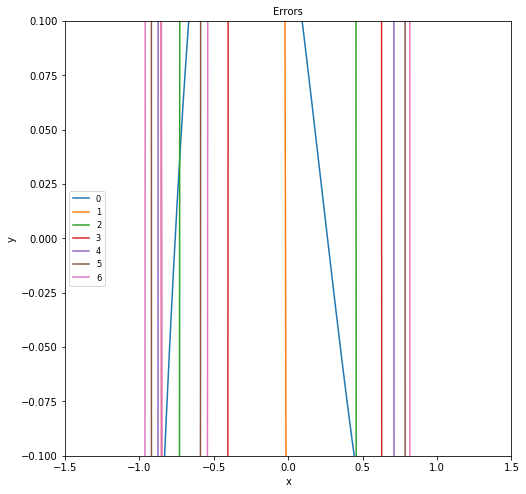

In [50]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

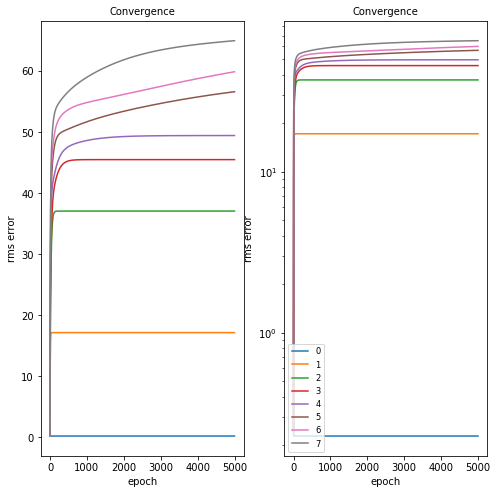

In [51]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


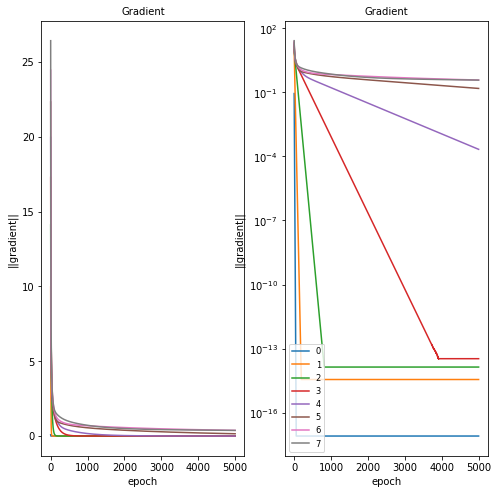

In [52]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


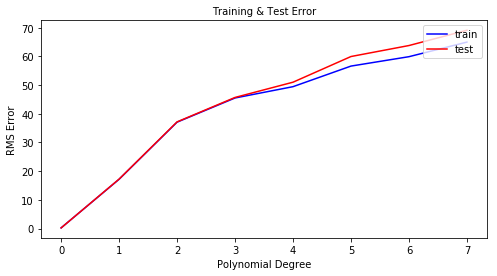

In [53]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        40
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           0
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


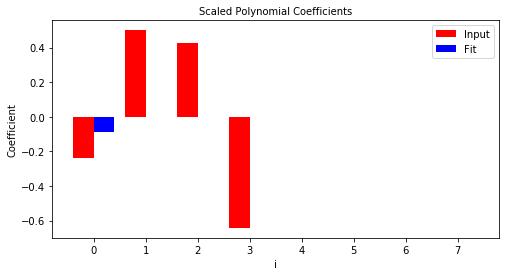

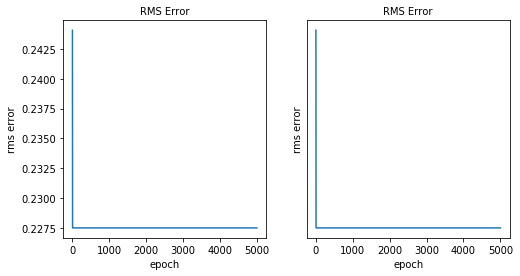

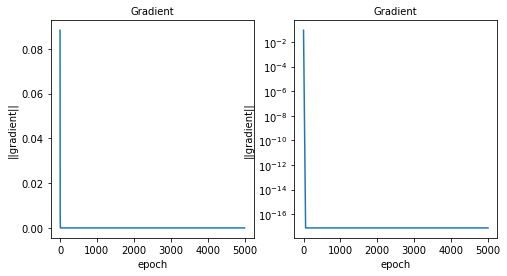

 
case_num:        41
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           0
inner loop:      5000000
train rms error: 171.682811522
test rms error:  172.385367785


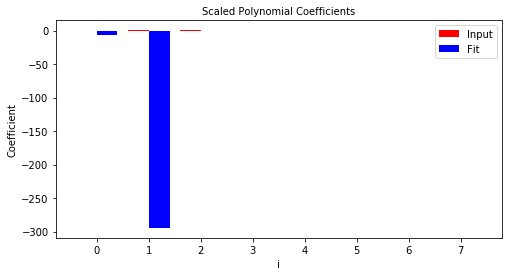

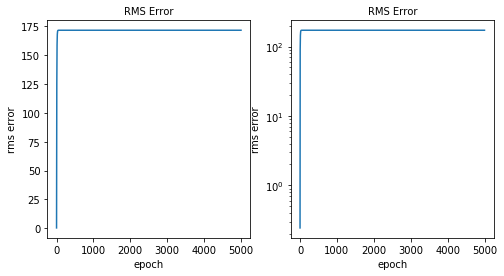

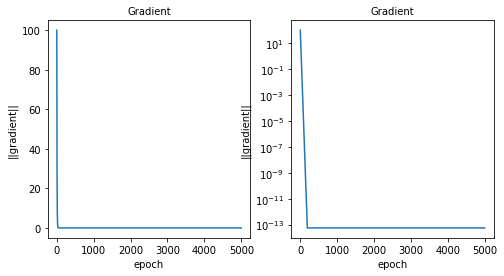

 
case_num:        42
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           0
inner loop:      7500000
train rms error: 370.818664904
test rms error:  371.844632759


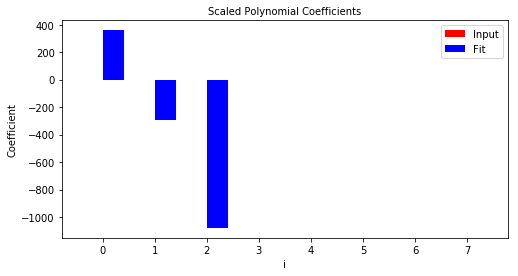

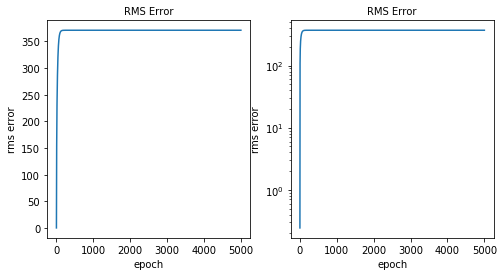

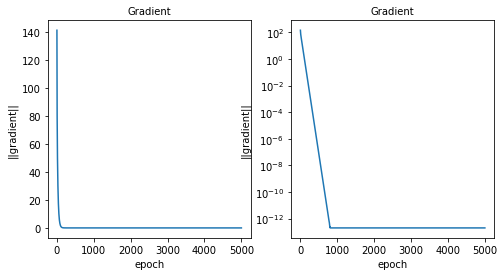

 
case_num:        43
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           0
inner loop:      10000000
train rms error: 455.124114211
test rms error:  456.950354015


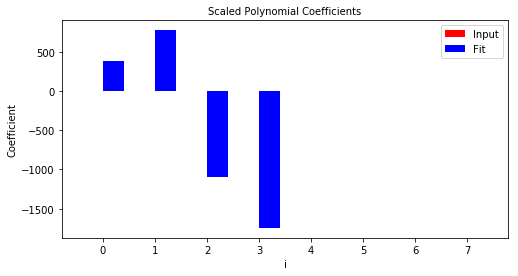

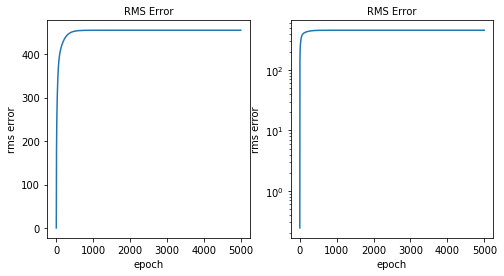

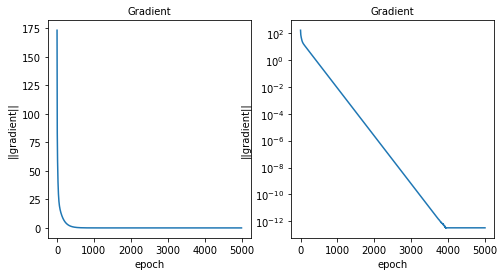

 
case_num:        44
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           0
inner loop:      12500000
train rms error: 494.569426848
test rms error:  510.13406996


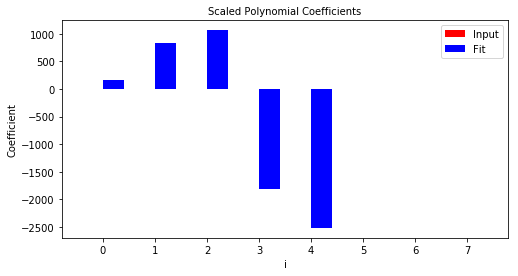

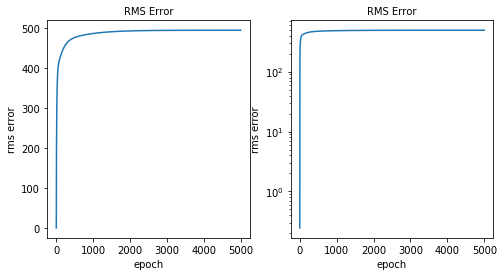

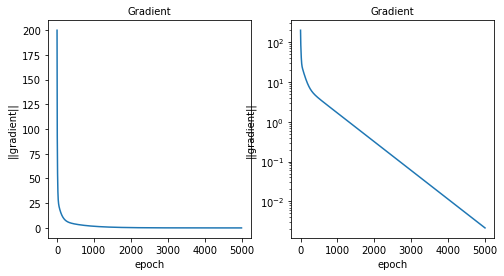

 
case_num:        45
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           0
inner loop:      15000000
train rms error: 566.32345814
test rms error:  599.637278285


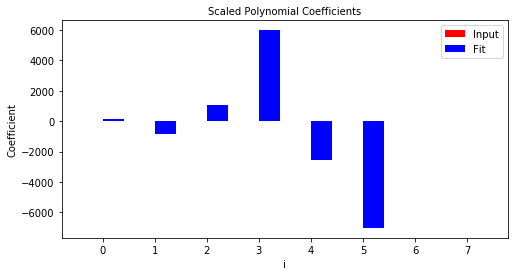

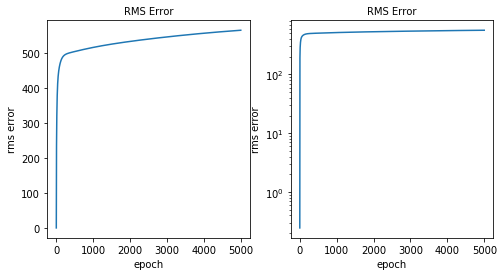

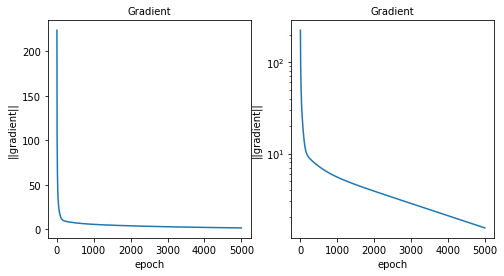

 
case_num:        46
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           0
inner loop:      17500000
train rms error: 599.073032039
test rms error:  637.965001667


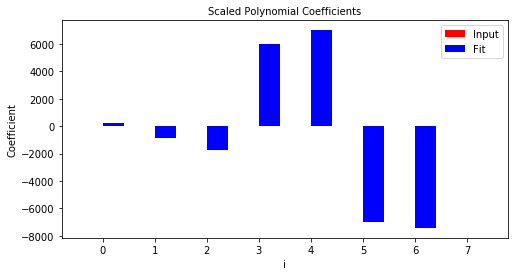

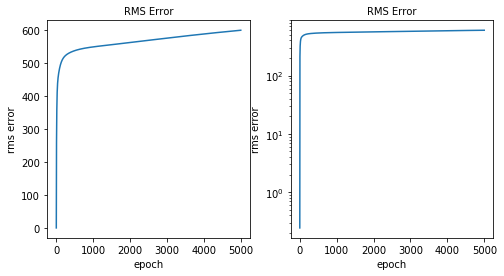

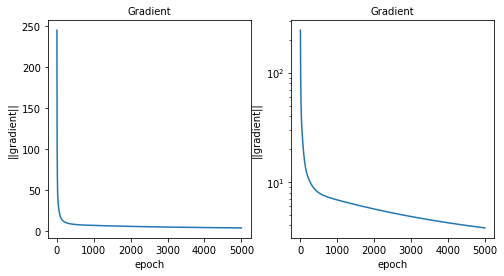

 
case_num:        47
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           0
inner loop:      20000000
train rms error: 649.956430688
test rms error:  691.271698545


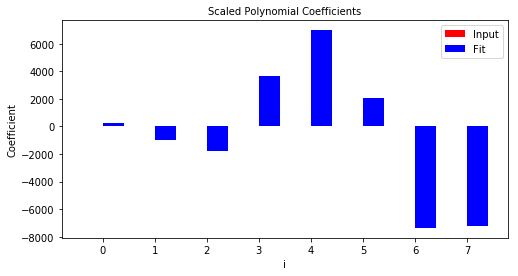

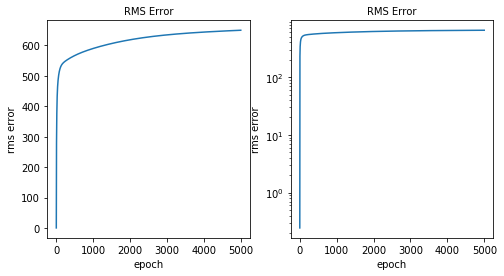

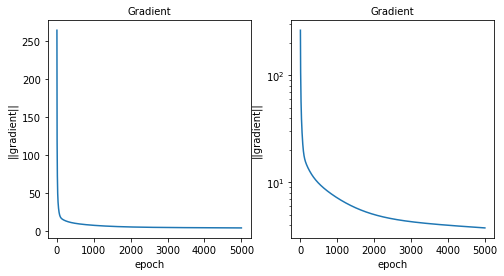

 
done


In [54]:
# Case: L1 regularization without power parameter, lambda=100
# Case parameters
# Type of regularization: 1 => L1 regularization
reg_type = 1
# Lambda: 100
lambda_reg = 100
# Power parameter: 0 => No power parameter
reg_power = 0
run(reg_type, lambda_reg, reg_power)

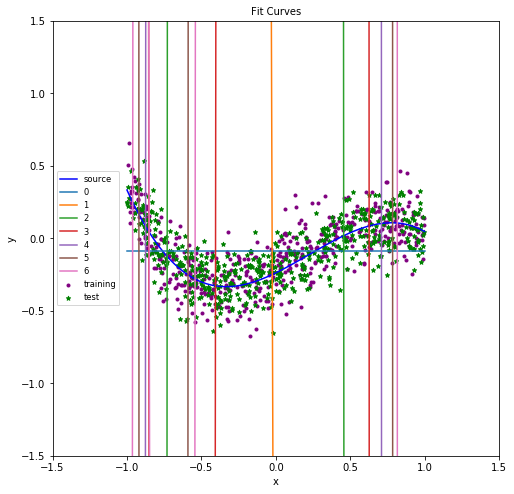

In [55]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

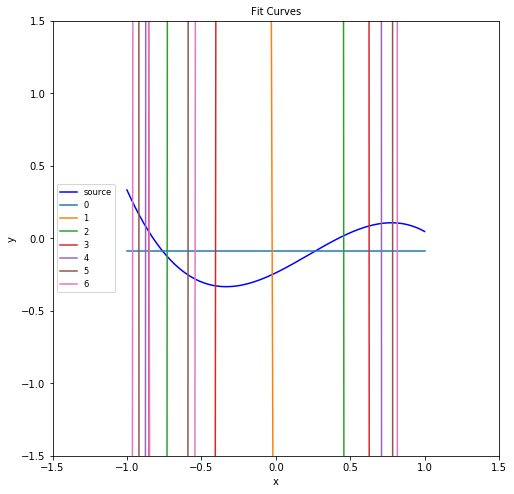

In [56]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

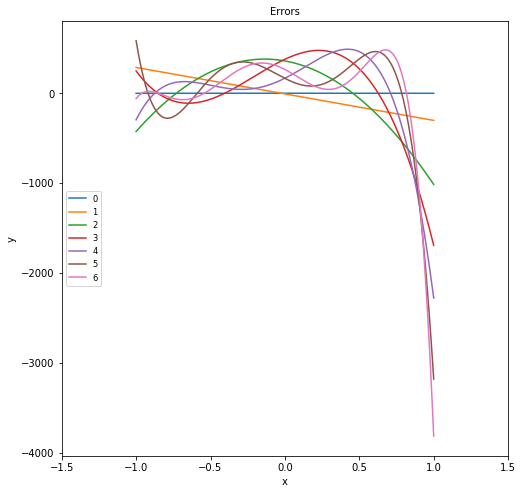

In [57]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

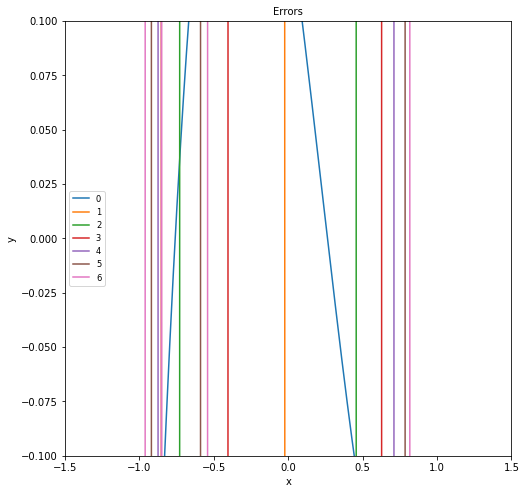

In [58]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

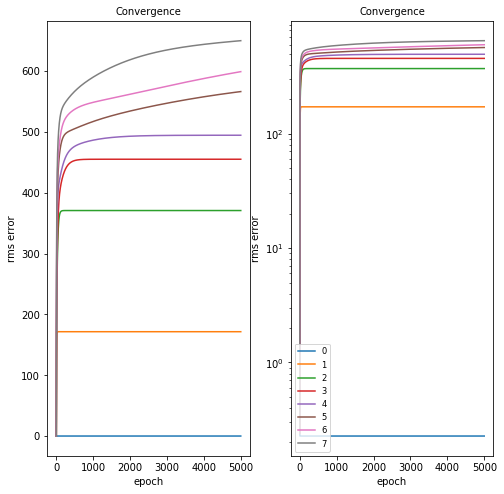

In [59]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


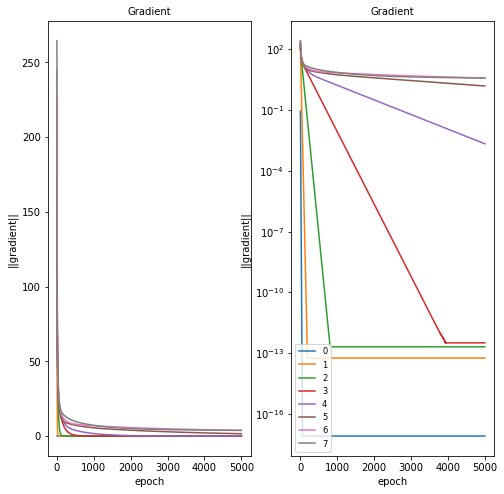

In [60]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


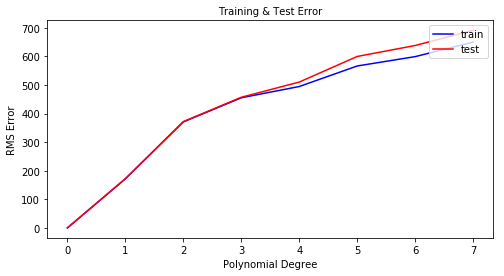

In [61]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

## -----------------------------L1 Regularization with power parameter----------------------------


case_num:        48
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           1
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


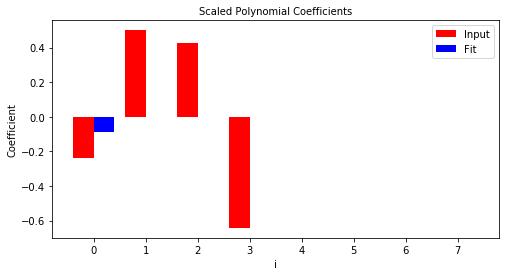

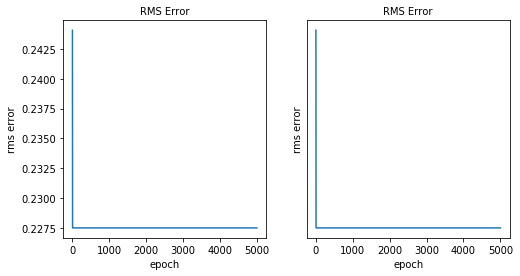

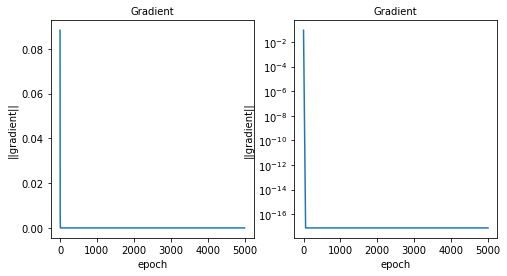

 
case_num:        49
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           1
inner loop:      5000000
train rms error: 0.218699496499
test rms error:  0.205573076748


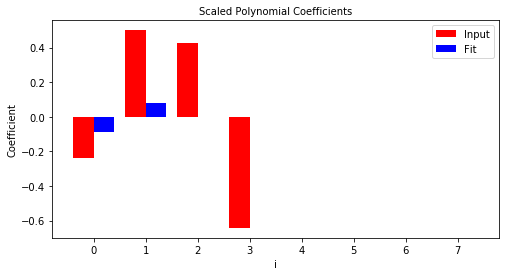

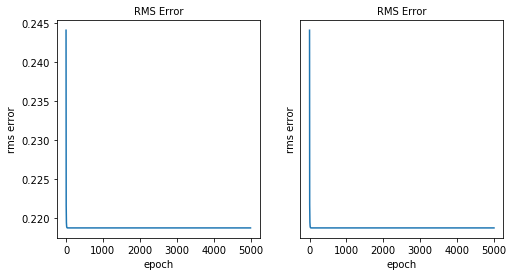

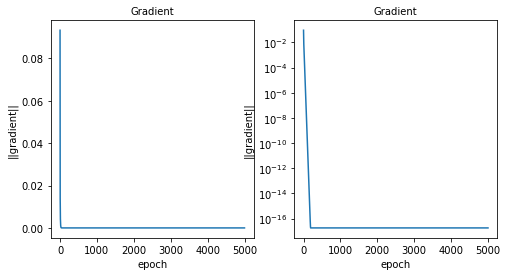

 
case_num:        50
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           1
inner loop:      7500000
train rms error: 0.189865049384
test rms error:  0.175391192801


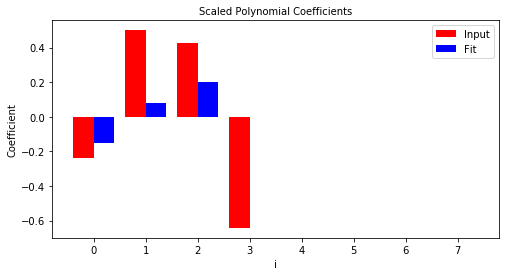

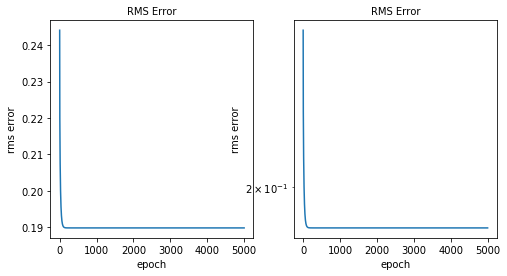

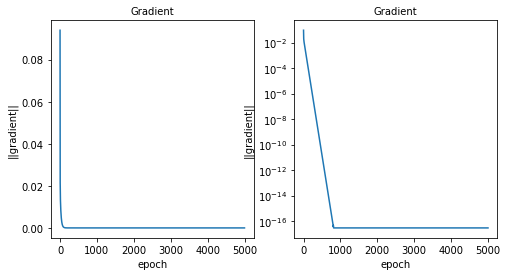

 
case_num:        51
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           1
inner loop:      10000000
train rms error: 0.220806060016
test rms error:  0.23189572026


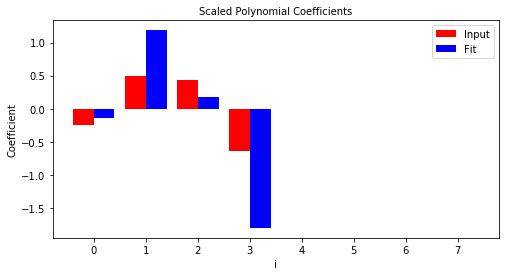

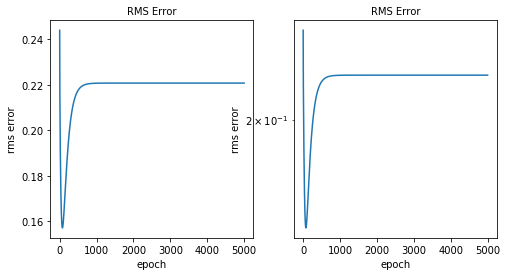

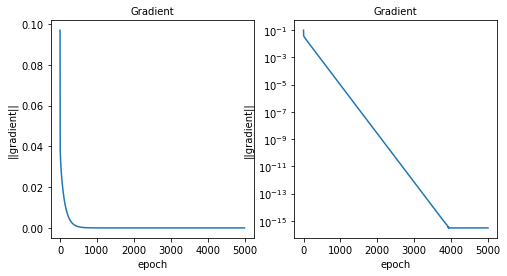

 
case_num:        52
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           1
inner loop:      12500000
train rms error: 0.376879652472
test rms error:  0.389980825924


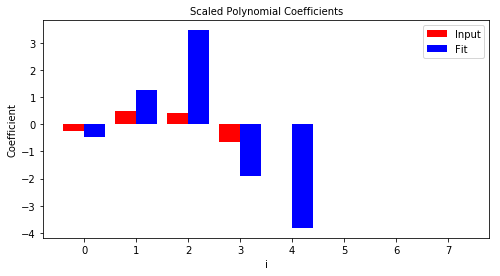

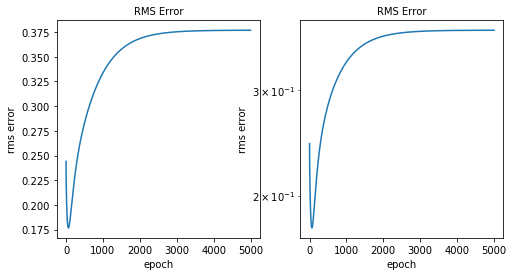

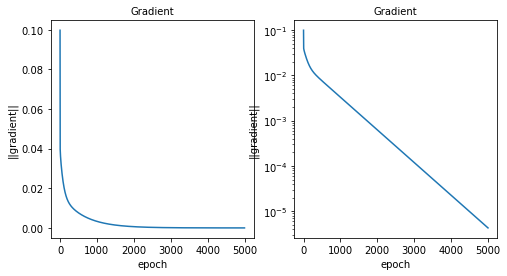

 
case_num:        53
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           1
inner loop:      15000000
train rms error: 0.55421469403
test rms error:  0.579813229001


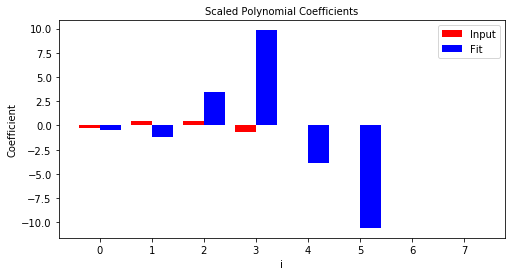

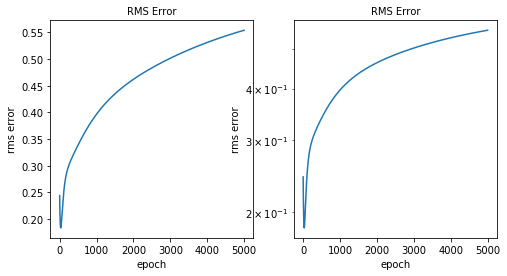

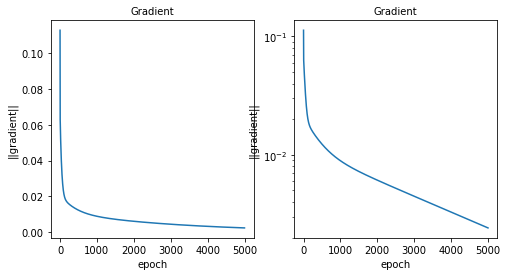

 
case_num:        54
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           1
inner loop:      17500000
train rms error: 0.642681276471
test rms error:  0.666417391658


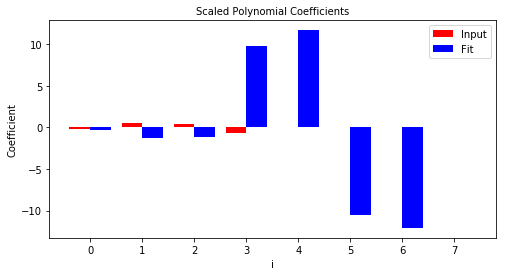

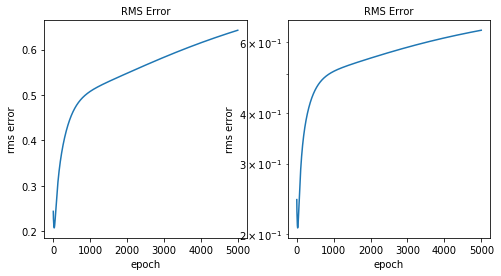

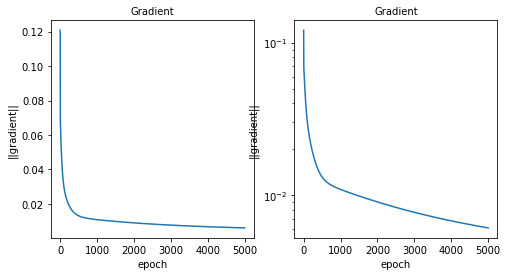

 
case_num:        55
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  1
Power:           1
inner loop:      20000000
train rms error: 0.809594018994
test rms error:  0.831592550726


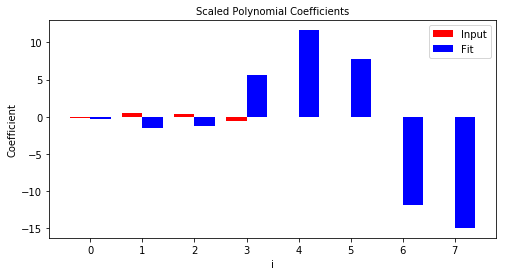

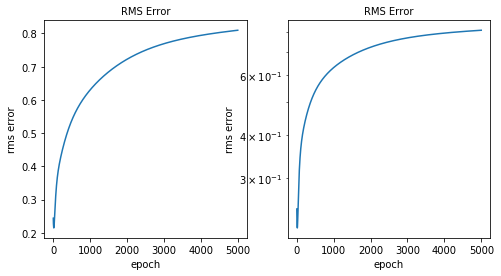

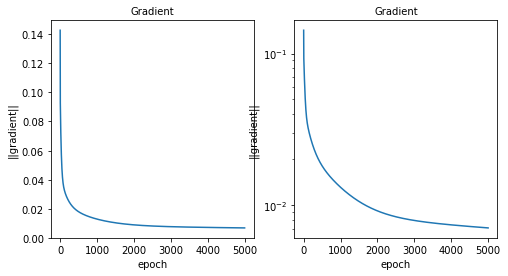

 
done


In [62]:
# Case: L1 regularization with power parameter, lambda=0.01
# Case parameters
# Type of regularization: 1 => L1 regularization
reg_type = 1
# Lambda: 0.01
lambda_reg = 0.01
# Power parameter: 1
reg_power = 1
run(reg_type, lambda_reg, reg_power)

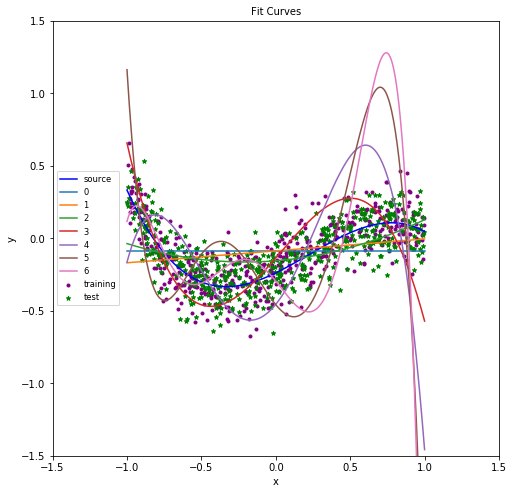

In [63]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

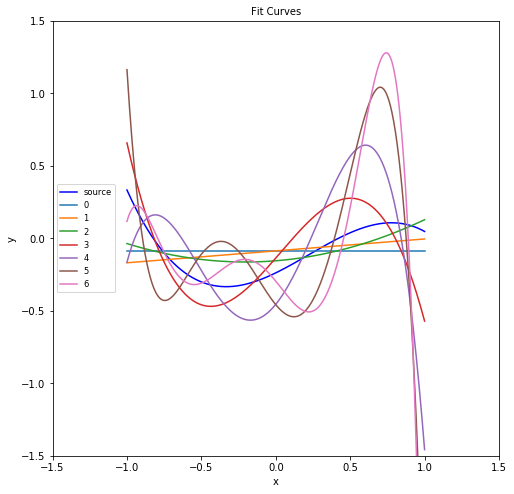

In [64]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

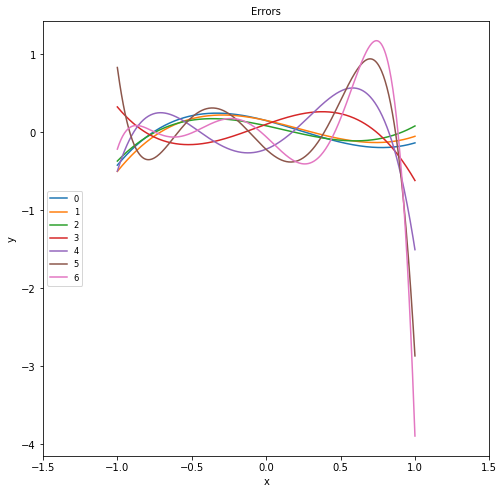

In [65]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

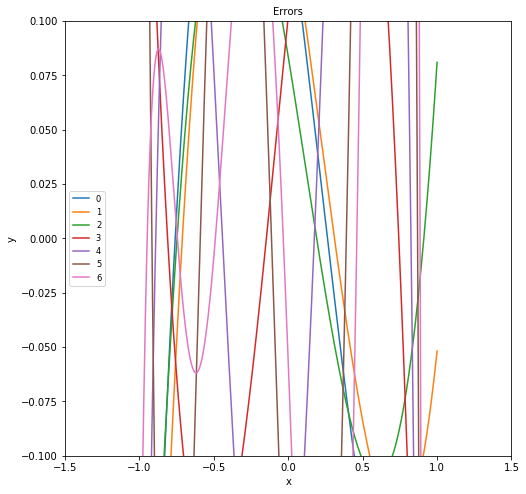

In [66]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

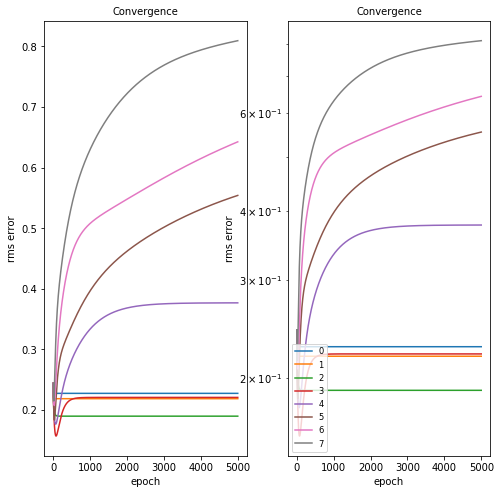

In [67]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


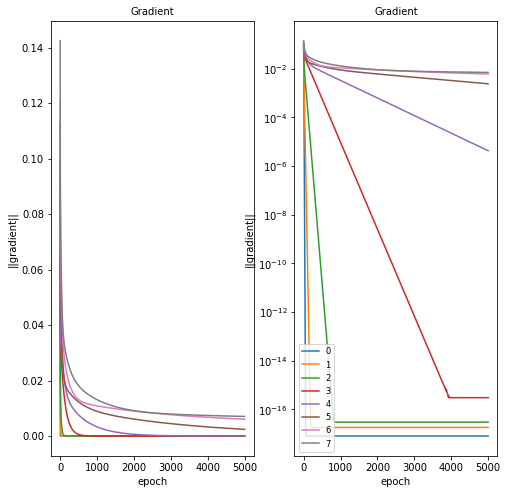

In [68]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


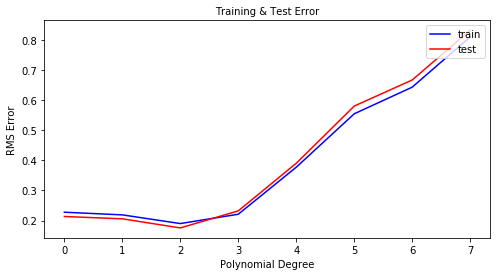

In [69]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        56
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           1
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


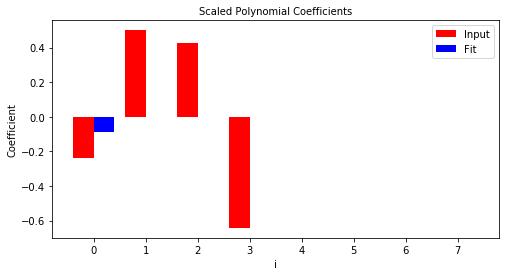

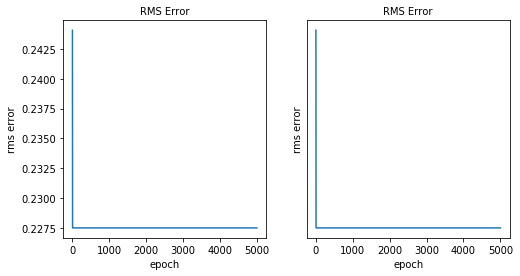

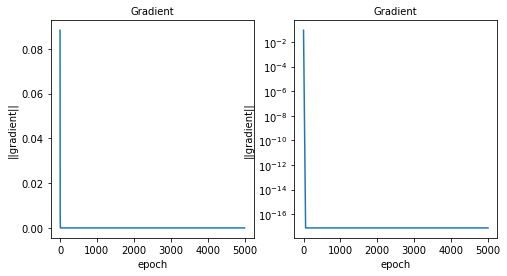

 
case_num:        57
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           1
inner loop:      5000000
train rms error: 0.277506145164
test rms error:  0.263324007207


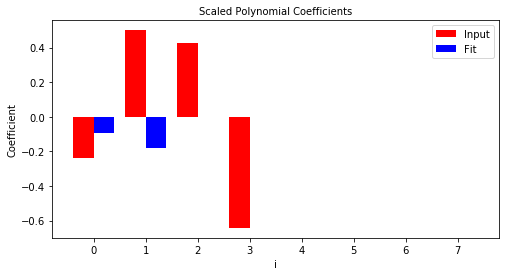

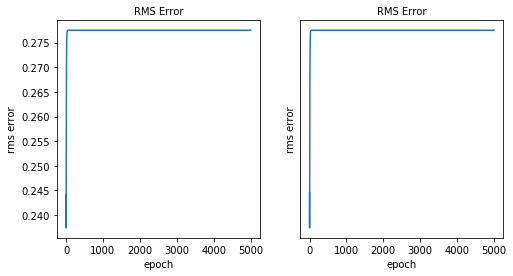

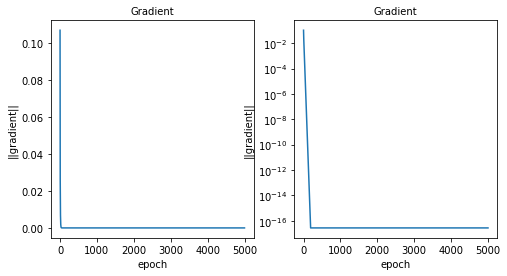

 
case_num:        58
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           1
inner loop:      7500000
train rms error: 0.702054618522
test rms error:  0.691494878228


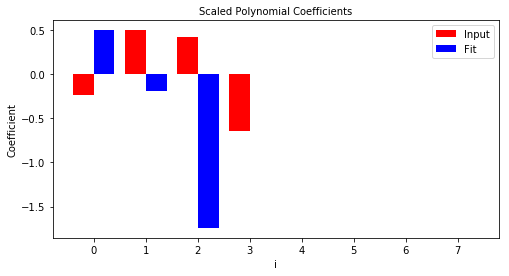

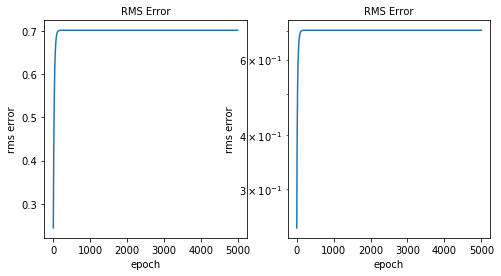

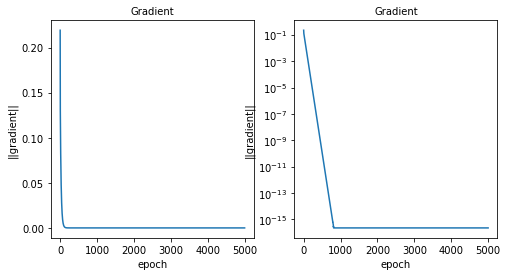

 
case_num:        59
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           1
inner loop:      10000000
train rms error: 1.73828166837
test rms error:  1.76239991224


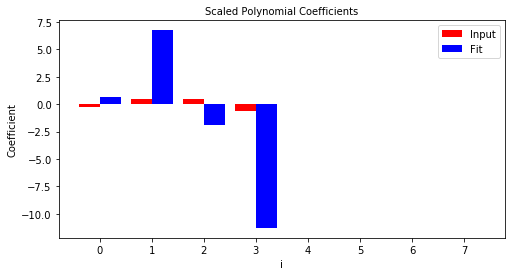

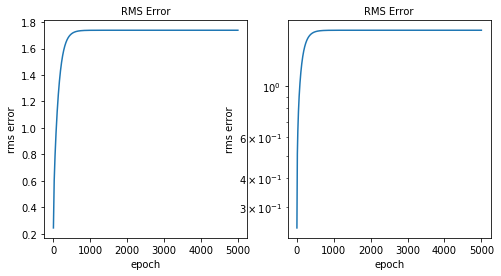

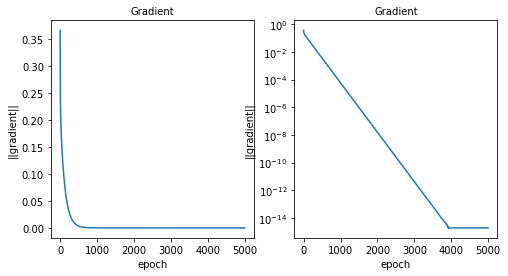

 
case_num:        60
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           1
inner loop:      12500000
train rms error: 3.51649403982
test rms error:  3.67219859382


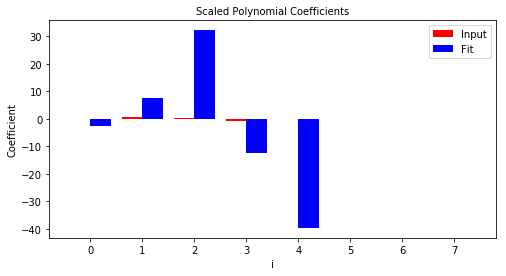

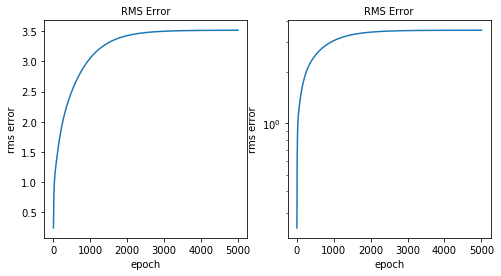

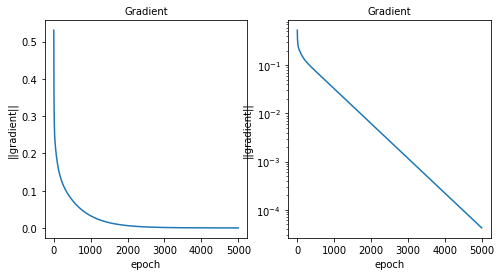

 
case_num:        61
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           1
inner loop:      15000000
train rms error: 5.35622178741
test rms error:  5.62520143726


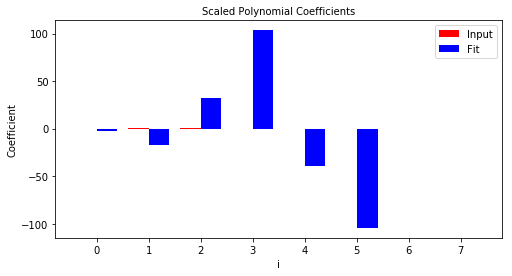

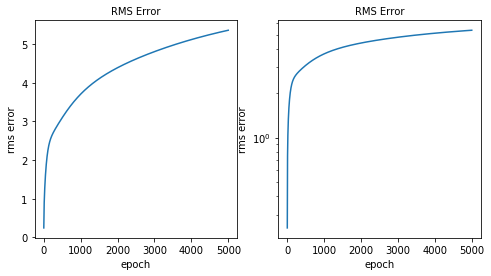

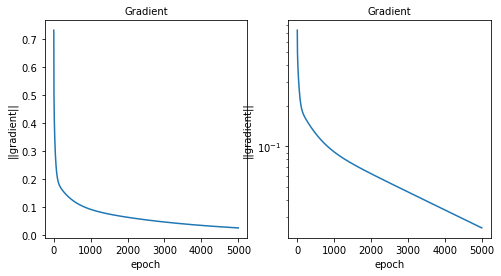

 
case_num:        62
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           1
inner loop:      17500000
train rms error: 6.25943407755
test rms error:  6.54314328156


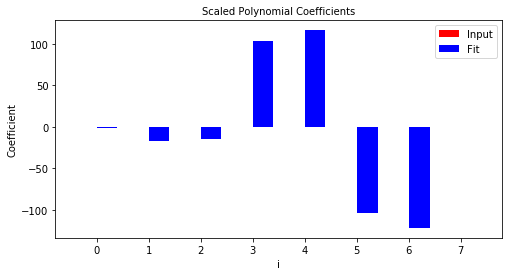

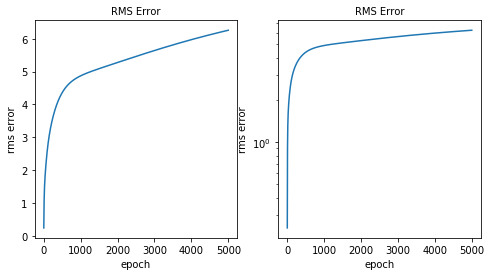

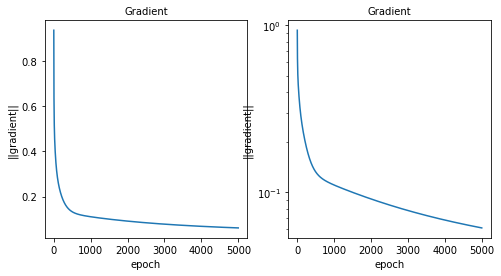

 
case_num:        63
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  1
Power:           1
inner loop:      20000000
train rms error: 7.97644844625
test rms error:  8.21654049362


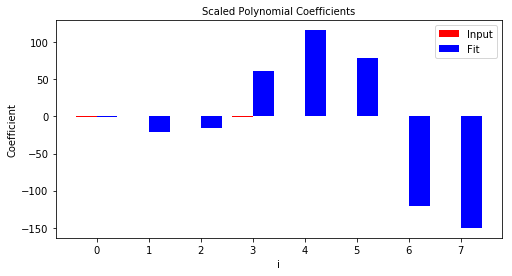

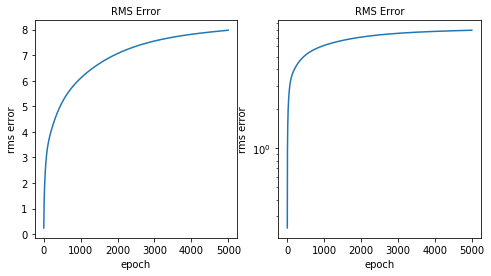

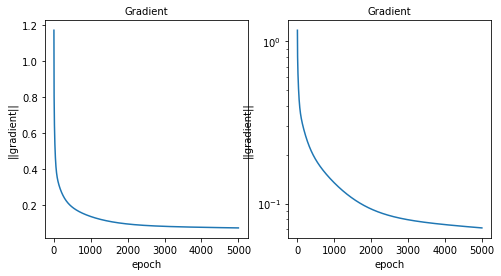

 
done


In [70]:
# Case: L1 regularization with power parameter, lambda=0.1
# Case parameters
# Type of regularization: 1 => L1 regularization
reg_type = 1
# Lambda: 0.1
lambda_reg = 0.1
# Power parameter: 1
reg_power = 1
run(reg_type, lambda_reg, reg_power)

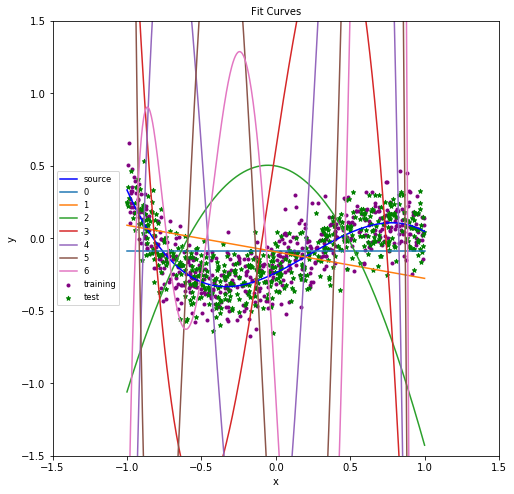

In [71]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

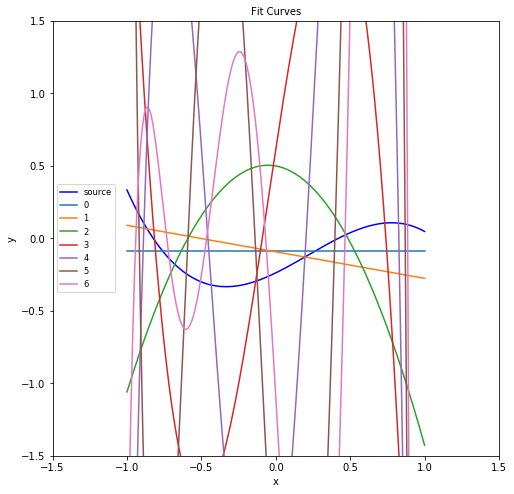

In [72]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

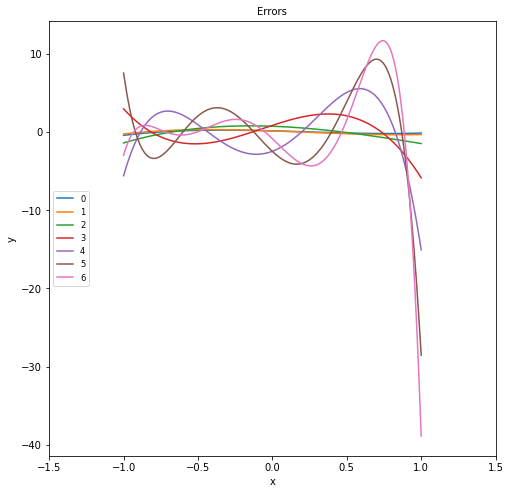

In [73]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

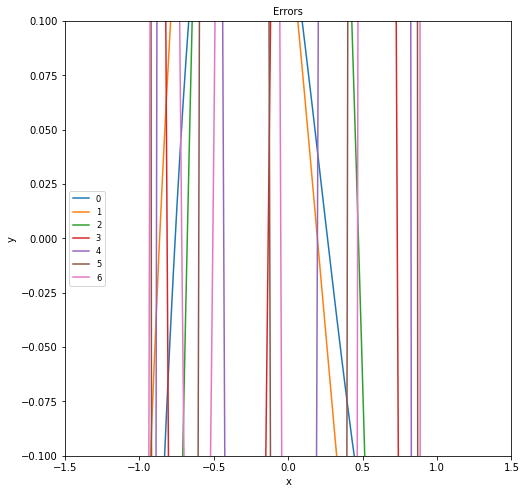

In [74]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

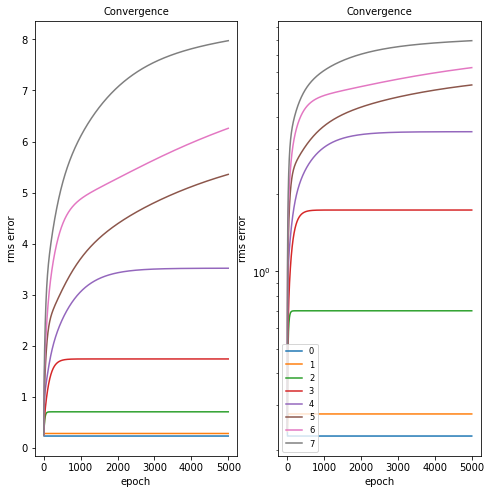

In [75]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


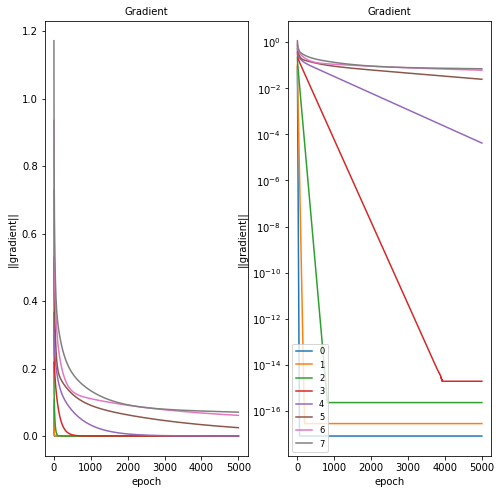

In [76]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


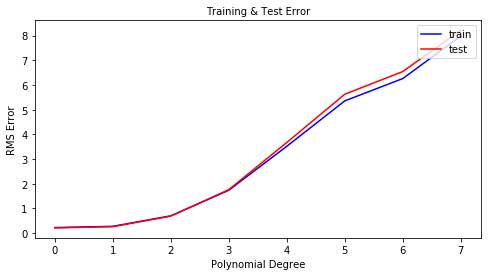

In [77]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        64
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           1
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


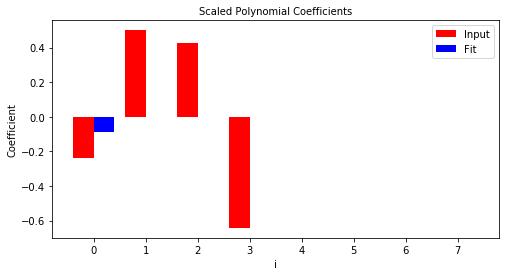

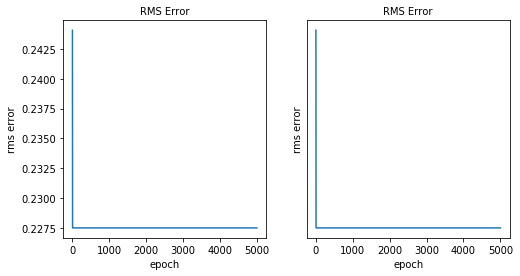

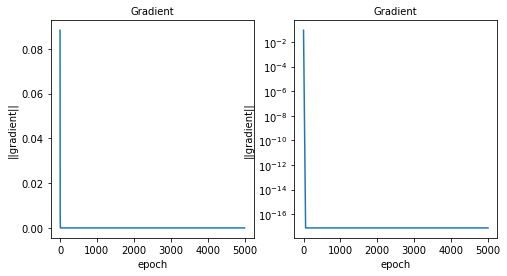

 
case_num:        65
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           1
inner loop:      5000000
train rms error: 1.7306151346
test rms error:  1.72861778586


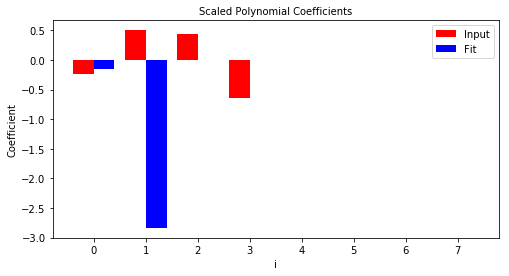

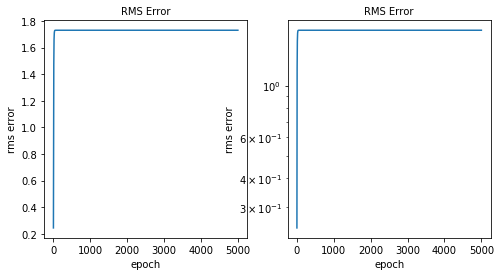

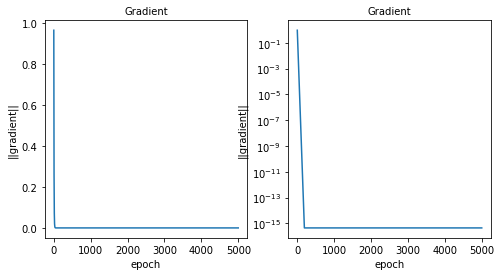

 
case_num:        66
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           1
inner loop:      7500000
train rms error: 6.7952980603
test rms error:  6.74722319487


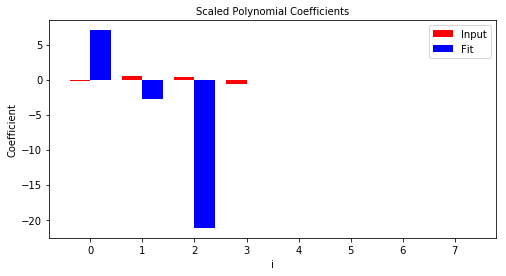

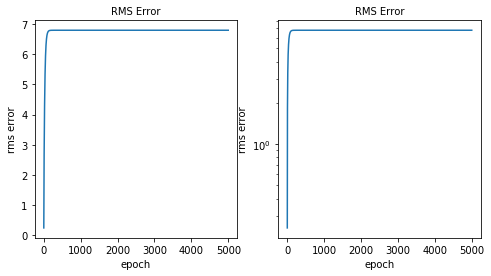

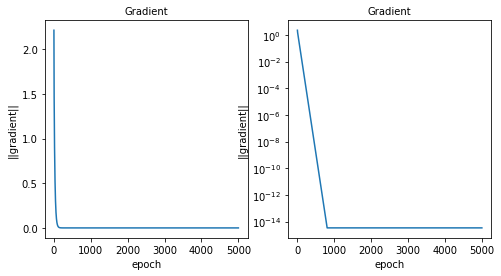

 
case_num:        67
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           1
inner loop:      10000000
train rms error: 17.3294087437
test rms error:  17.4308589041


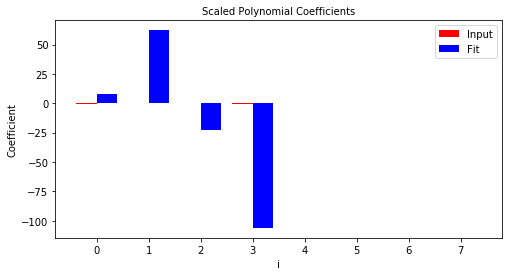

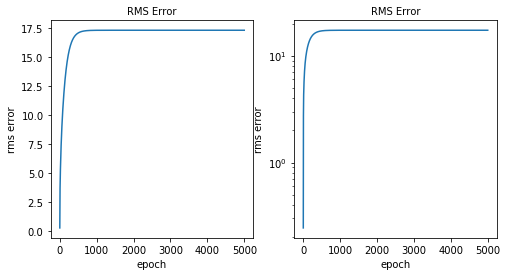

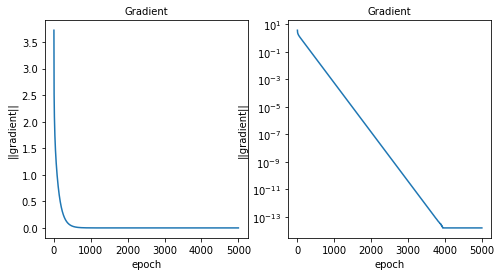

 
case_num:        68
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           1
inner loop:      12500000
train rms error: 35.1388049973
test rms error:  36.7053519202


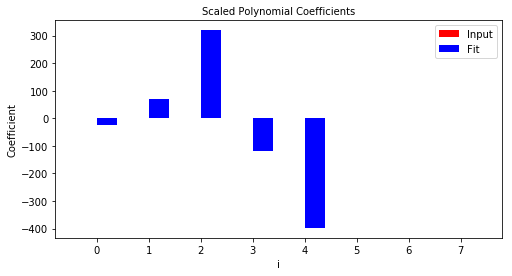

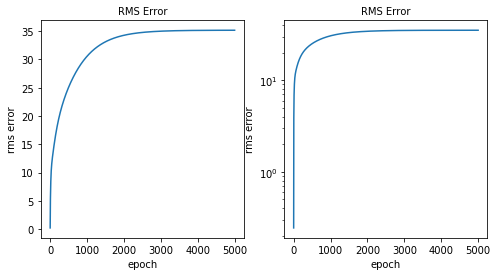

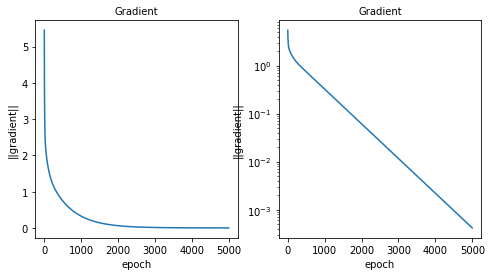

 
case_num:        69
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           1
inner loop:      15000000
train rms error: 53.5274899108
test rms error:  56.2186523066


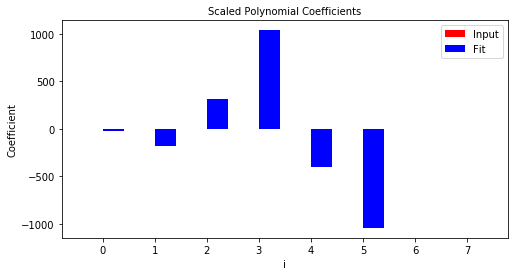

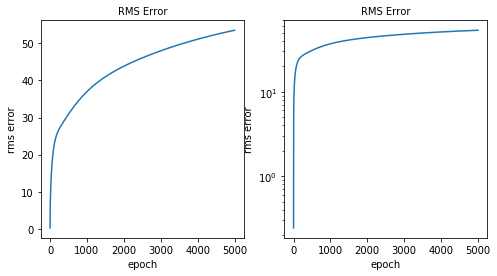

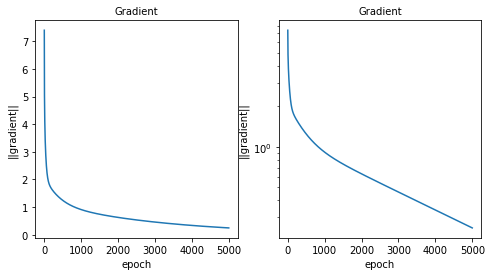

 
case_num:        70
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           1
inner loop:      17500000
train rms error: 62.5567705842
test rms error:  65.4317249707


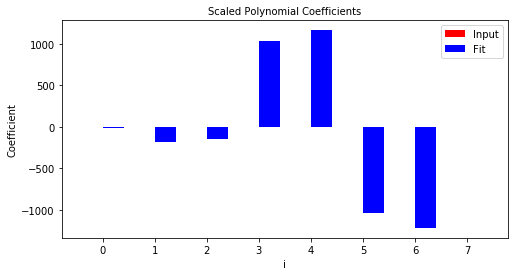

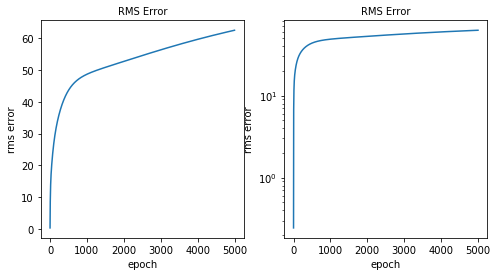

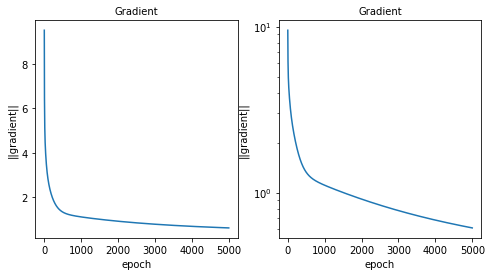

 
case_num:        71
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  1
Power:           1
inner loop:      20000000
train rms error: 79.7477198806
test rms error:  82.1628989888


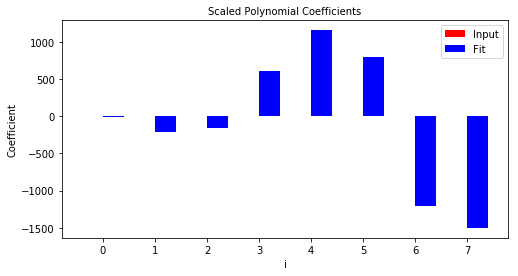

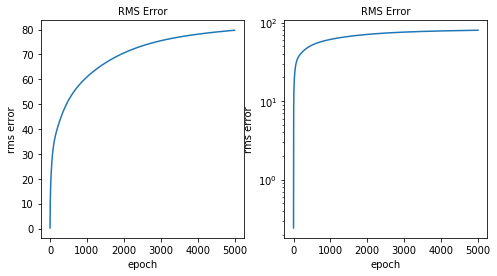

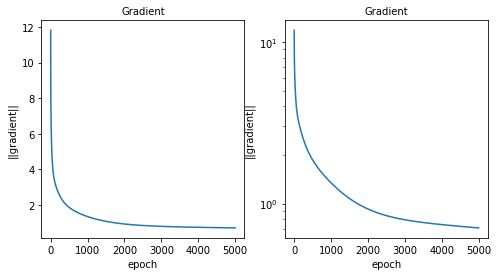

 
done


In [78]:
# Case: L1 regularization with power parameter, lambda=1
# Case parameters
# Type of regularization: 1 => L1 regularization
reg_type = 1
# Lambda: 1
lambda_reg = 1
# Power parameter: 1
reg_power = 1
run(reg_type, lambda_reg, reg_power)

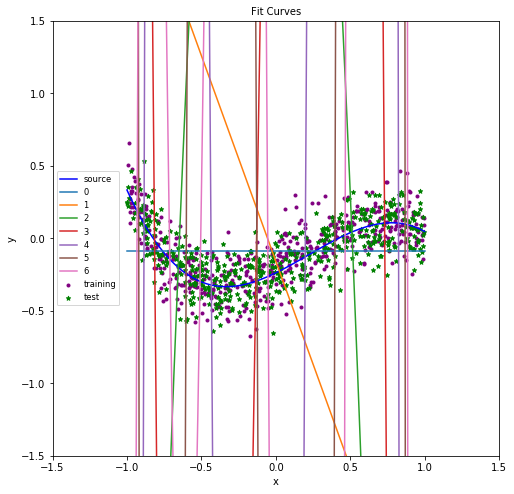

In [79]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

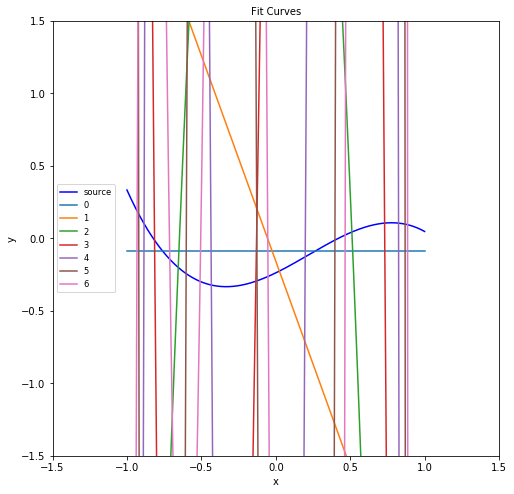

In [80]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

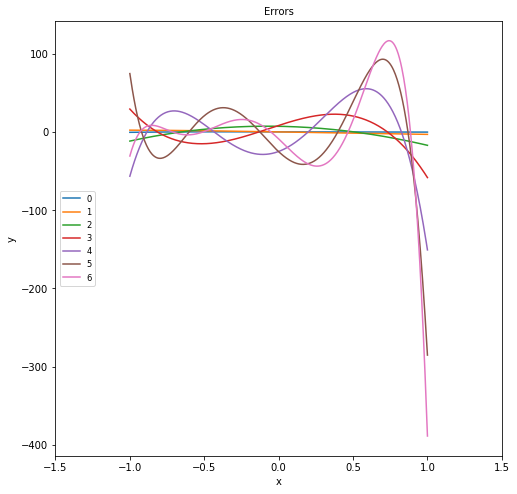

In [81]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

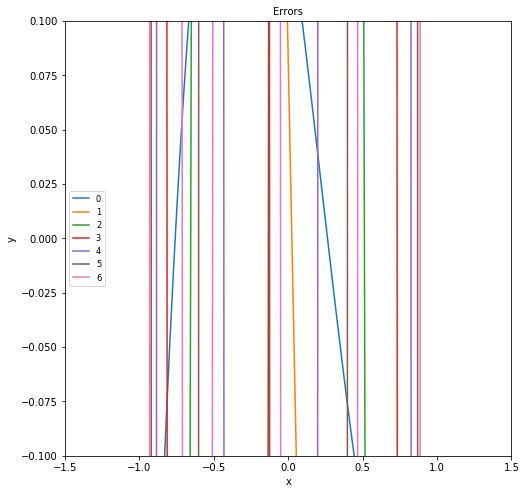

In [82]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

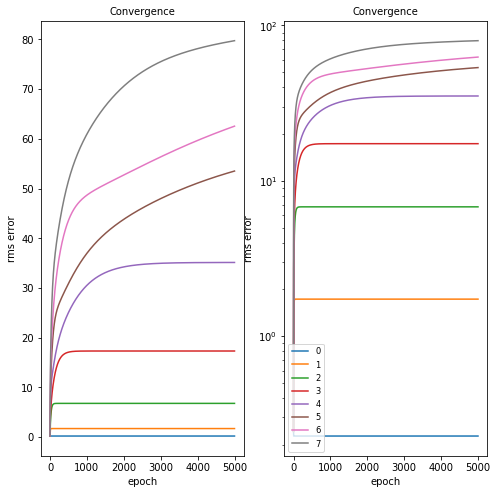

In [83]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


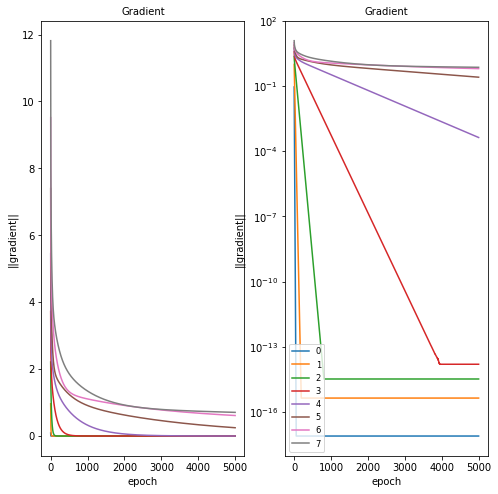

In [84]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


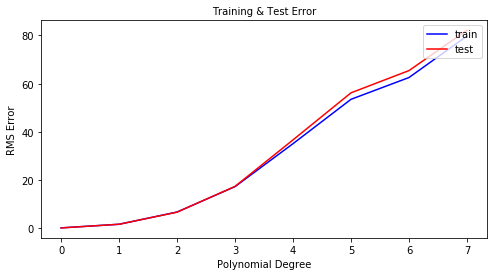

In [85]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        72
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           1
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


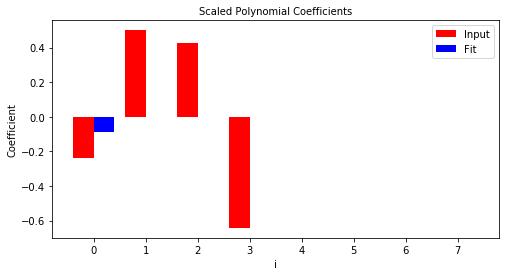

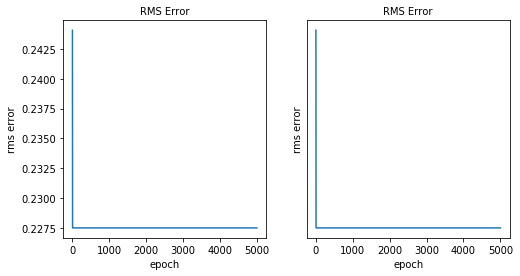

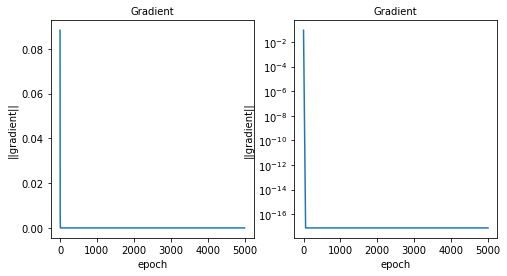

 
case_num:        73
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           1
inner loop:      5000000
train rms error: 17.1696516299
test rms error:  17.232952951


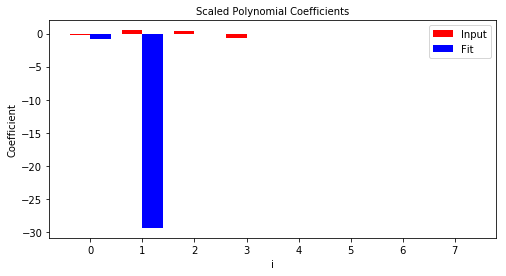

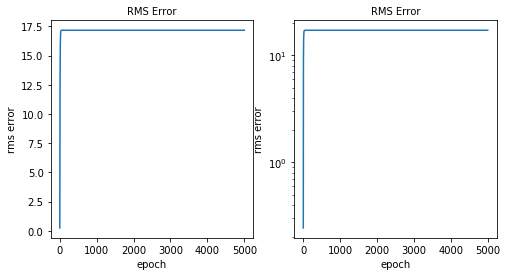

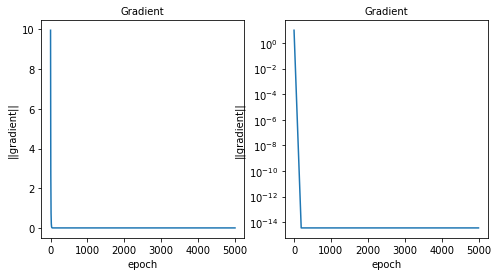

 
case_num:        74
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           1
inner loop:      7500000
train rms error: 67.930078609
test rms error:  67.4779671372


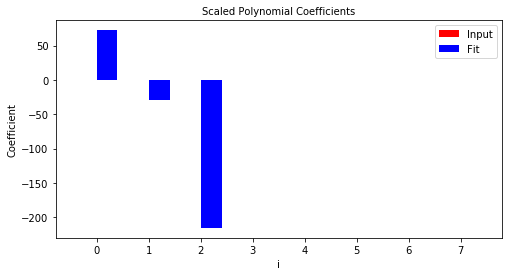

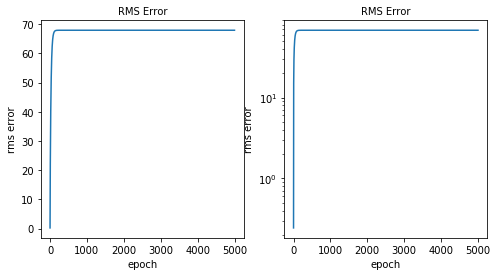

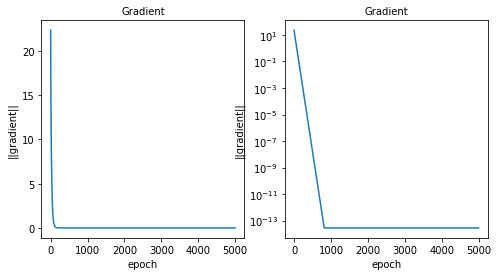

 
case_num:        75
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           1
inner loop:      10000000
train rms error: 173.28873833
test rms error:  174.16005217


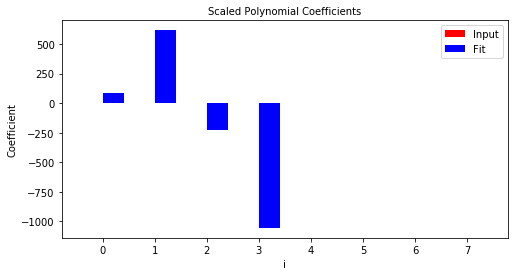

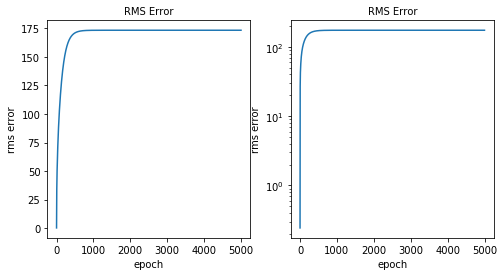

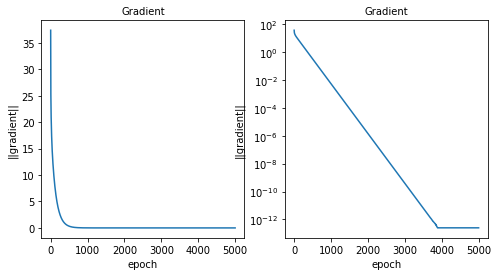

 
case_num:        76
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           1
inner loop:      12500000
train rms error: 351.385445132
test rms error:  367.058694584


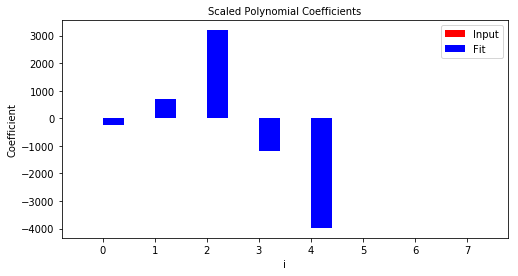

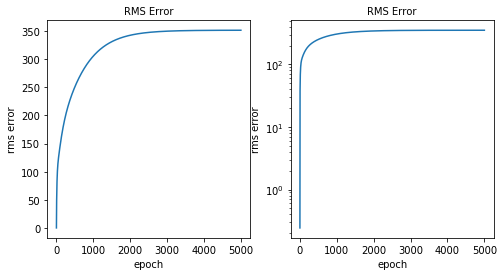

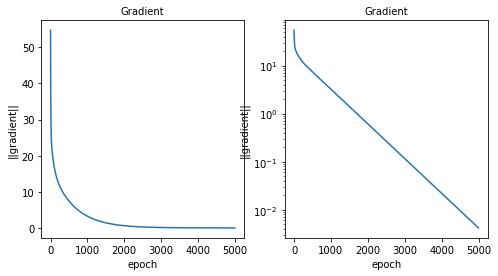

 
case_num:        77
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           1
inner loop:      15000000
train rms error: 535.255613088
test rms error:  562.167382897


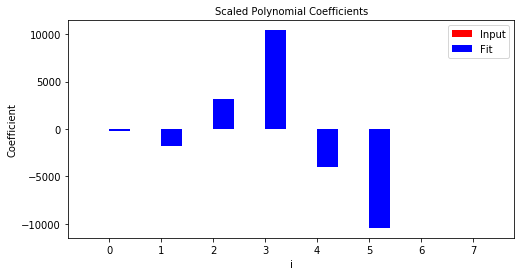

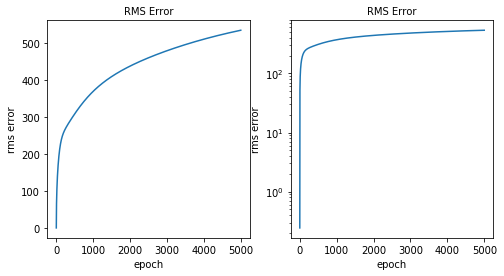

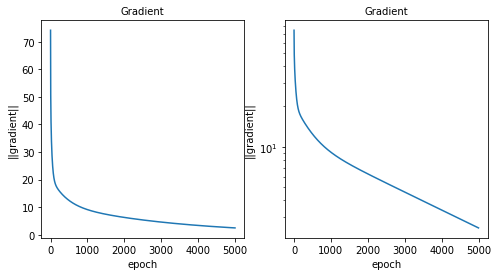

 
case_num:        78
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           1
inner loop:      17500000
train rms error: 625.543337589
test rms error:  654.329785902


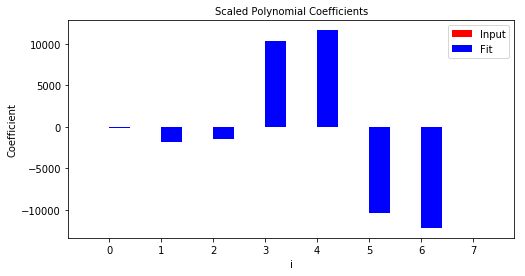

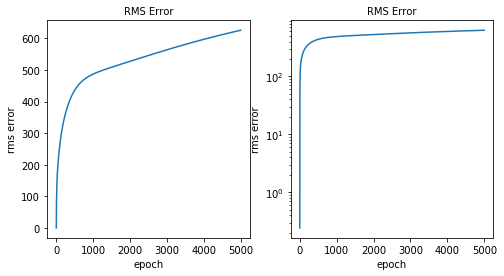

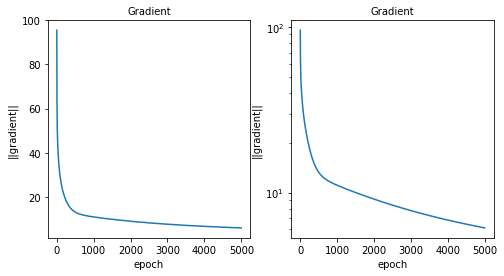

 
case_num:        79
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  1
Power:           1
inner loop:      20000000
train rms error: 797.47079701
test rms error:  821.636232185


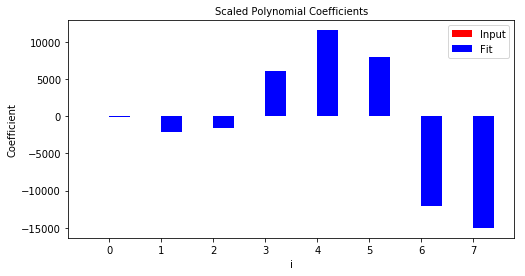

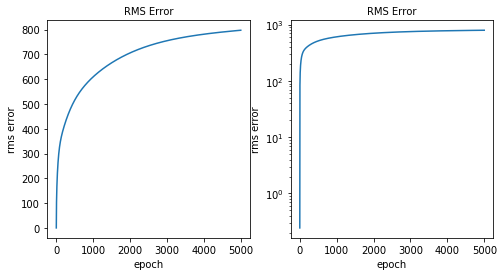

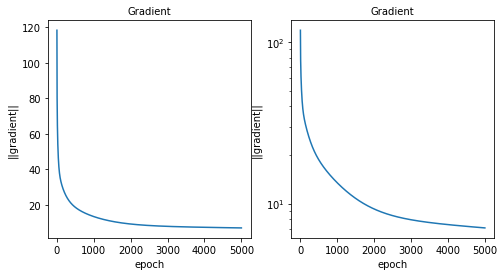

 
done


In [86]:
# Case: L1 regularization with power parameter, lambda=10
# Case parameters
# Type of regularization: 1 => L1 regularization
reg_type = 1
# Lambda: 10
lambda_reg = 10
# Power parameter: 1
reg_power = 1
run(reg_type, lambda_reg, reg_power)

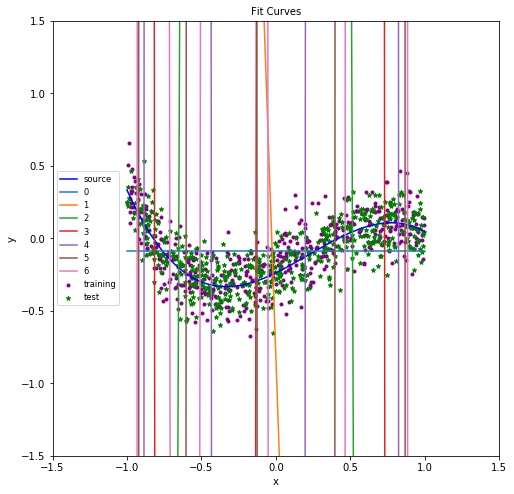

In [87]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

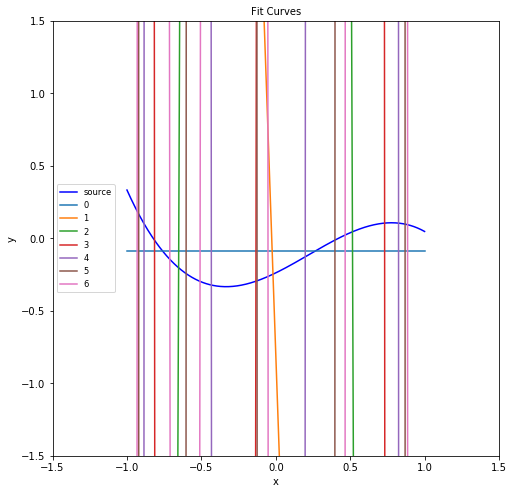

In [88]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

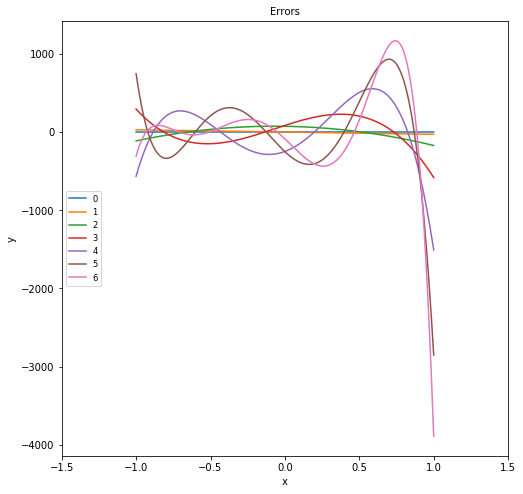

In [89]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

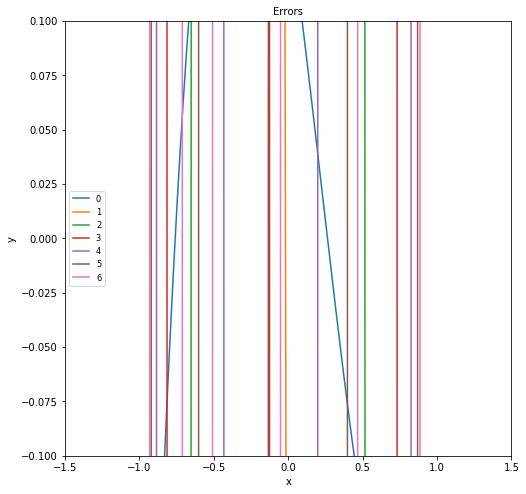

In [90]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

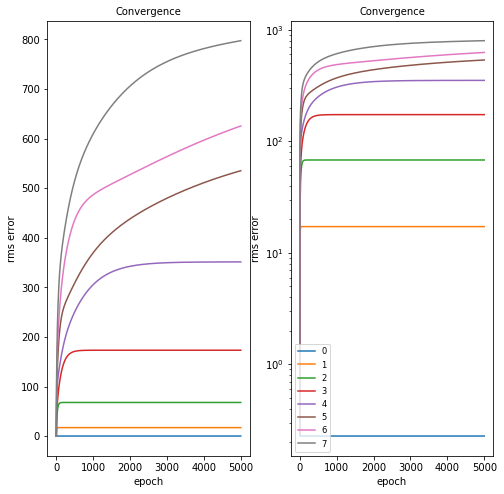

In [91]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


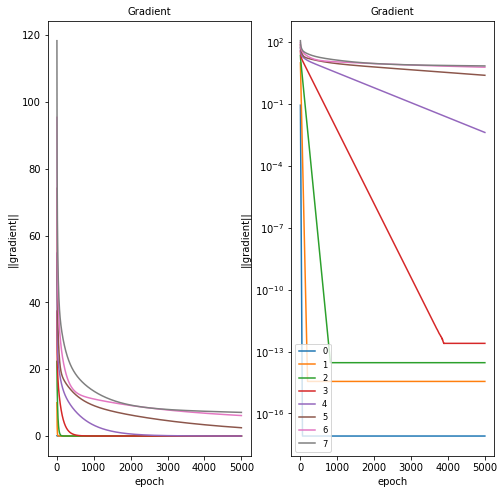

In [92]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


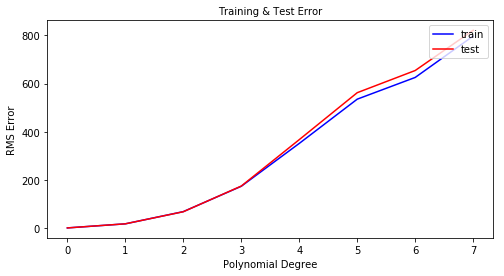

In [93]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        80
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           1
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


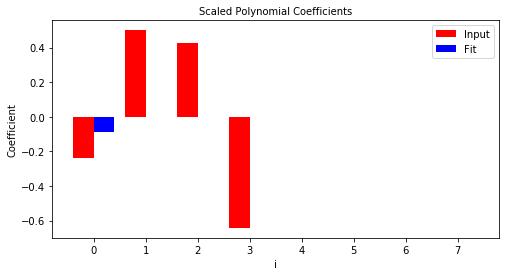

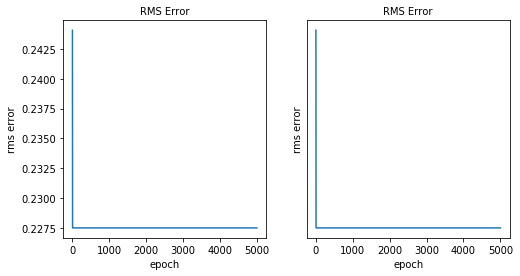

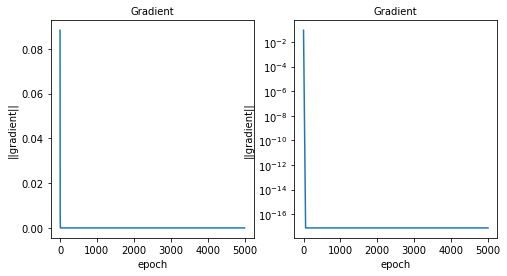

 
case_num:        81
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           1
inner loop:      5000000
train rms error: 171.682811522
test rms error:  172.385367785


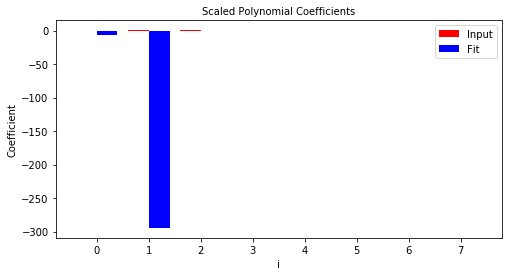

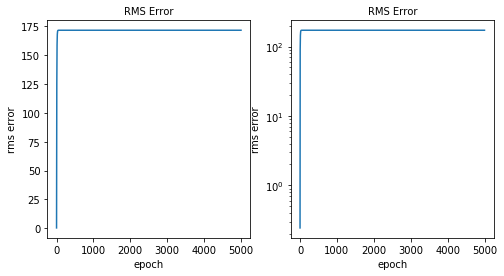

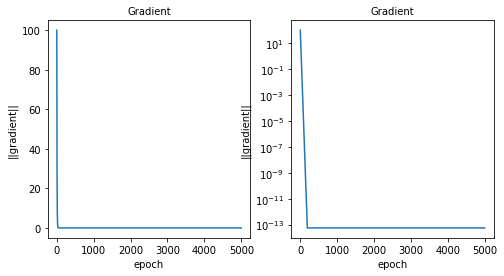

 
case_num:        82
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           1
inner loop:      7500000
train rms error: 679.298495501
test rms error:  674.802958995


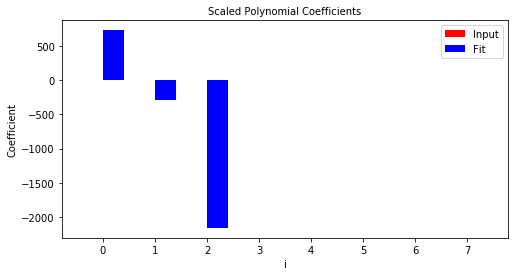

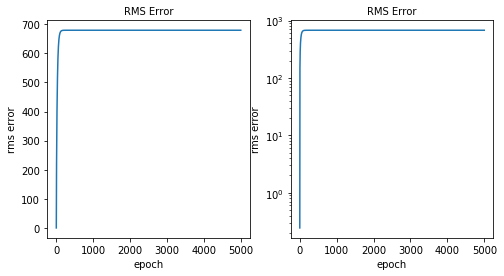

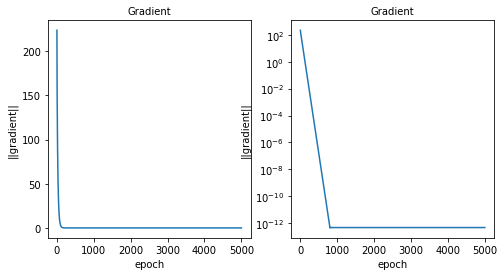

 
case_num:        83
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           1
inner loop:      10000000
train rms error: 1732.88684838
test rms error:  1741.45649309


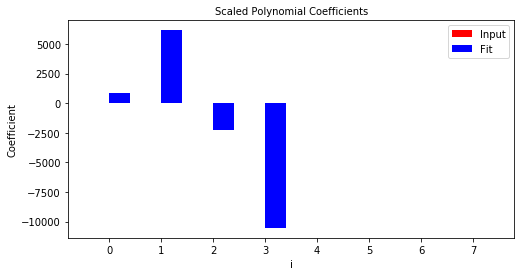

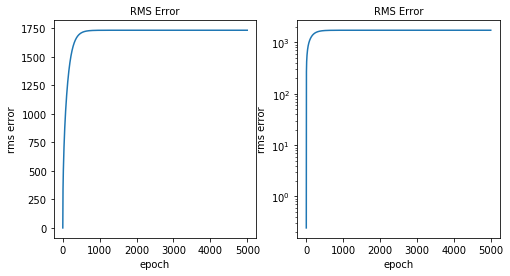

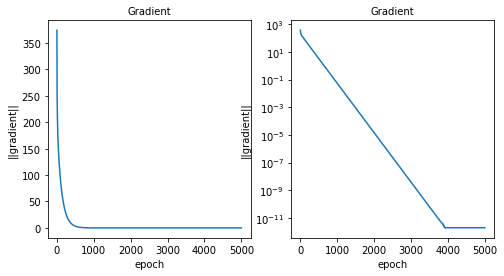

 
case_num:        84
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           1
inner loop:      12500000
train rms error: 3513.85420052
test rms error:  3670.59430247


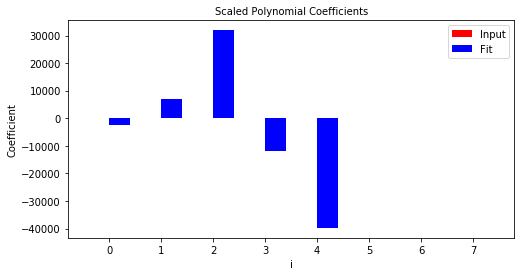

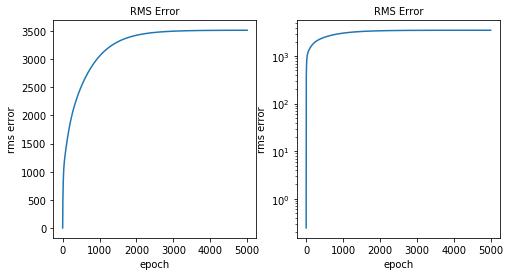

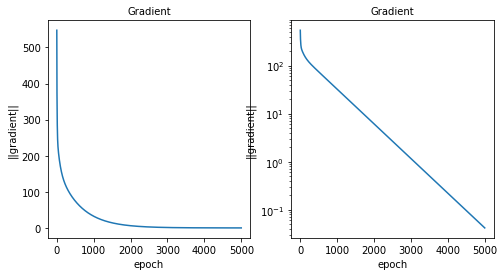

 
case_num:        85
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           1
inner loop:      15000000
train rms error: 5352.53838989
test rms error:  5621.65611171


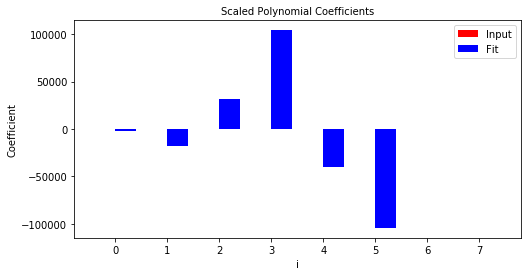

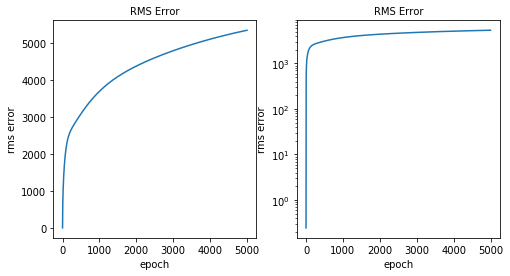

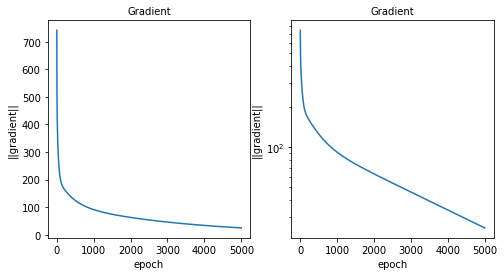

 
case_num:        86
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           1
inner loop:      17500000
train rms error: 6255.41032855
test rms error:  6543.31161948


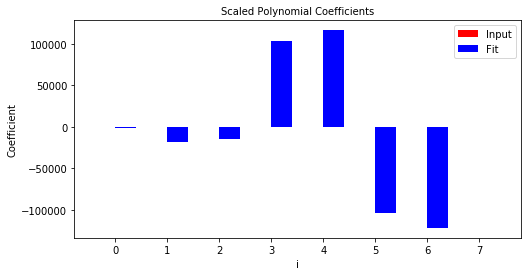

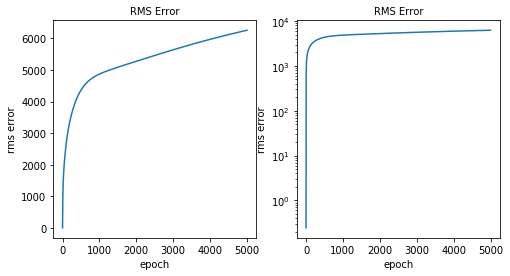

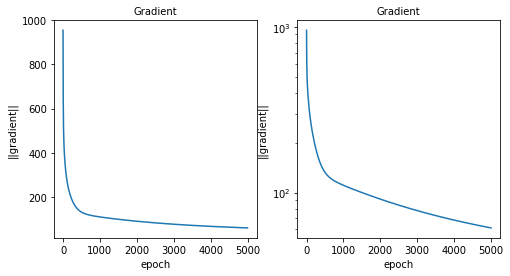

 
case_num:        87
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  1
Power:           1
inner loop:      20000000
train rms error: 7974.70260474
test rms error:  8216.37053893


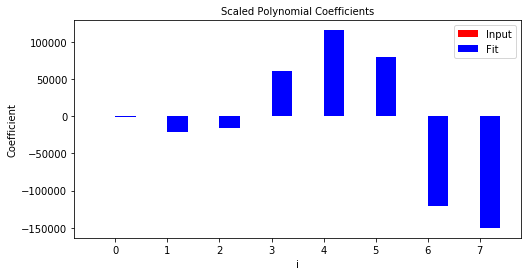

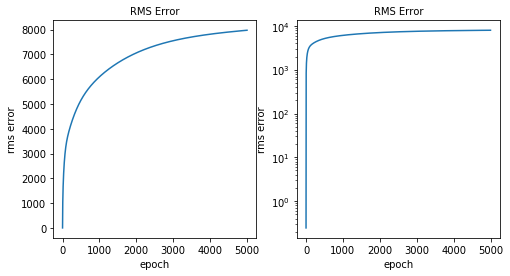

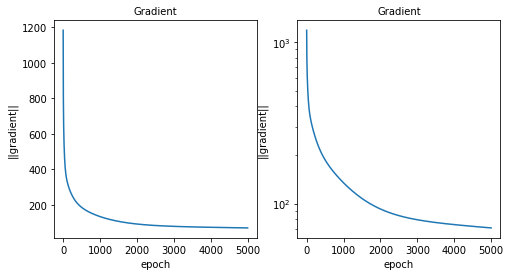

 
done


In [94]:
# Case: L1 regularization with power parameter, lambda=100
# Case parameters
# Type of regularization: 1 => L1 regularization
reg_type = 1
# Lambda: 100
lambda_reg = 100
# Power parameter: 1
reg_power = 1
run(reg_type, lambda_reg, reg_power)

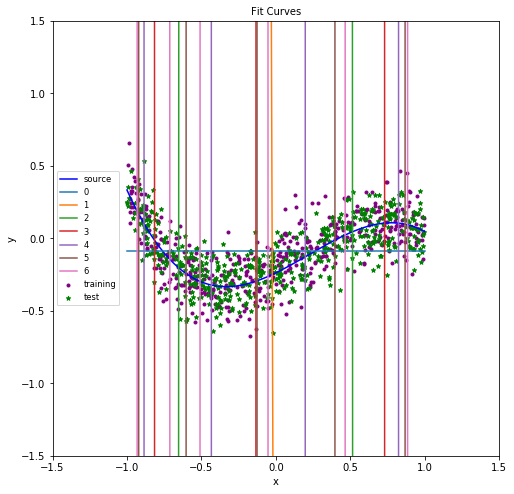

In [95]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

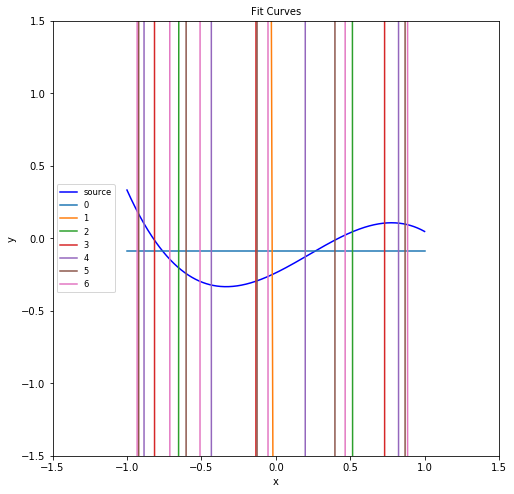

In [96]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

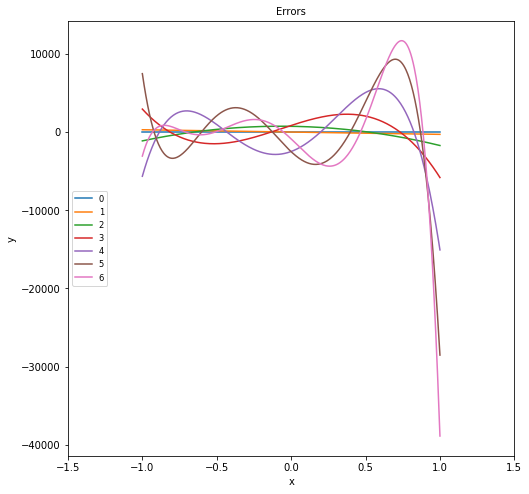

In [97]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

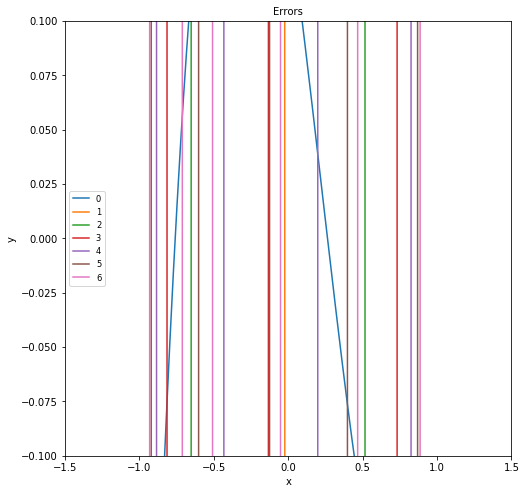

In [98]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

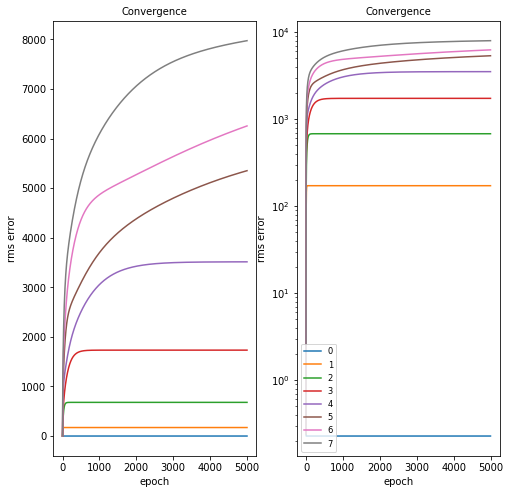

In [99]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


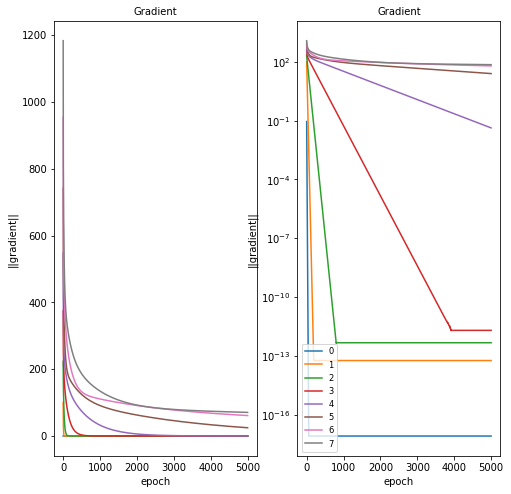

In [100]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


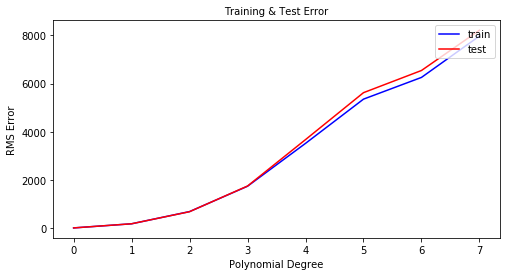

In [101]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

## -----------------------------L1 Regularization without power parameter----------------------------

case_num:        88
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           0
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


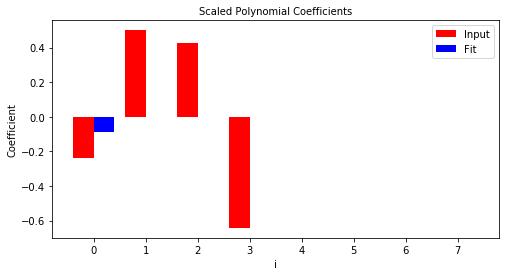

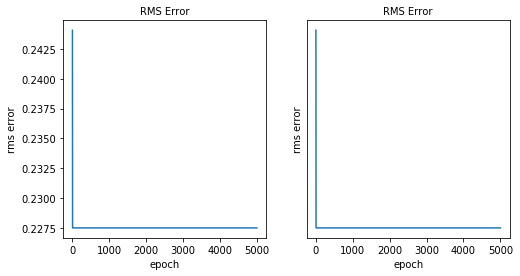

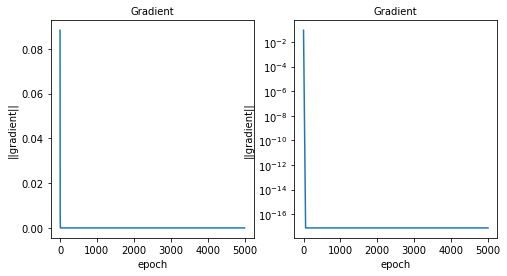

 
case_num:        89
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           0
inner loop:      5000000
train rms error: 0.218032534971
test rms error:  0.205423170843


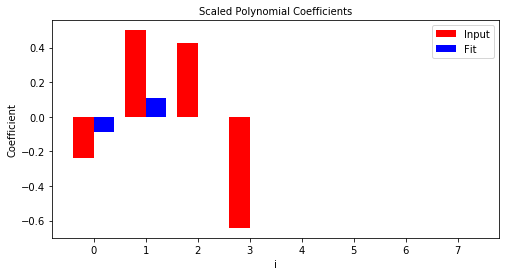

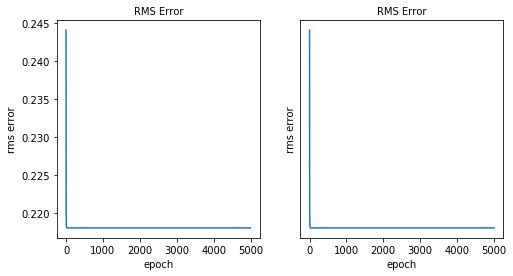

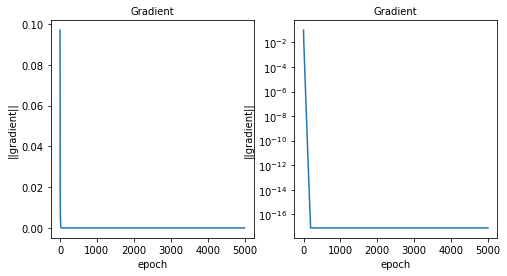

 
case_num:        90
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           0
inner loop:      7500000
train rms error: 0.177737527047
test rms error:  0.163408140271


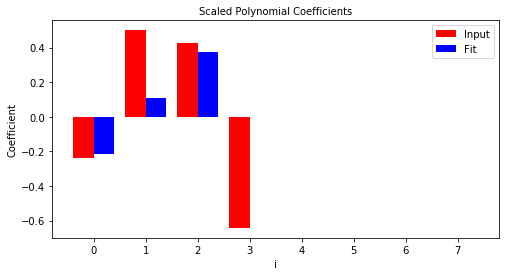

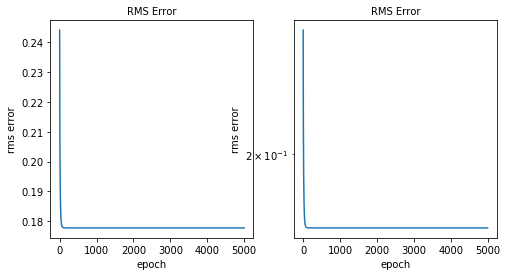

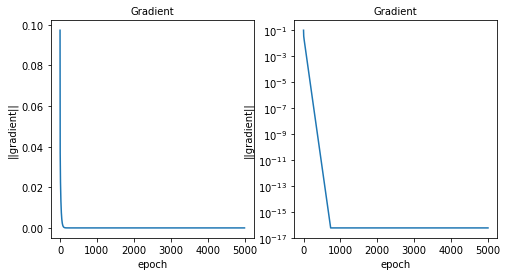

 
case_num:        91
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           0
inner loop:      10000000
train rms error: 0.144620771414
test rms error:  0.135401235748


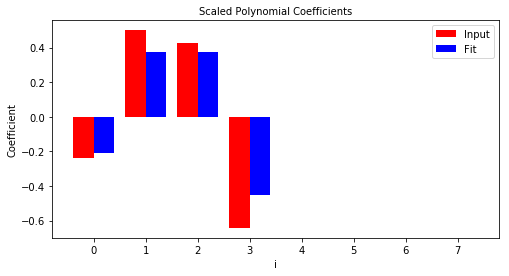

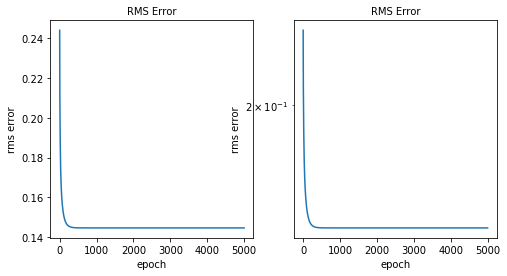

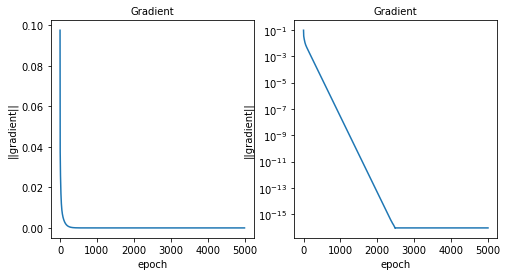

 
case_num:        92
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           0
inner loop:      12500000
train rms error: 0.143667831645
test rms error:  0.135965989133


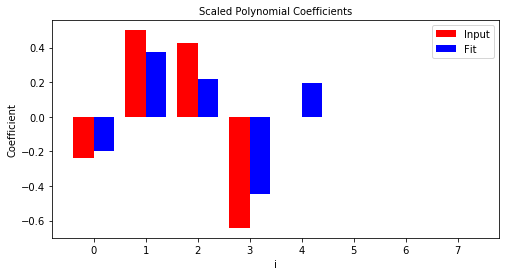

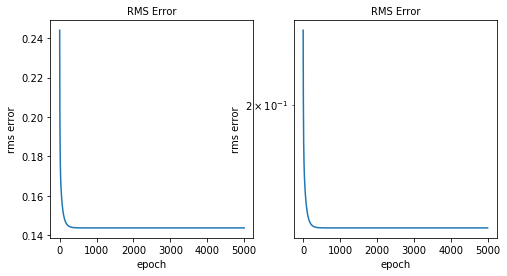

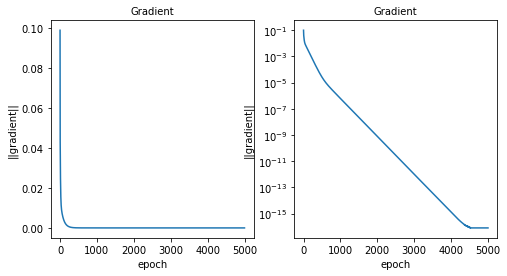

 
case_num:        93
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           0
inner loop:      15000000
train rms error: 0.139865501157
test rms error:  0.133927647265


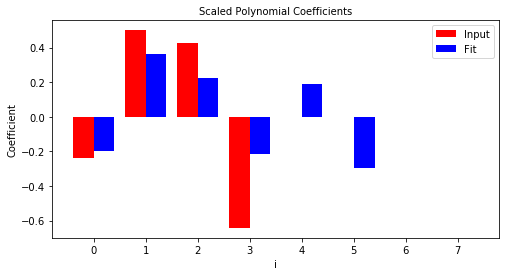

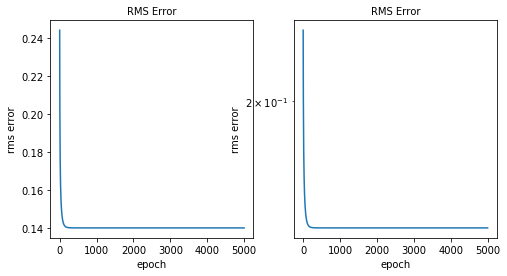

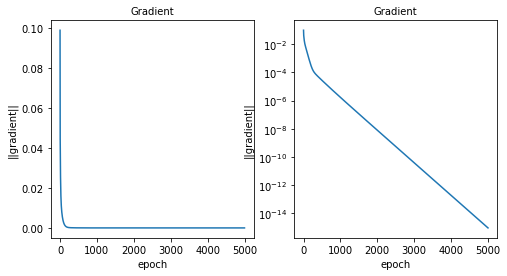

 
case_num:        94
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           0
inner loop:      17500000
train rms error: 0.139957426626
test rms error:  0.134620769129


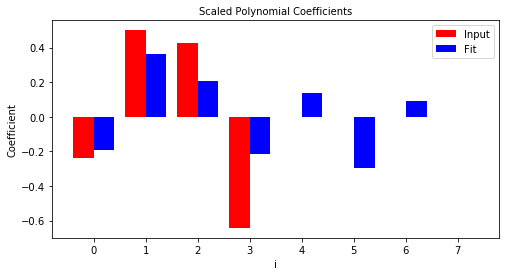

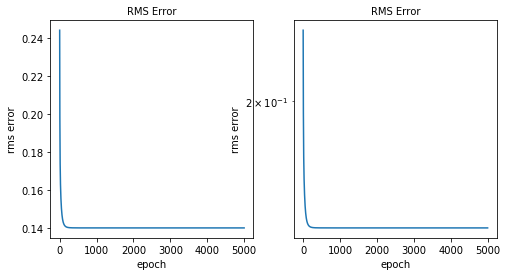

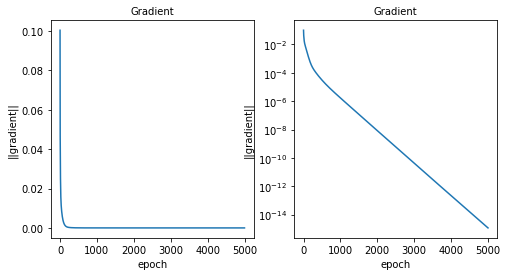

 
case_num:        95
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           0
inner loop:      20000000
train rms error: 0.139697035472
test rms error:  0.135082287264


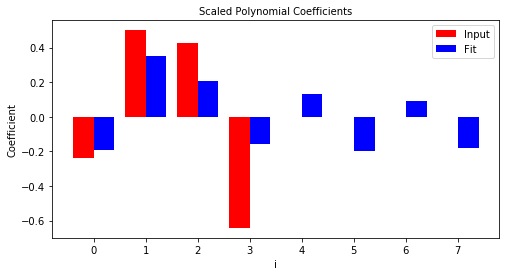

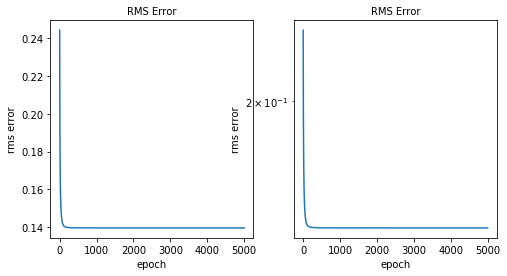

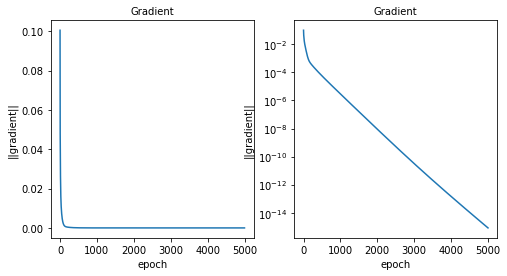

 
done


In [102]:
# Case: L2 regularization without power parameter, lambda=0.01
# Case parameters
# Type of regularization: 2 => L2 regularization
reg_type = 2
# Lambda: 0.01
lambda_reg = 0.01
# Power parameter: 0 => No power parameter
reg_power = 0
run(reg_type, lambda_reg, reg_power)

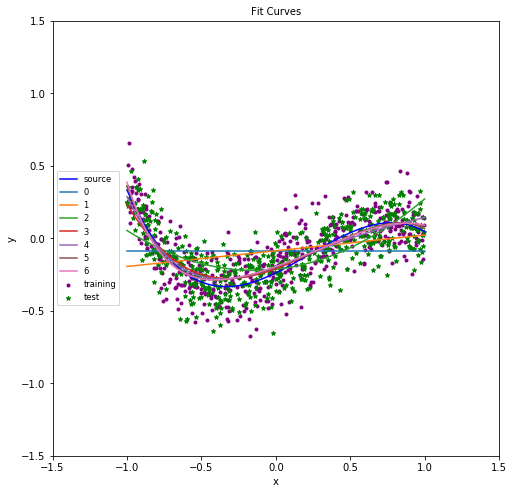

In [103]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

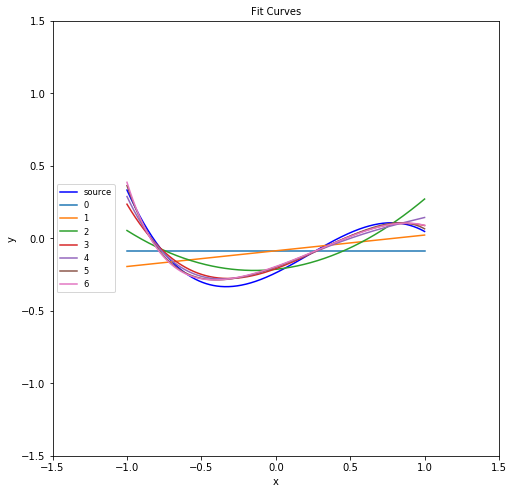

In [104]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

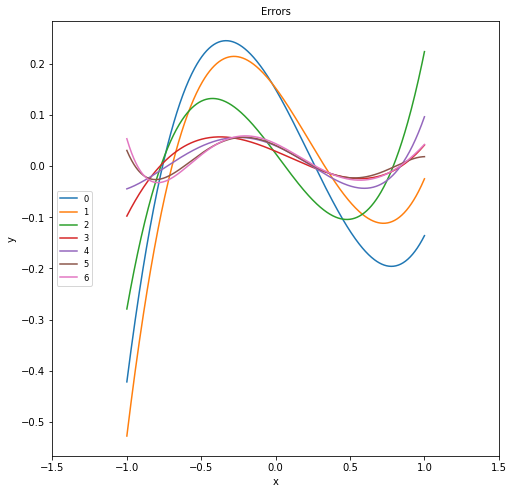

In [105]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

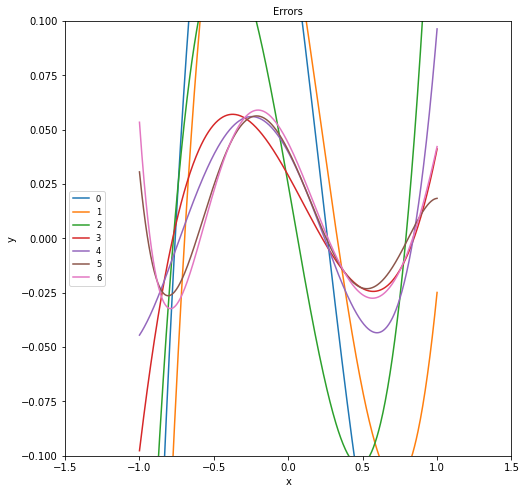

In [106]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

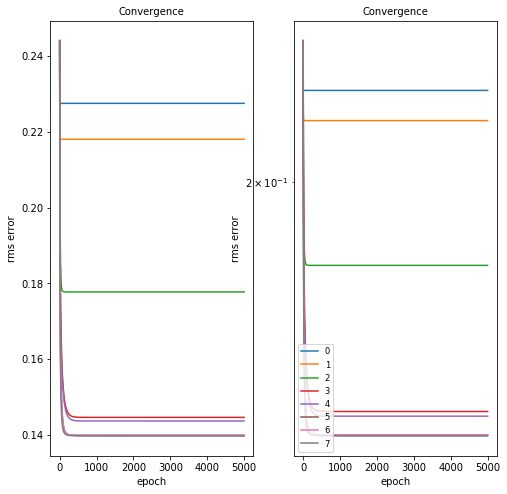

In [107]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


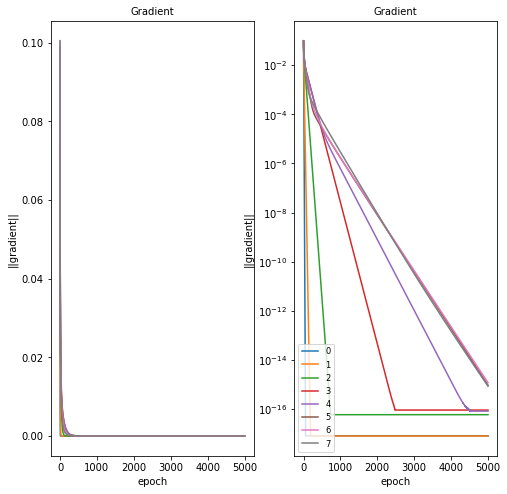

In [108]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


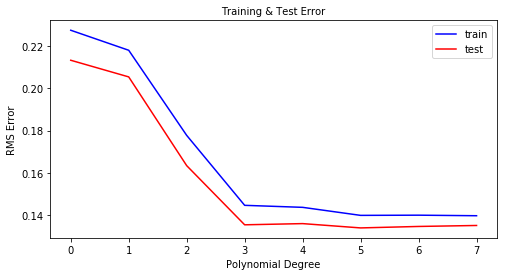

In [109]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        96
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           0
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


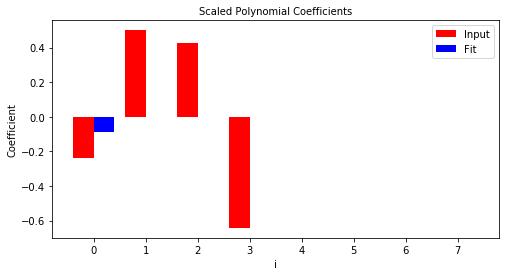

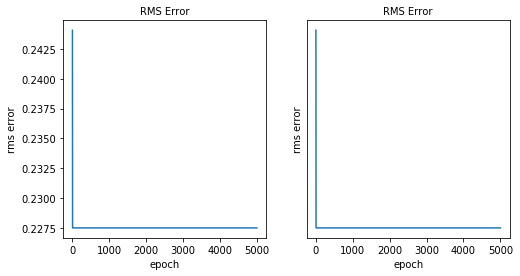

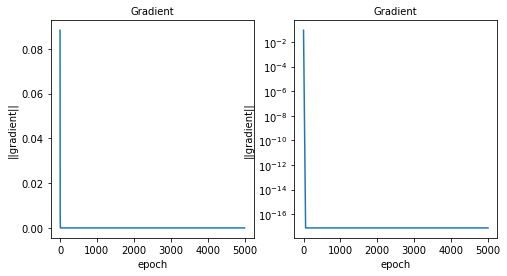

 
case_num:        97
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           0
inner loop:      5000000
train rms error: 0.218526519905
test rms error:  0.205474819453


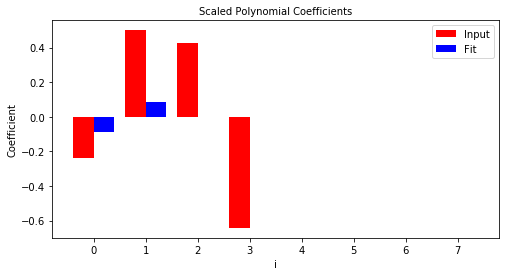

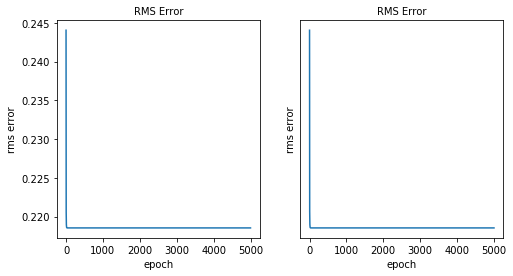

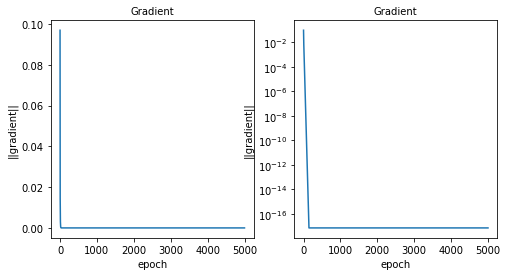

 
case_num:        98
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           0
inner loop:      7500000
train rms error: 0.189718839413
test rms error:  0.175362512915


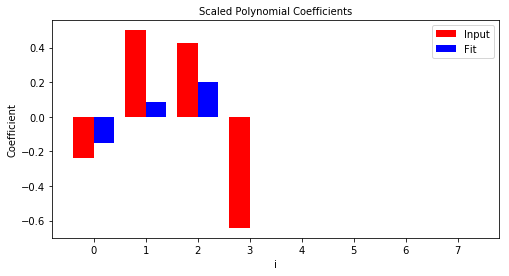

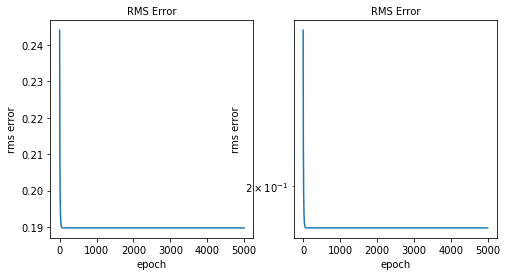

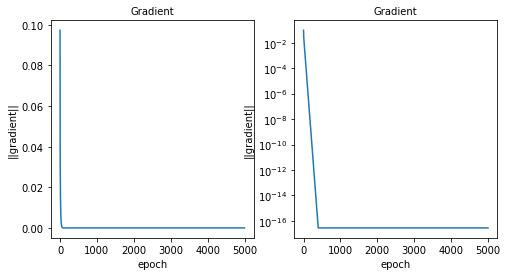

 
case_num:        99
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           0
inner loop:      10000000
train rms error: 0.183450041546
test rms error:  0.169481697044


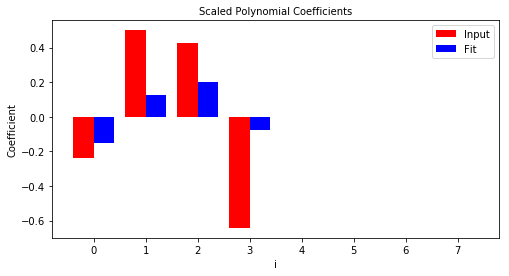

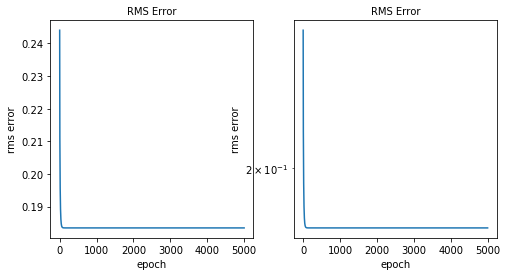

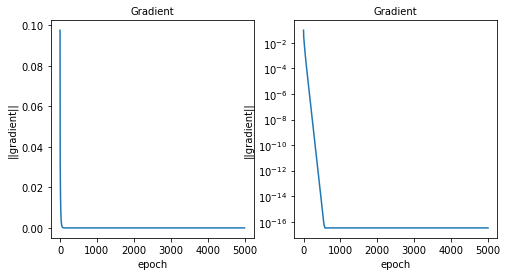

 
case_num:        100
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           0
inner loop:      12500000
train rms error: 0.177108272718
test rms error:  0.164007115628


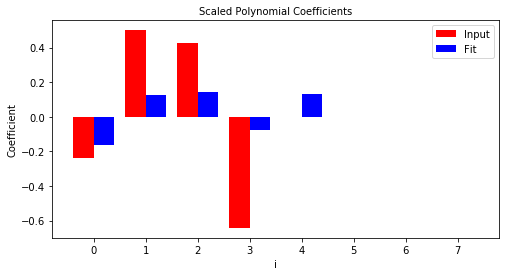

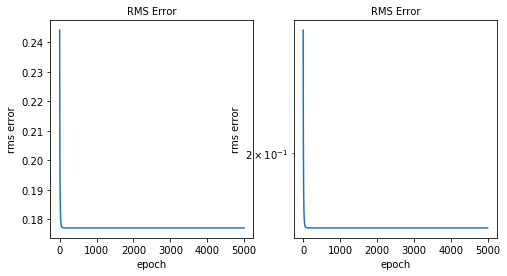

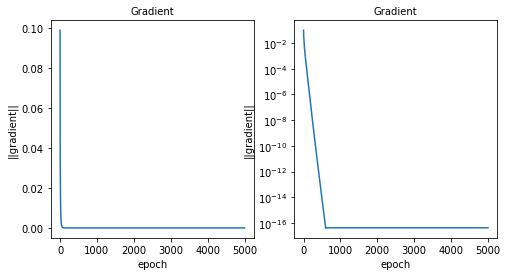

 
case_num:        101
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           0
inner loop:      15000000
train rms error: 0.17142807644
test rms error:  0.158976582327


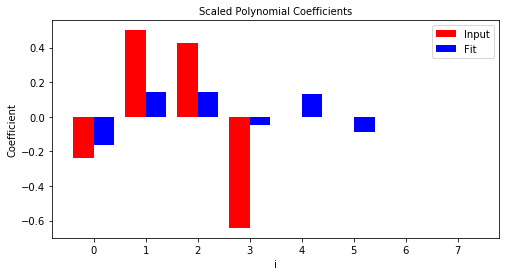

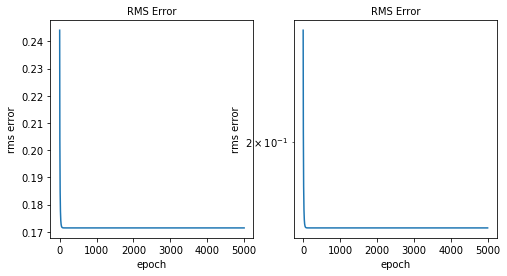

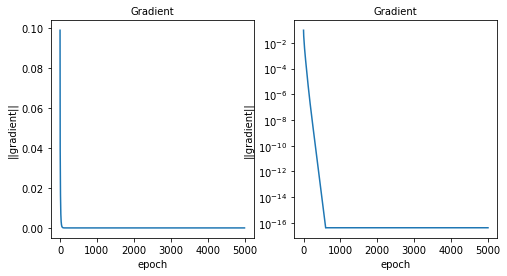

 
case_num:        102
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           0
inner loop:      17500000
train rms error: 0.169512534479
test rms error:  0.157985075658


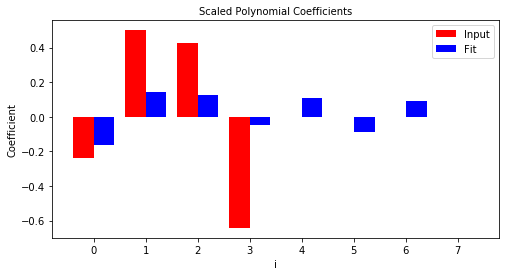

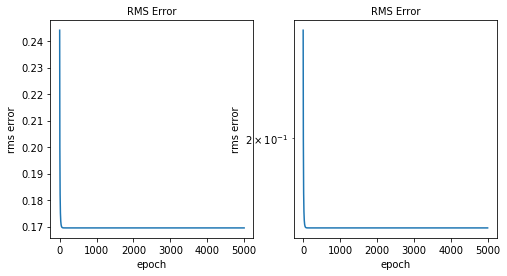

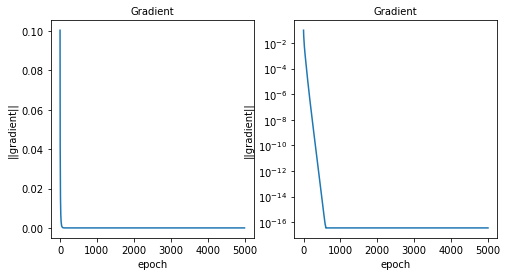

 
case_num:        103
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           0
inner loop:      20000000
train rms error: 0.165919129591
test rms error:  0.15502365505


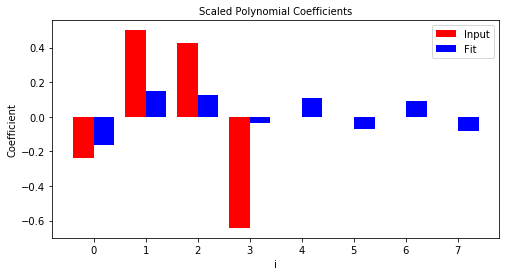

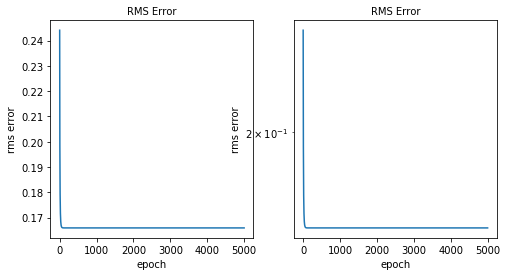

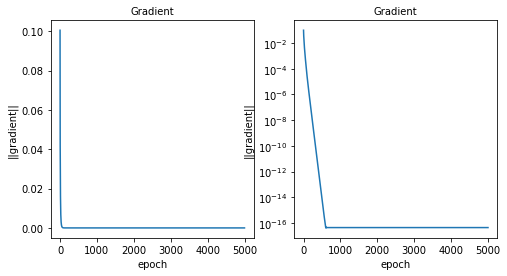

 
done


In [110]:
# Case: L2 regularization without power parameter, lambda=0.1
# Case parameters
# Type of regularization: 2 => L2 regularization
reg_type = 2
# Lambda: 0.1
lambda_reg = 0.1
# Power parameter: 0 => No power parameter
reg_power = 0
run(reg_type, lambda_reg, reg_power)

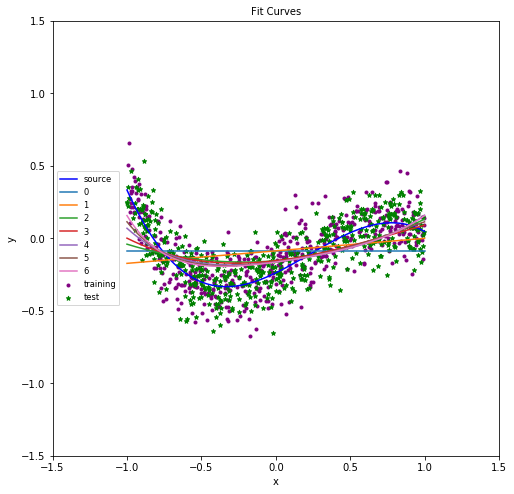

In [111]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

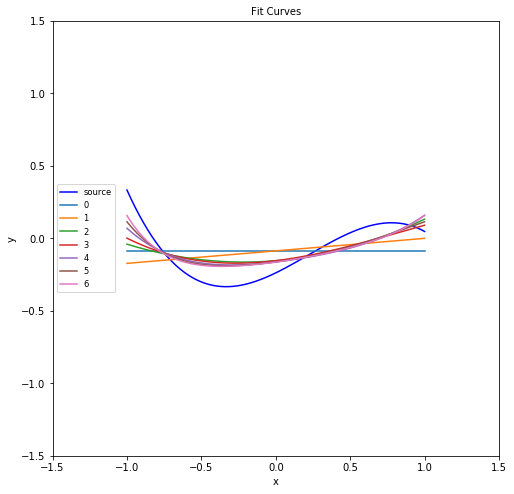

In [112]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

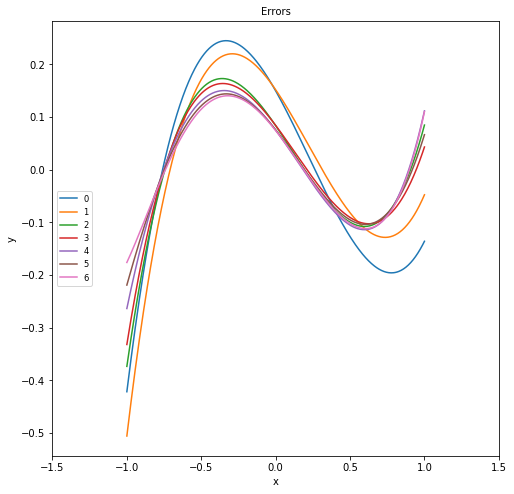

In [113]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

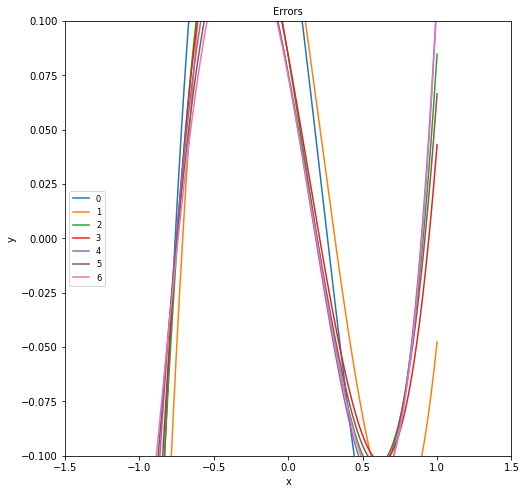

In [114]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

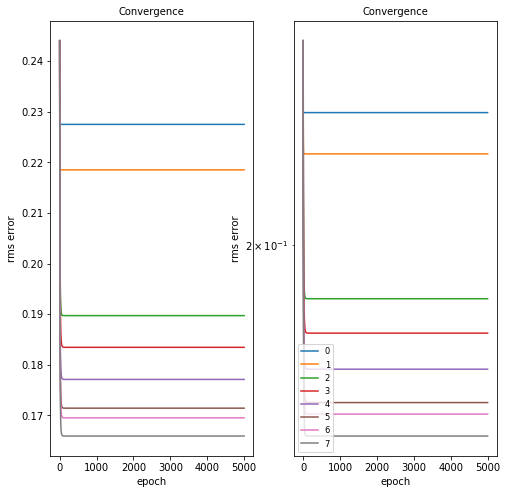

In [115]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


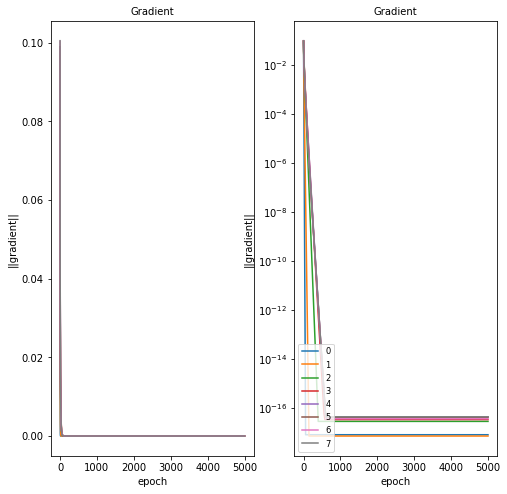

In [116]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


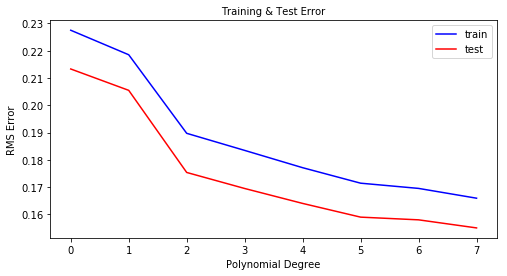

In [117]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        104
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           0
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


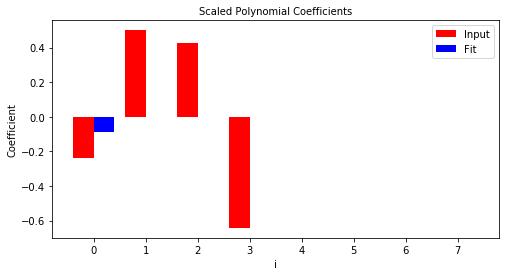

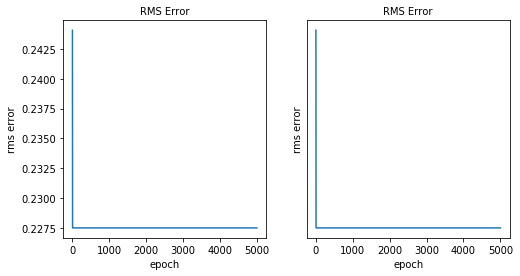

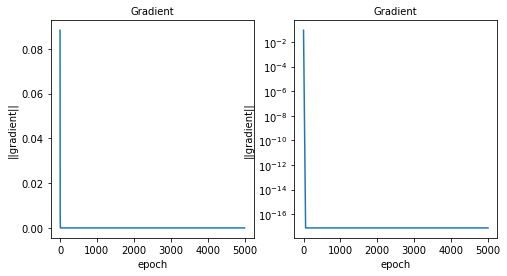

 
case_num:        105
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           0
inner loop:      5000000
train rms error: 0.223365153272
test rms error:  0.209437470981


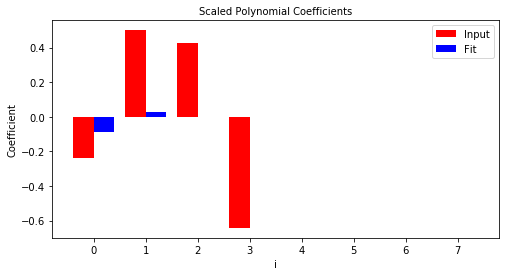

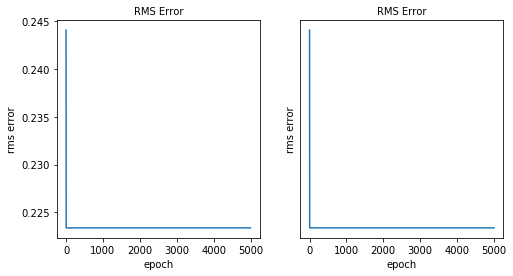

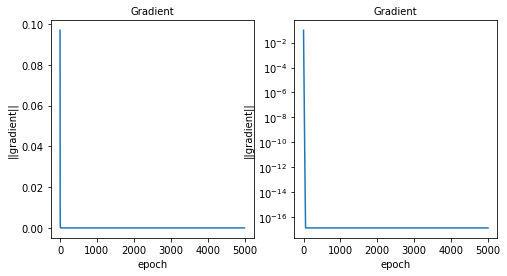

 
case_num:        106
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           0
inner loop:      7500000
train rms error: 0.217437239182
test rms error:  0.203209095139


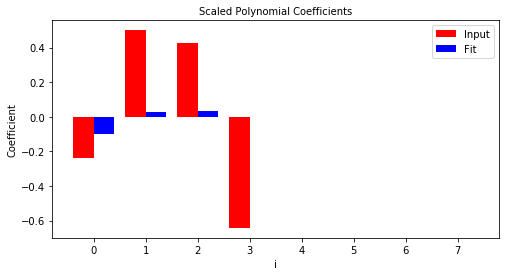

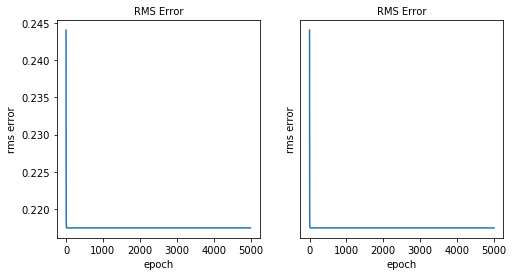

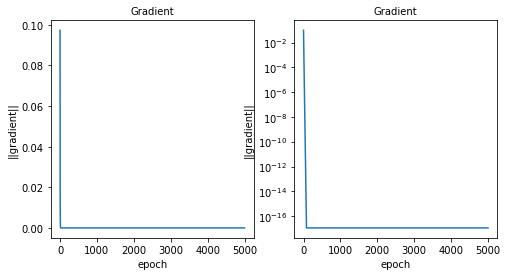

 
case_num:        107
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           0
inner loop:      10000000
train rms error: 0.21743469541
test rms error:  0.203206834119


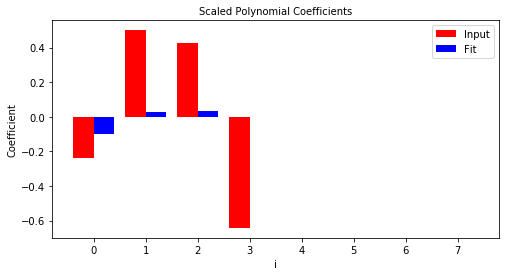

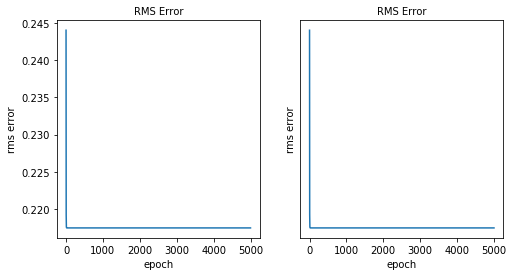

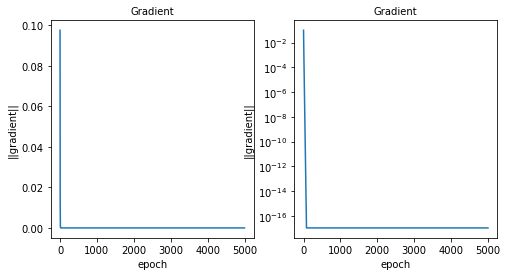

 
case_num:        108
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           0
inner loop:      12500000
train rms error: 0.213490763573
test rms error:  0.19930249269


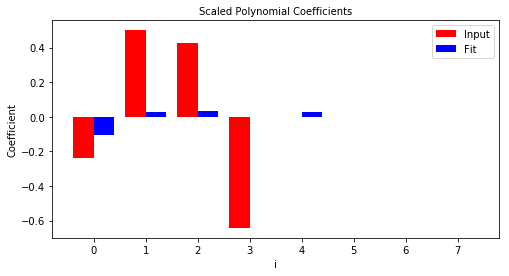

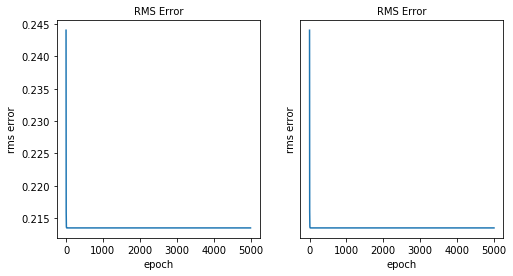

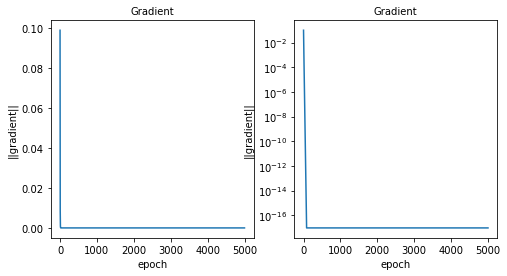

 
case_num:        109
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           0
inner loop:      15000000
train rms error: 0.213191180323
test rms error:  0.199050780699


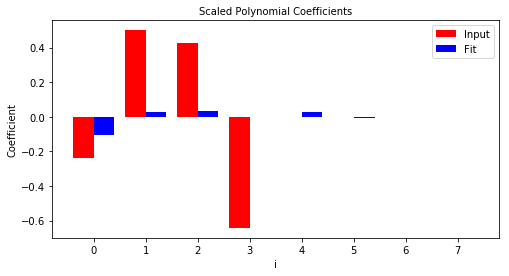

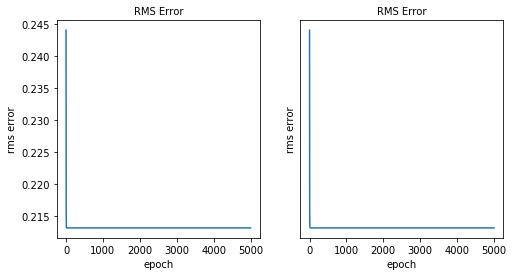

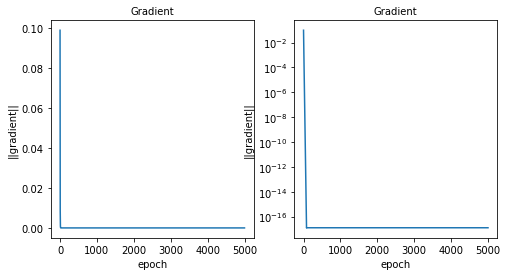

 
case_num:        110
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           0
inner loop:      17500000
train rms error: 0.210711773976
test rms error:  0.196742864771


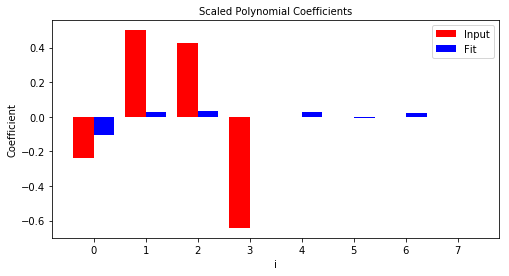

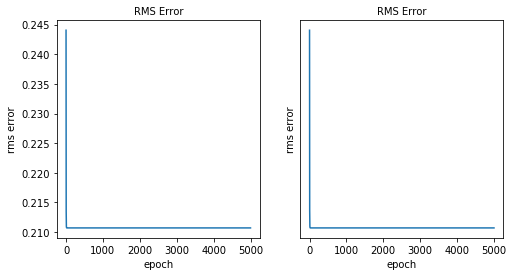

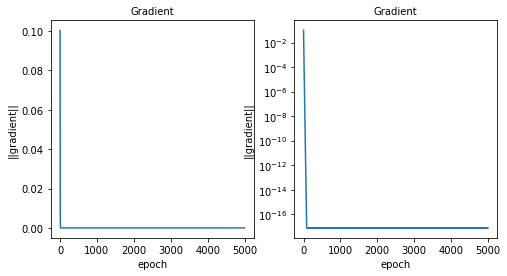

 
case_num:        111
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           0
inner loop:      20000000
train rms error: 0.210312587999
test rms error:  0.196425660817


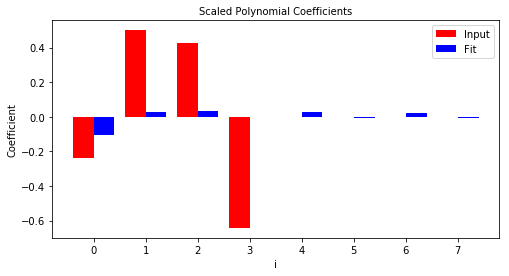

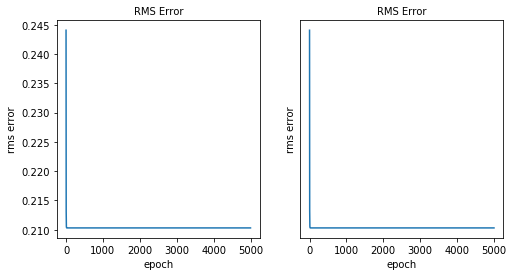

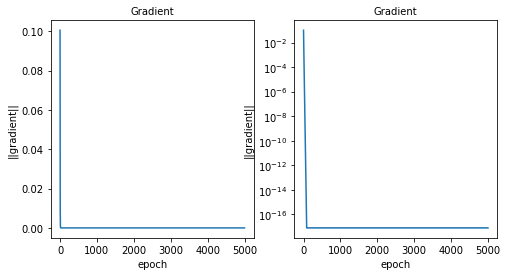

 
done


In [118]:
# Case: L2 regularization without power parameter, lambda=2
# Case parameters
# Type of regularization: 2 => L2 regularization
reg_type = 2
# Lambda: 1
lambda_reg = 1
# Power parameter: 0 => No power parameter
reg_power = 0
run(reg_type, lambda_reg, reg_power)

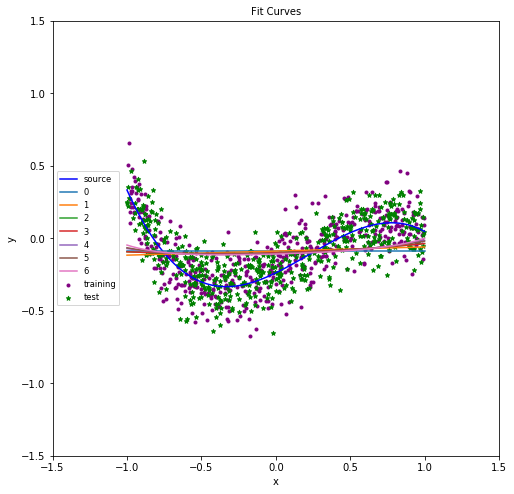

In [119]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

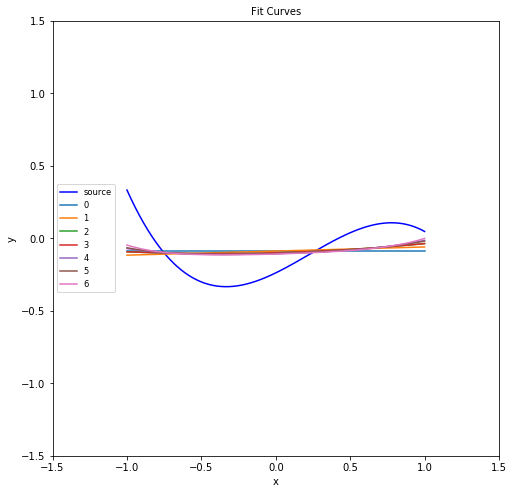

In [120]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

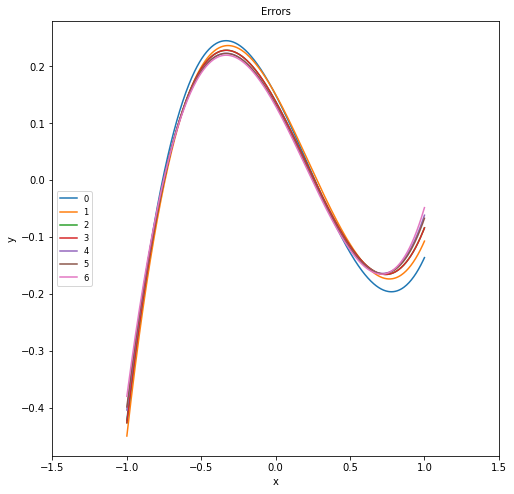

In [121]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

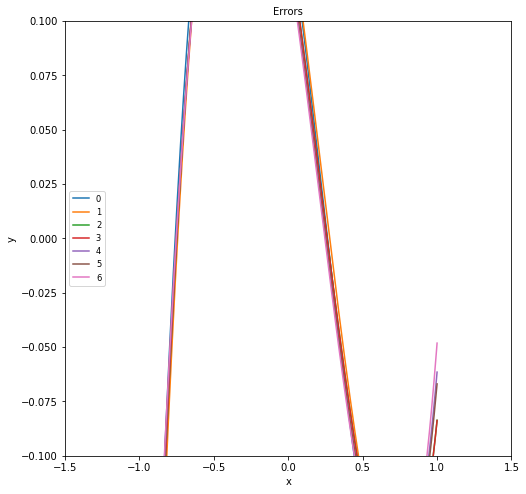

In [122]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

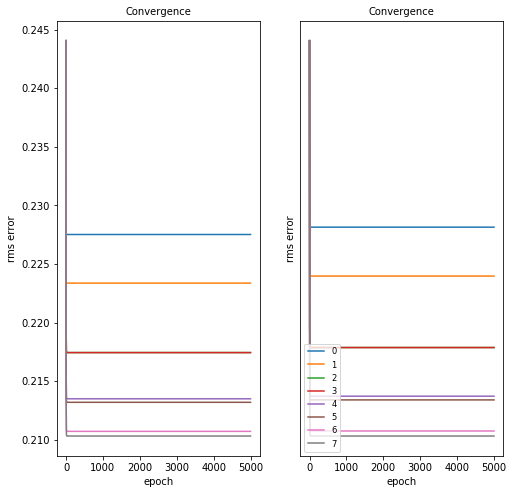

In [123]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


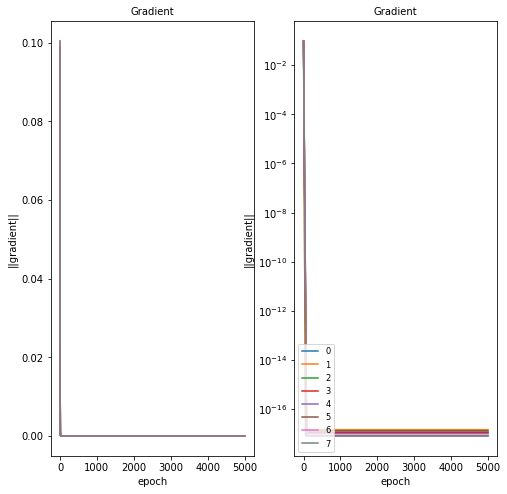

In [124]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


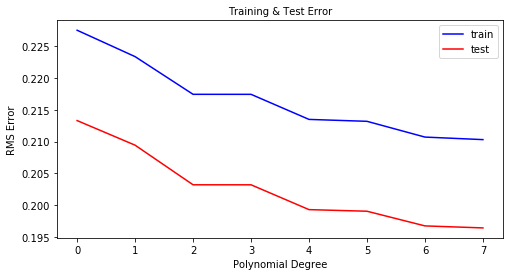

In [125]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        112
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           0
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


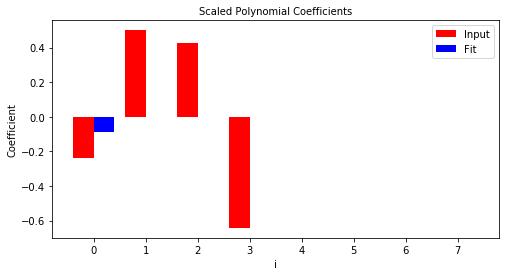

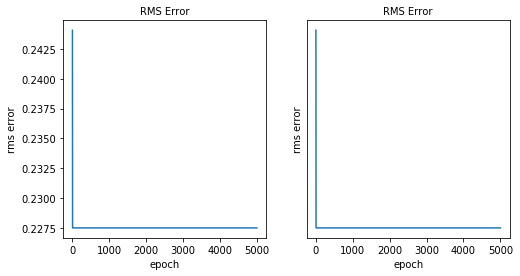

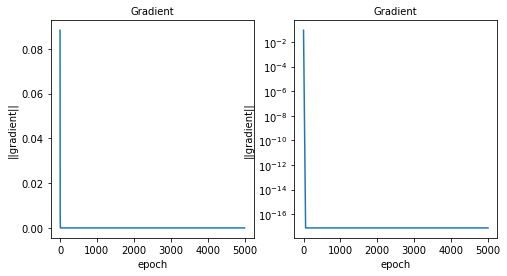

 
case_num:        113
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           0
inner loop:      5000000
train rms error: nan
test rms error:  nan


c:\users\balwant\anaconda2\envs\python3\lib\site-packages\ipykernel_launcher.py:81: RuntimeWarning: overflow encountered in square
c:\users\balwant\anaconda2\envs\python3\lib\site-packages\ipykernel_launcher.py:80: RuntimeWarning: invalid value encountered in subtract


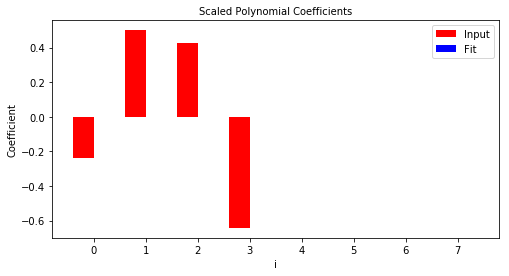

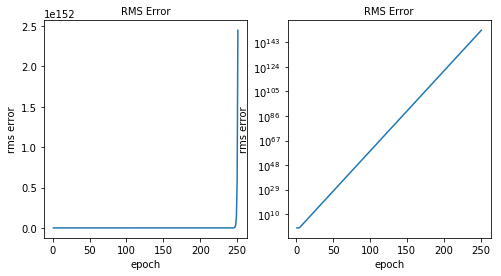

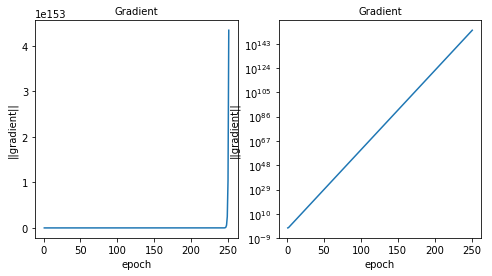

 
case_num:        114
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           0
inner loop:      7500000
train rms error: nan
test rms error:  nan


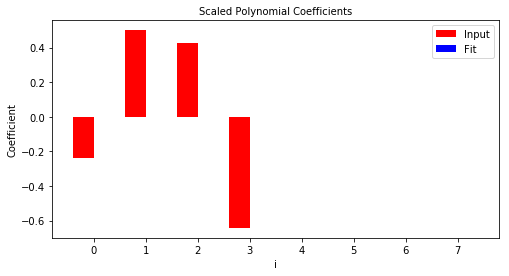

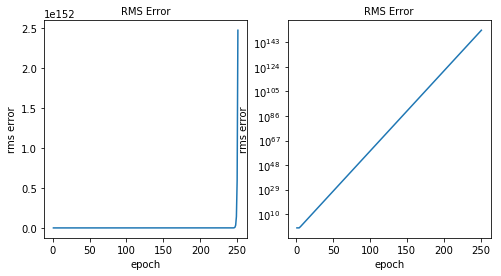

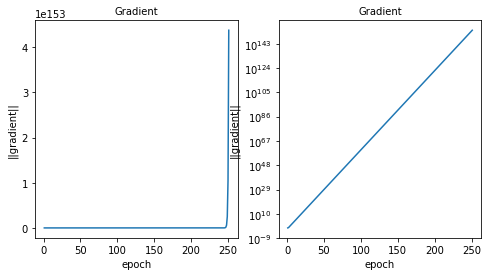

 
case_num:        115
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           0
inner loop:      10000000
train rms error: nan
test rms error:  nan


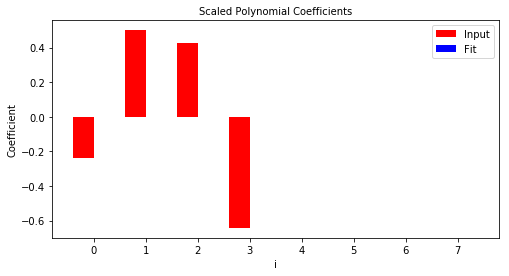

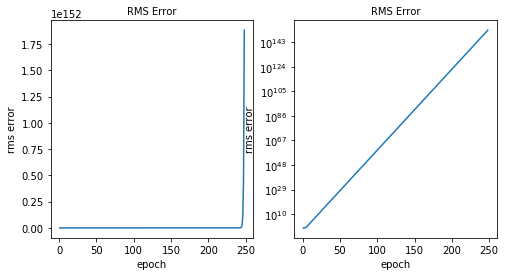

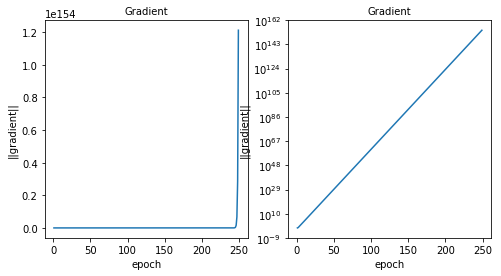

 
case_num:        116
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           0
inner loop:      12500000
train rms error: nan
test rms error:  nan


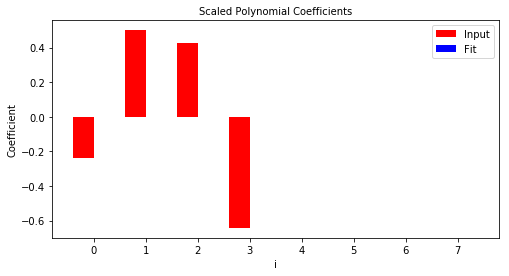

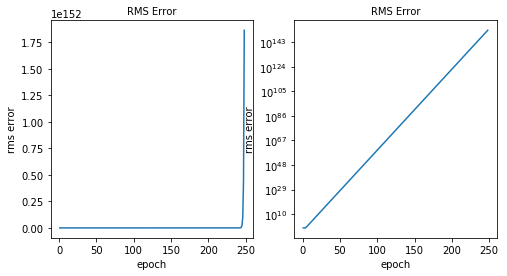

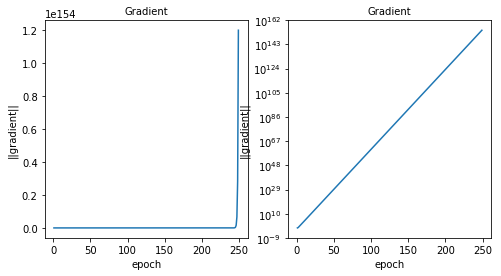

 
case_num:        117
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           0
inner loop:      15000000
train rms error: nan
test rms error:  nan


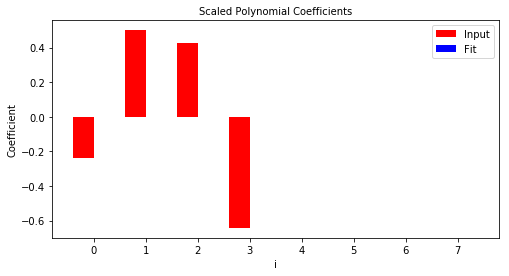

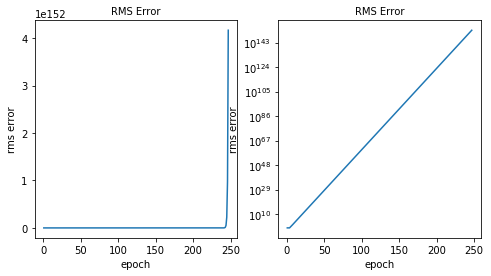

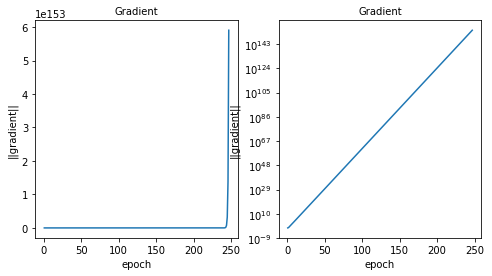

 
case_num:        118
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           0
inner loop:      17500000
train rms error: nan
test rms error:  nan


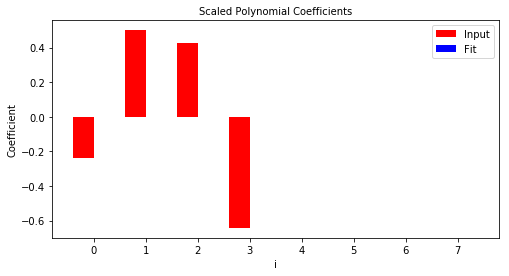

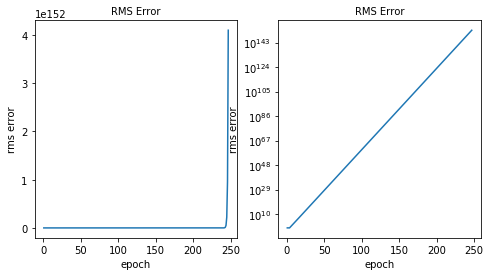

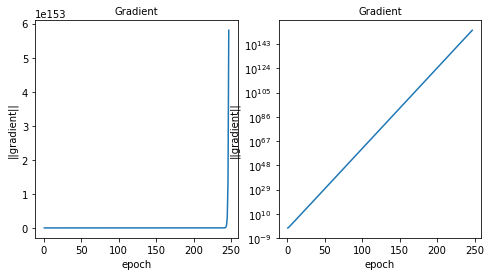

 
case_num:        119
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           0
inner loop:      20000000
train rms error: nan
test rms error:  nan


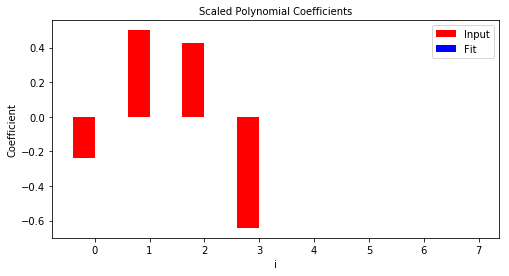

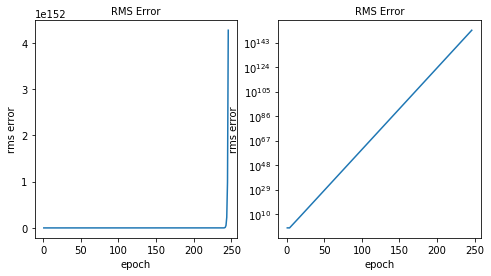

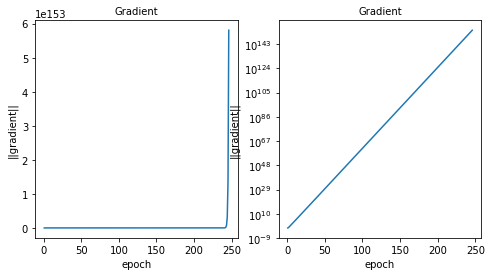

 
done


In [126]:
# Case: L2 regularization without power parameter, lambda=10
# Case parameters
# Type of regularization: 2 => L2 regularization
reg_type = 2
# Lambda: 10
lambda_reg = 10
# Power parameter: 0 => No power parameter
reg_power = 0
run(reg_type, lambda_reg, reg_power)

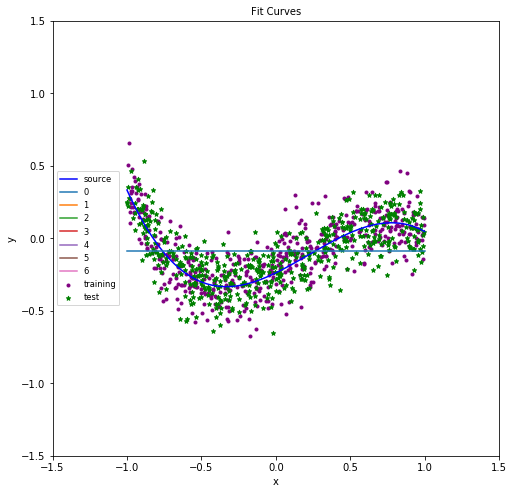

In [127]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

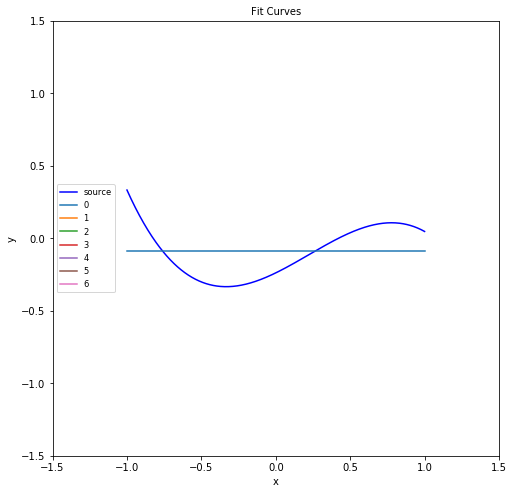

In [128]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

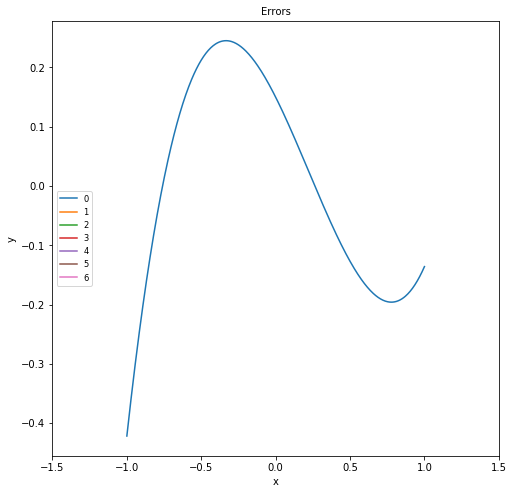

In [129]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

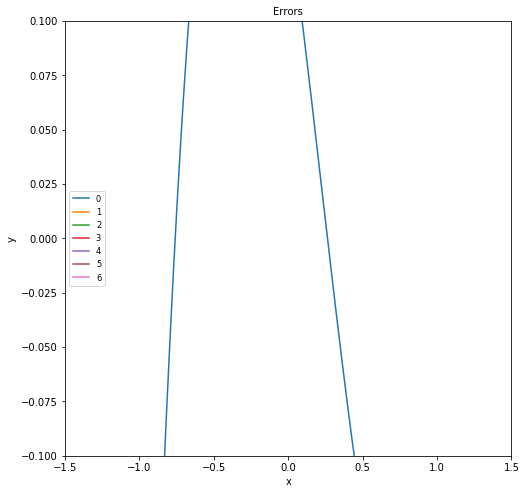

In [130]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

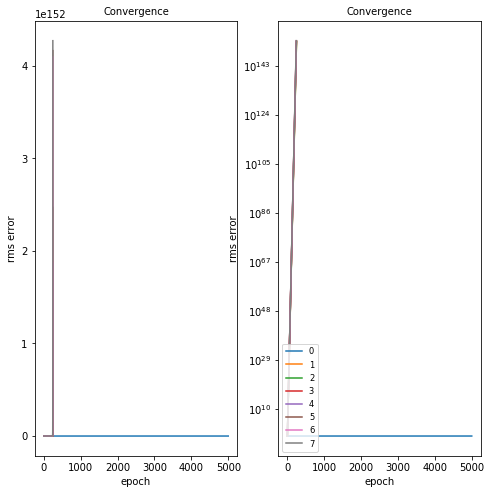

In [131]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


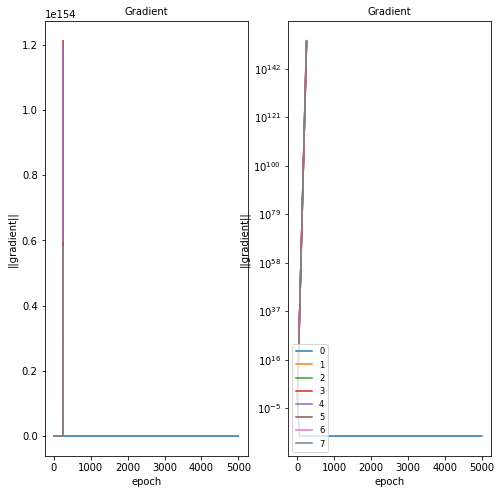

In [132]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


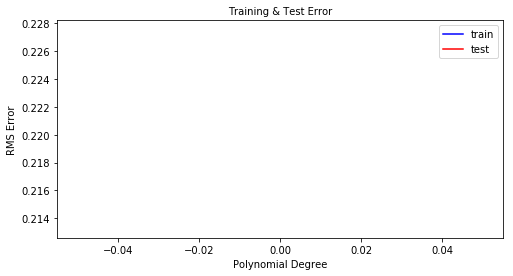

In [133]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        120
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           0
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


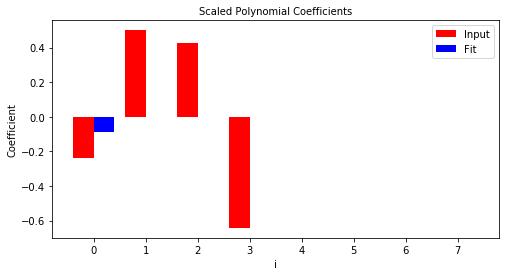

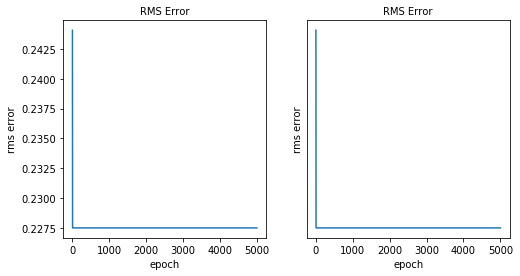

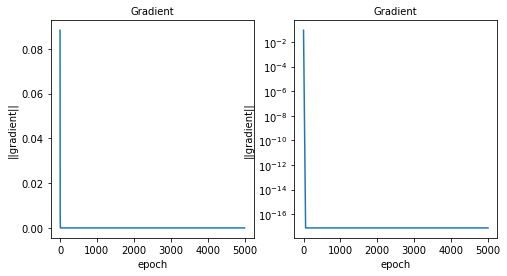

 
case_num:        121
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           0
inner loop:      5000000
train rms error: nan
test rms error:  nan


c:\users\balwant\anaconda2\envs\python3\lib\site-packages\ipykernel_launcher.py:81: RuntimeWarning: overflow encountered in square
c:\users\balwant\anaconda2\envs\python3\lib\site-packages\ipykernel_launcher.py:80: RuntimeWarning: invalid value encountered in subtract


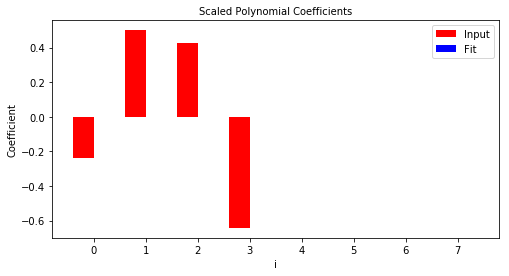

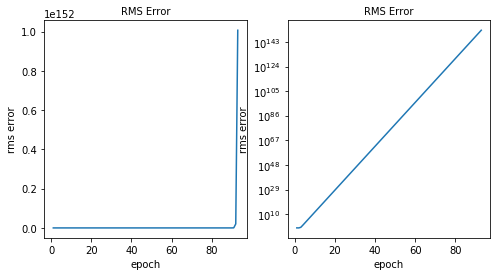

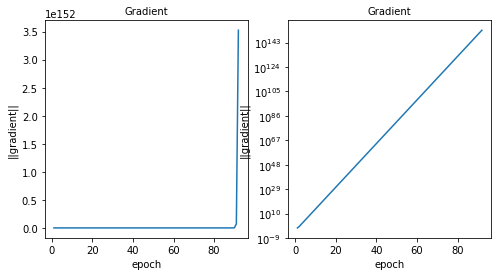

 
case_num:        122
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           0
inner loop:      7500000
train rms error: nan
test rms error:  nan


c:\users\balwant\anaconda2\envs\python3\lib\site-packages\ipykernel_launcher.py:118: RuntimeWarning: overflow encountered in double_scalars


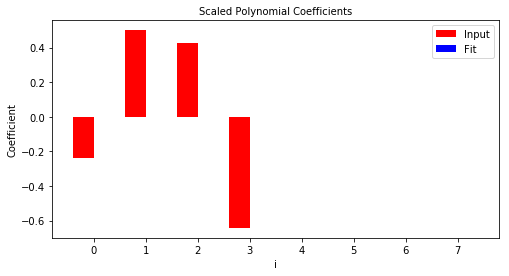

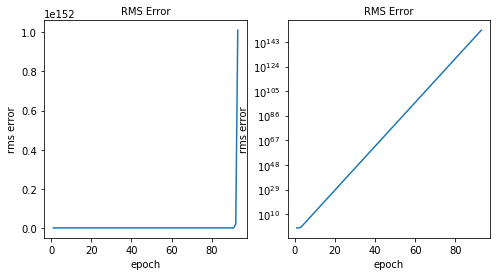

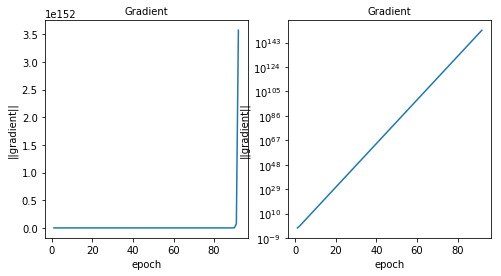

 
case_num:        123
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           0
inner loop:      10000000
train rms error: nan
test rms error:  nan


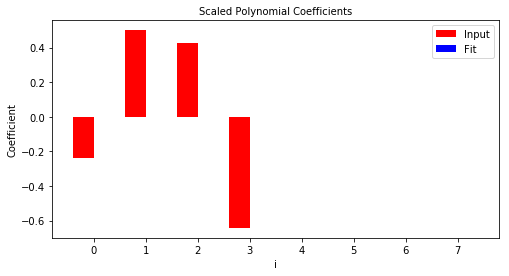

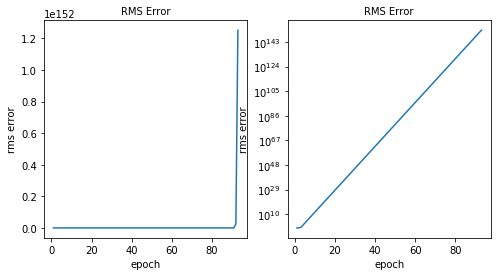

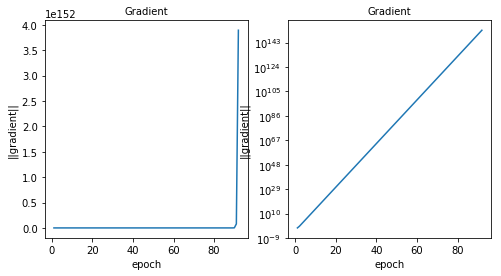

 
case_num:        124
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           0
inner loop:      12500000
train rms error: nan
test rms error:  nan


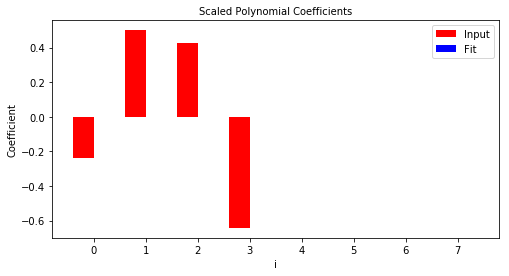

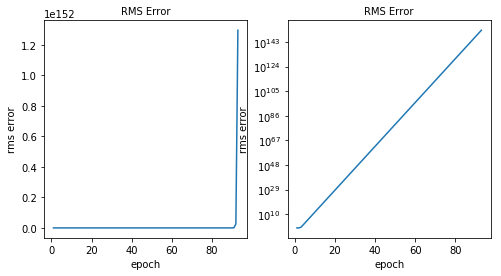

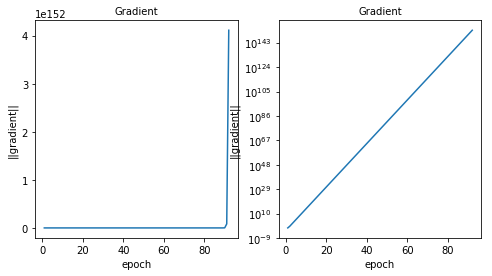

 
case_num:        125
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           0
inner loop:      15000000
train rms error: nan
test rms error:  nan


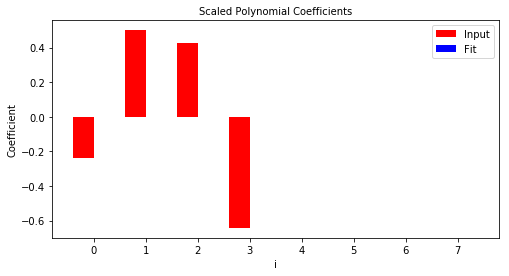

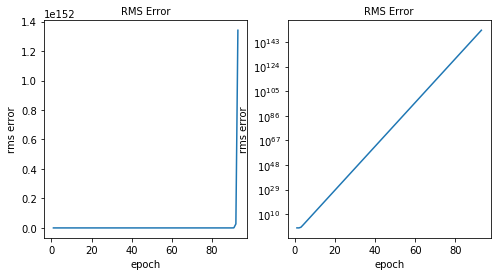

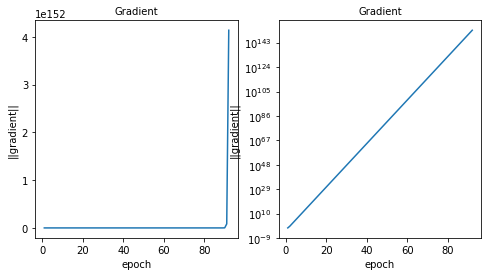

 
case_num:        126
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           0
inner loop:      17500000
train rms error: nan
test rms error:  nan


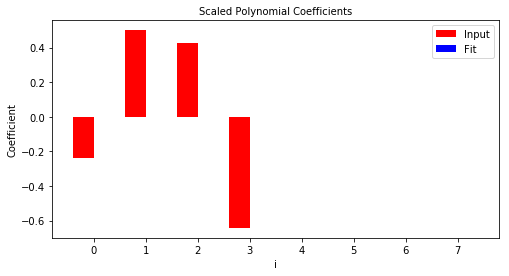

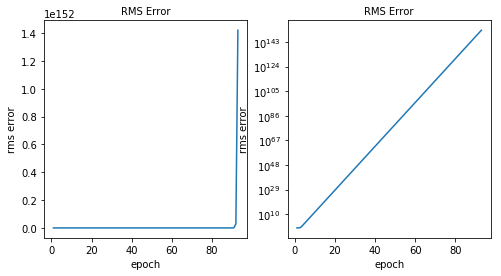

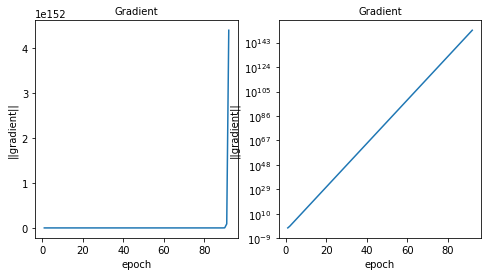

 
case_num:        127
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           0
inner loop:      20000000
train rms error: nan
test rms error:  nan


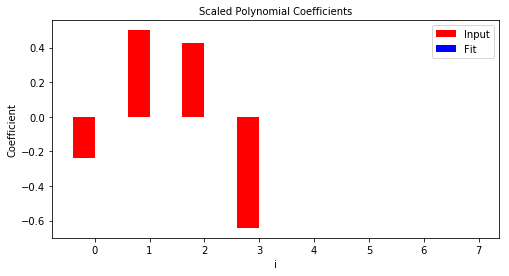

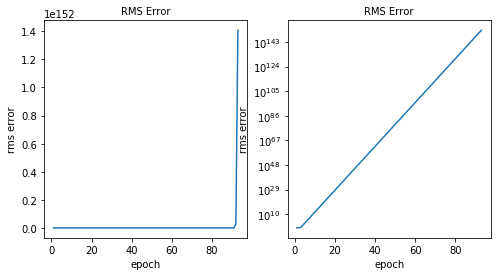

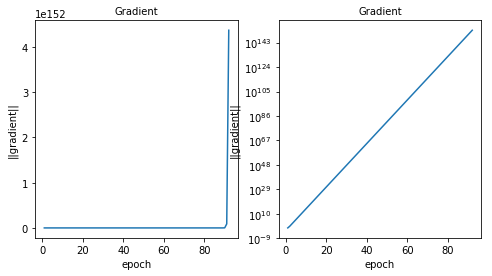

 
done


In [134]:
# Case: L2 regularization without power parameter, lambda=100
# Case parameters
# Type of regularization: 2 => L2 regularization
reg_type = 2
# Lambda: 100
lambda_reg = 100
# Power parameter: 0 => No power parameter
reg_power = 0
run(reg_type, lambda_reg, reg_power)

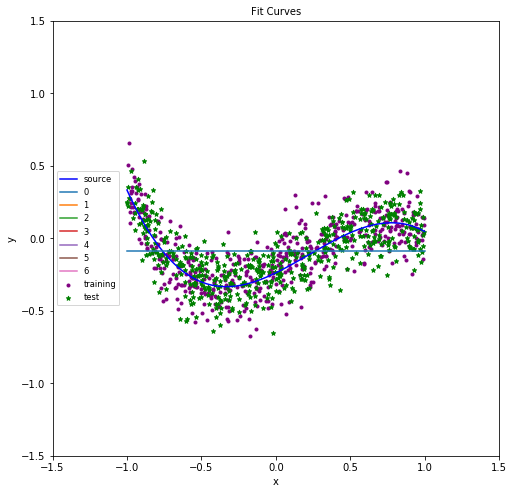

In [135]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

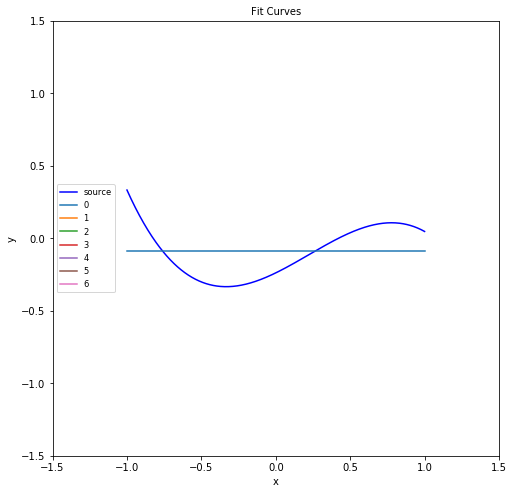

In [136]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

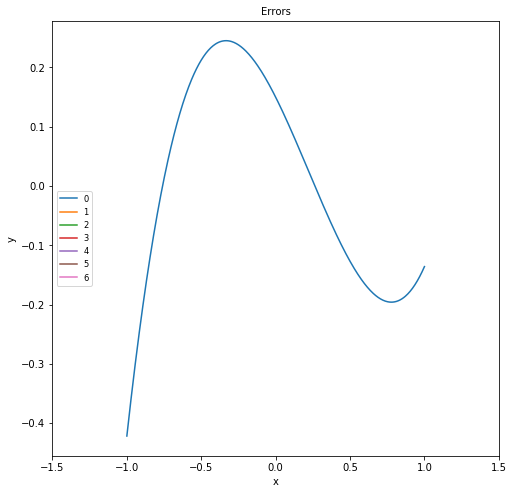

In [137]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

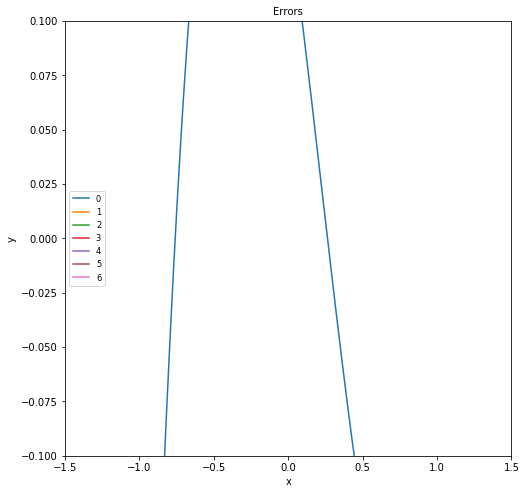

In [138]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

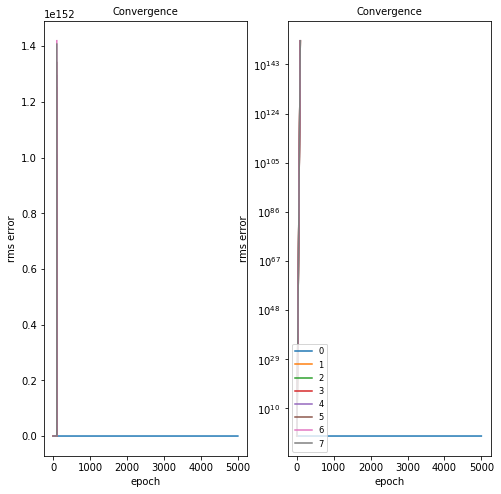

In [139]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


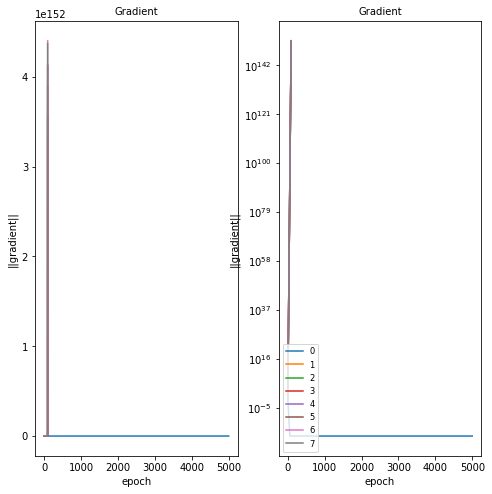

In [140]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


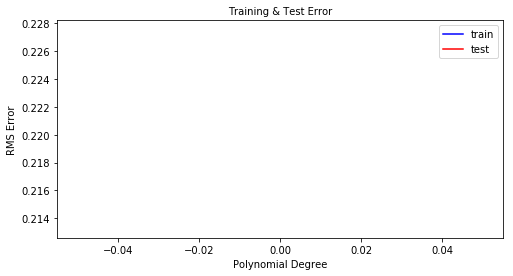

In [141]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

## -----------------------------L1 Regularization with power parameter----------------------------


case_num:        128
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           1
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


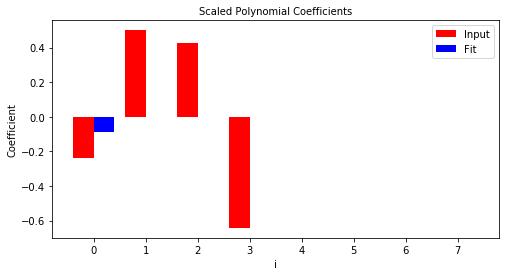

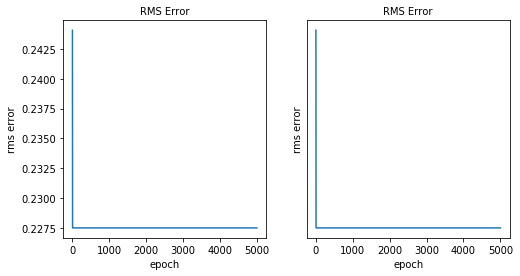

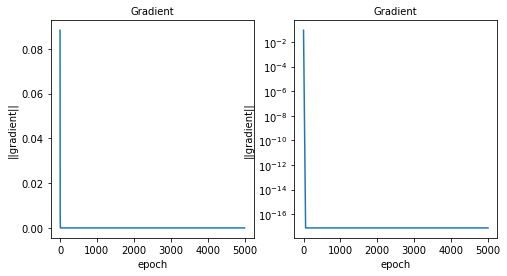

 
case_num:        129
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           1
inner loop:      5000000
train rms error: 0.218032534971
test rms error:  0.205423170843


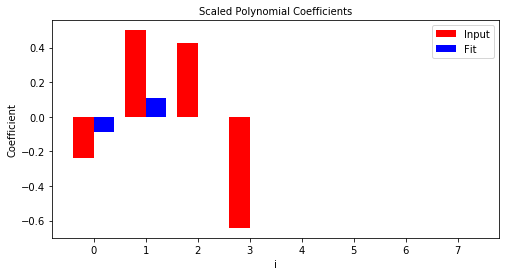

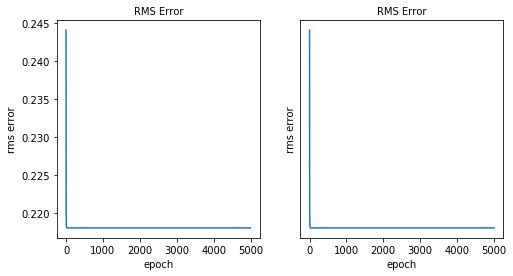

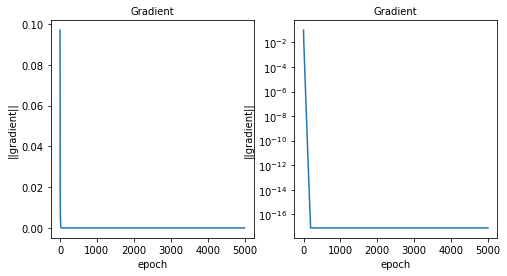

 
case_num:        130
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           1
inner loop:      7500000
train rms error: 0.178732920084
test rms error:  0.164478622931


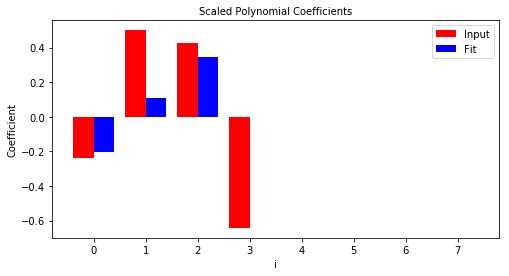

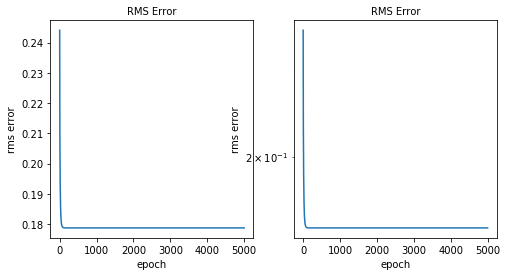

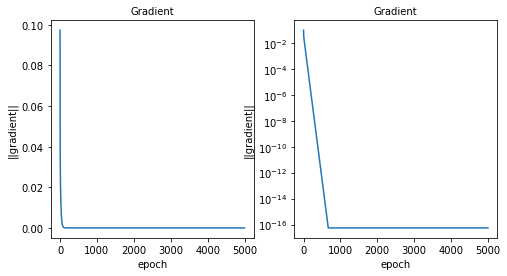

 
case_num:        131
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           1
inner loop:      10000000
train rms error: 0.154806413356
test rms error:  0.143480944643


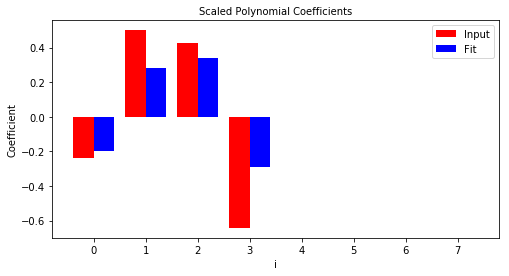

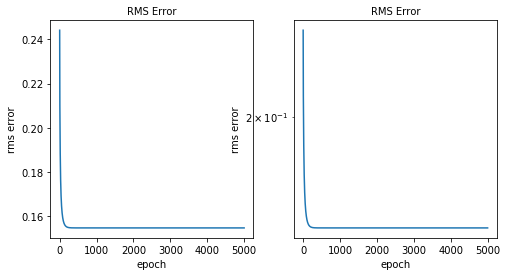

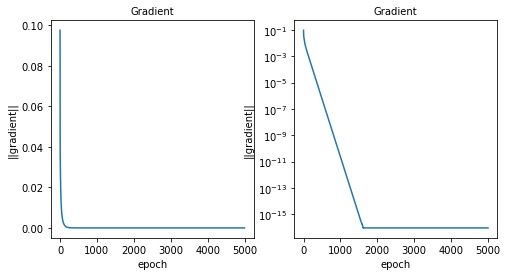

 
case_num:        132
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           1
inner loop:      12500000
train rms error: 0.15347450651
test rms error:  0.143206352434


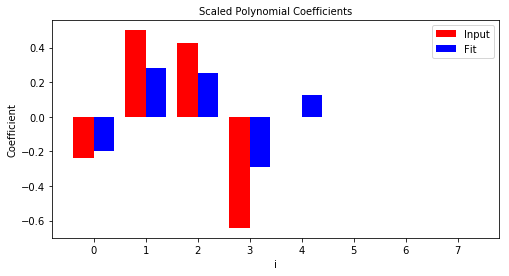

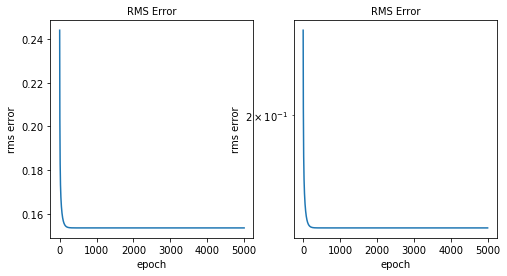

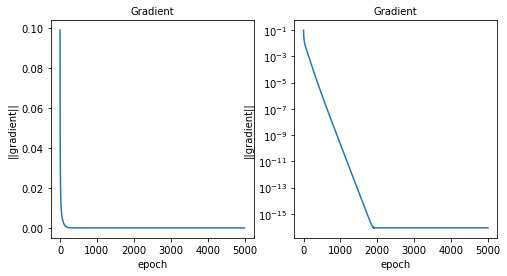

 
case_num:        133
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           1
inner loop:      15000000
train rms error: 0.147607468717
test rms error:  0.138775936383


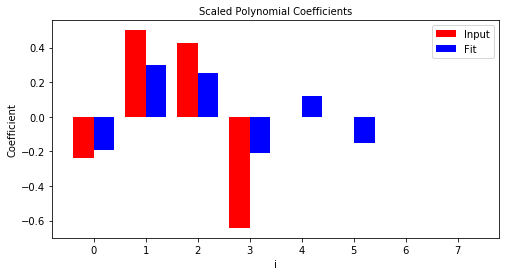

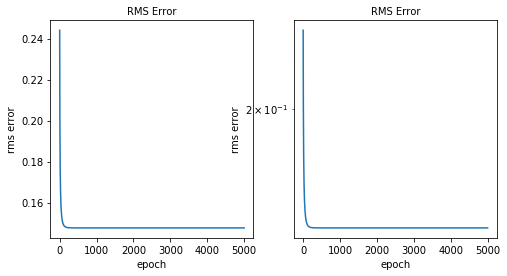

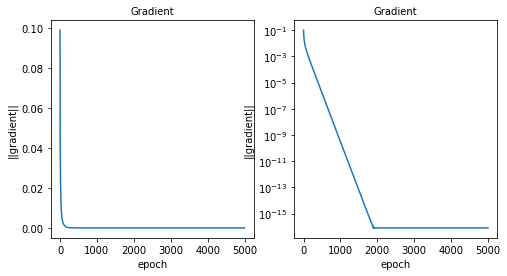

 
case_num:        134
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           1
inner loop:      17500000
train rms error: 0.147358978861
test rms error:  0.139126183802


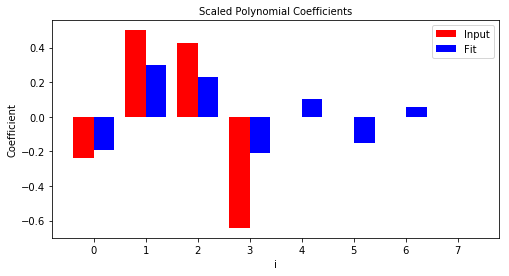

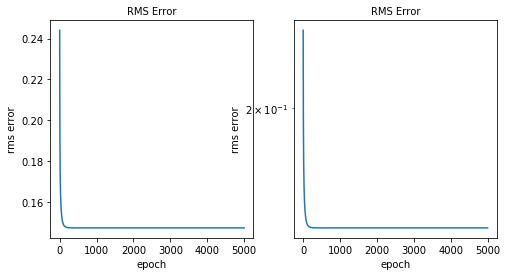

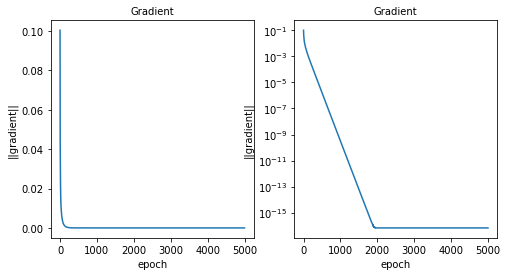

 
case_num:        135
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.01
Regularization:  2
Power:           1
inner loop:      20000000
train rms error: 0.145420234417
test rms error:  0.137949915327


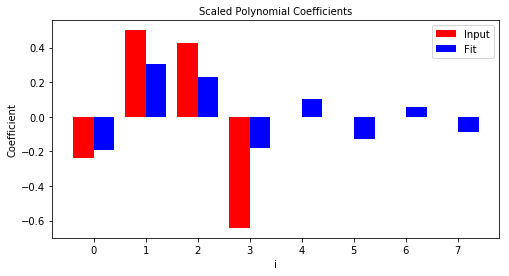

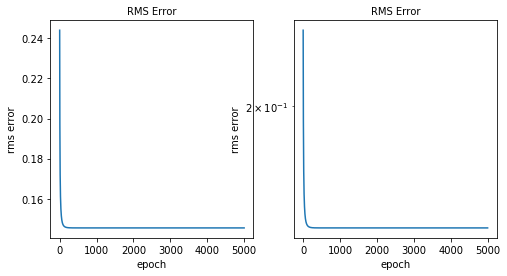

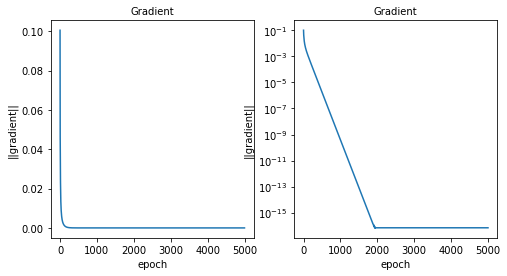

 
done


In [142]:
# Case: L2 regularization with power parameter, lambda=0.01
# Case parameters
# Type of regularization: 2 => L2 regularization
reg_type = 2
# Lambda: 0.01
lambda_reg = 0.01
# Power parameter: 1
reg_power = 1
run(reg_type, lambda_reg, reg_power)

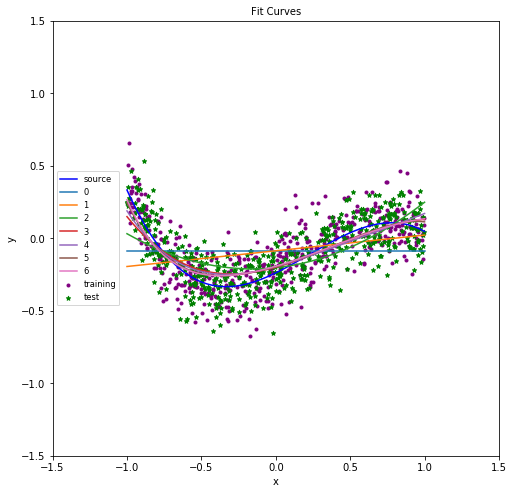

In [143]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

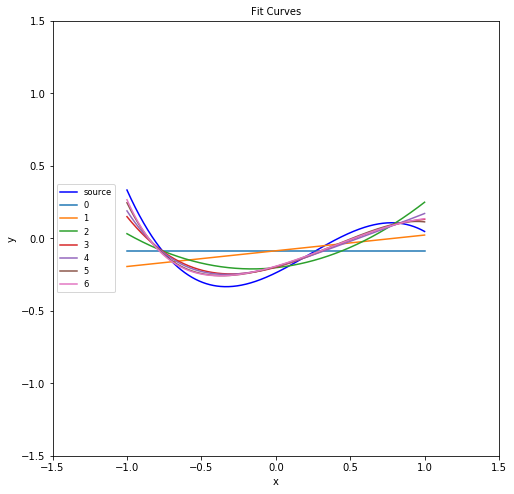

In [144]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

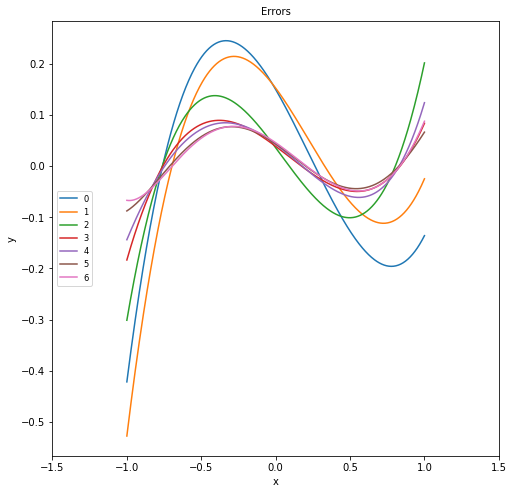

In [145]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

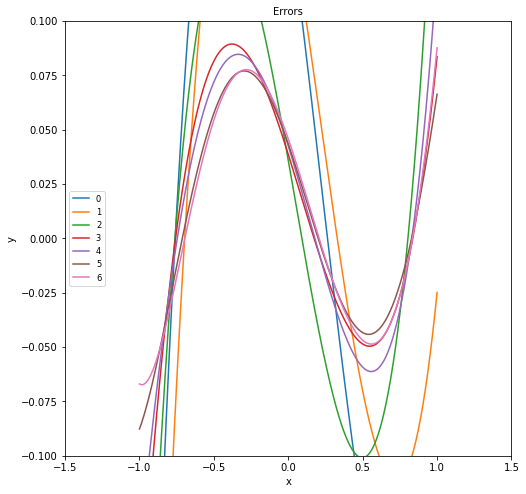

In [146]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

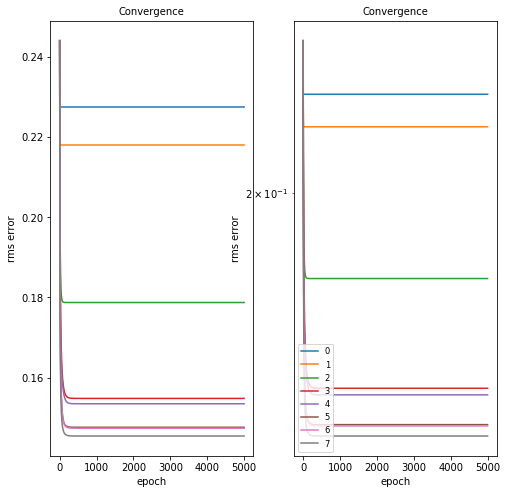

In [147]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


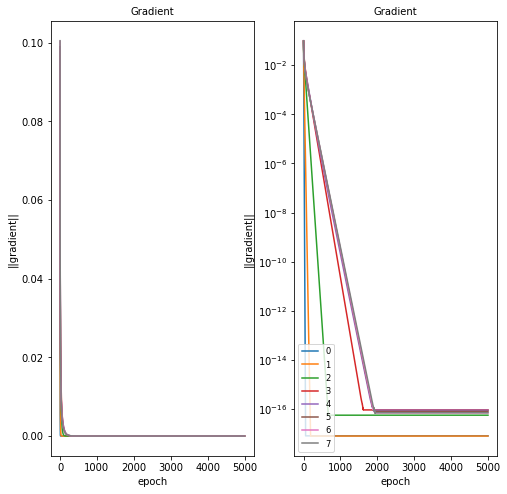

In [148]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


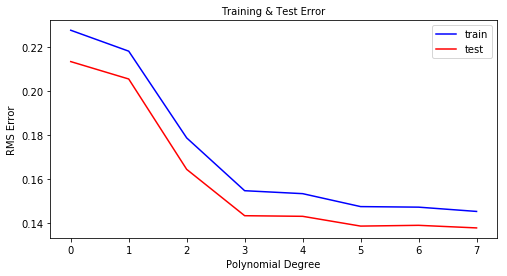

In [149]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        136
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           1
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


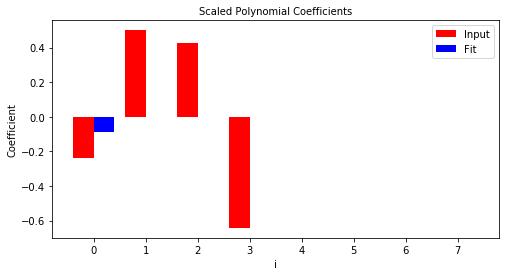

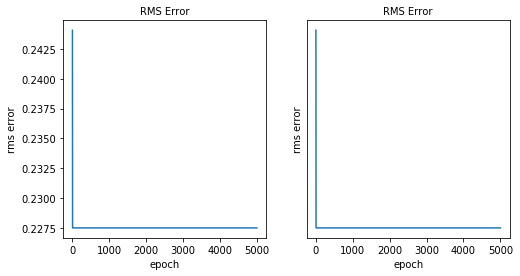

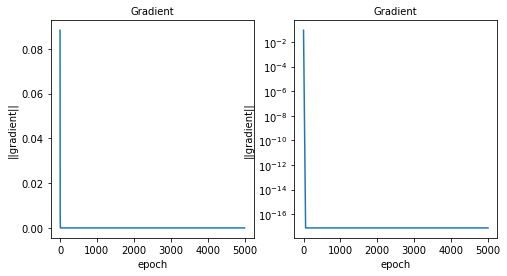

 
case_num:        137
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           1
inner loop:      5000000
train rms error: 0.218526519905
test rms error:  0.205474819453


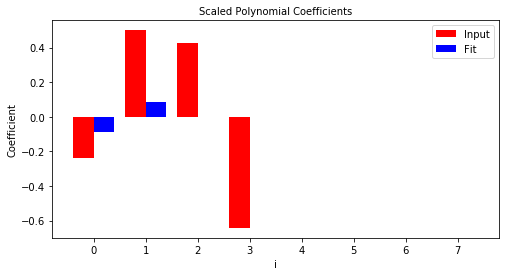

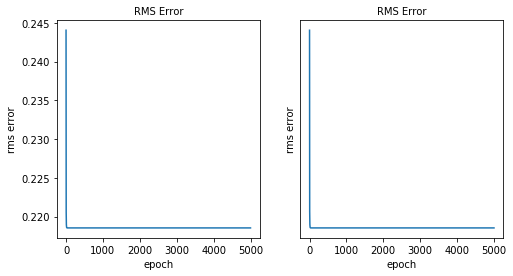

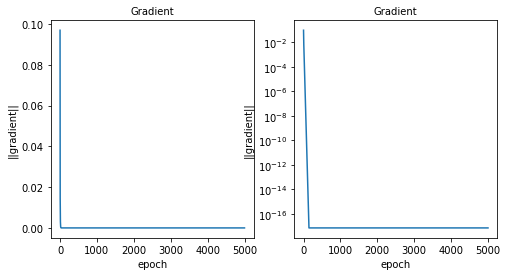

 
case_num:        138
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           1
inner loop:      7500000
train rms error: 0.197926183165
test rms error:  0.184016607442


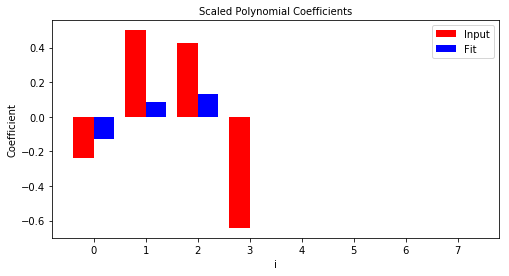

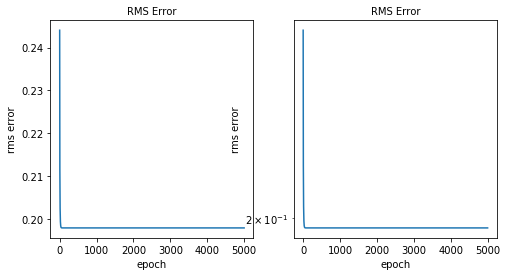

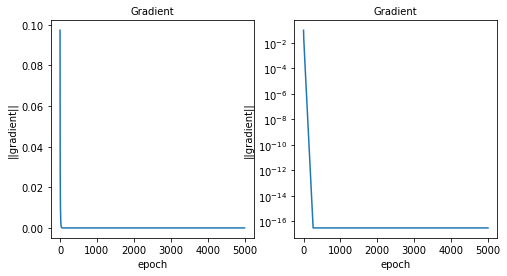

 
case_num:        139
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           1
inner loop:      10000000
train rms error: 0.195210206675
test rms error:  0.18149232847


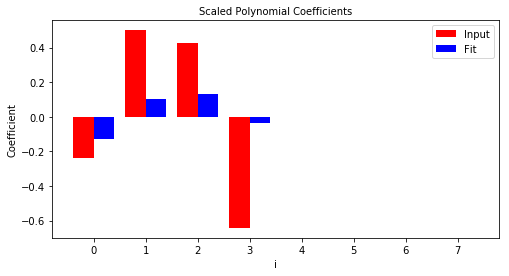

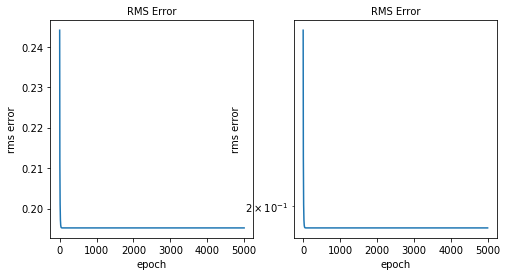

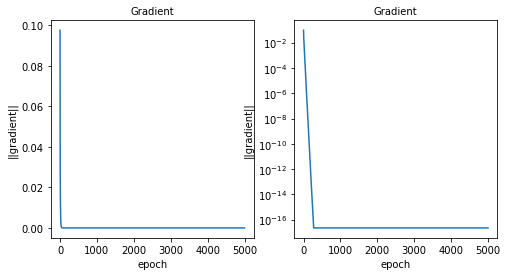

 
case_num:        140
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           1
inner loop:      12500000
train rms error: 0.190813422916
test rms error:  0.17737058533


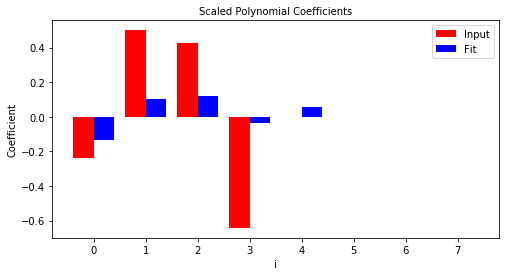

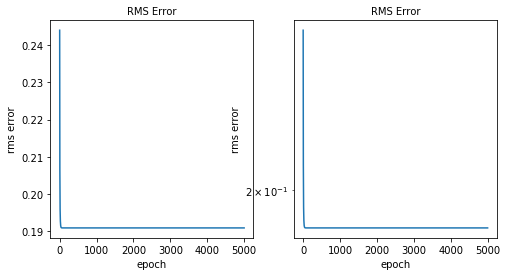

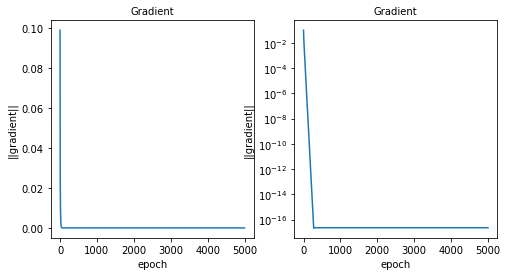

 
case_num:        141
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           1
inner loop:      15000000
train rms error: 0.18873734752
test rms error:  0.175538416398


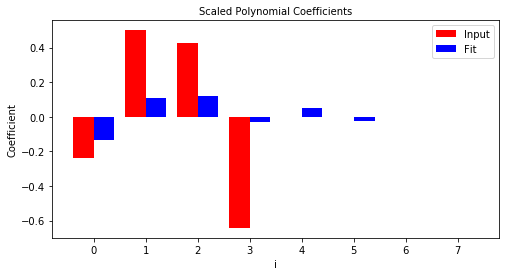

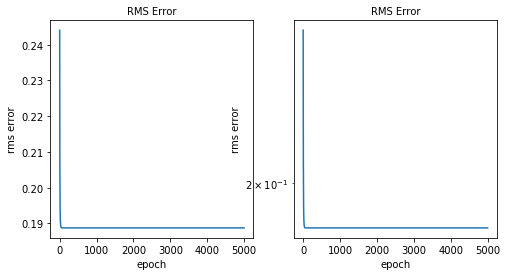

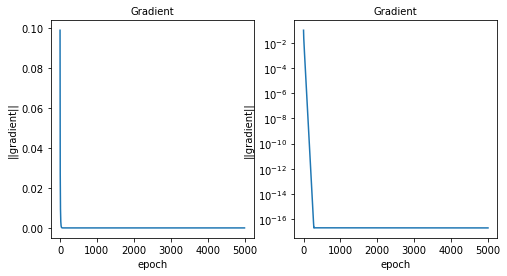

 
case_num:        142
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           1
inner loop:      17500000
train rms error: 0.187043862803
test rms error:  0.174149989833


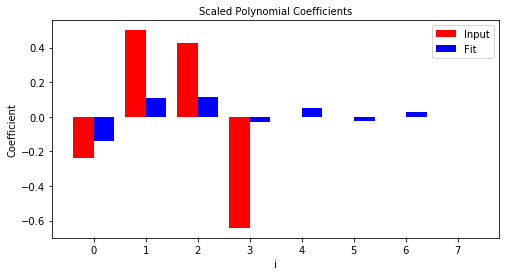

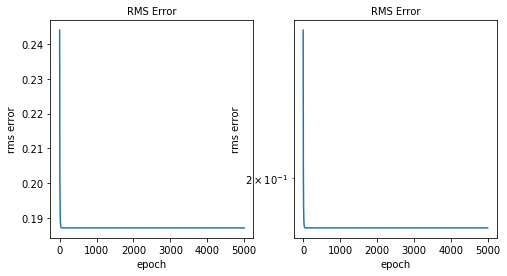

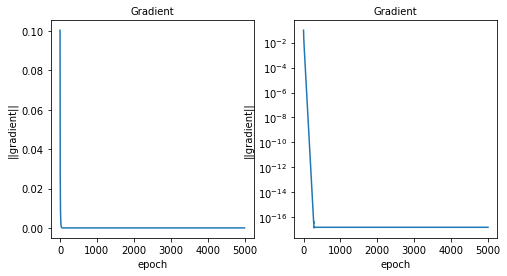

 
case_num:        143
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           0.1
Regularization:  2
Power:           1
inner loop:      20000000
train rms error: 0.185729697632
test rms error:  0.17304716874


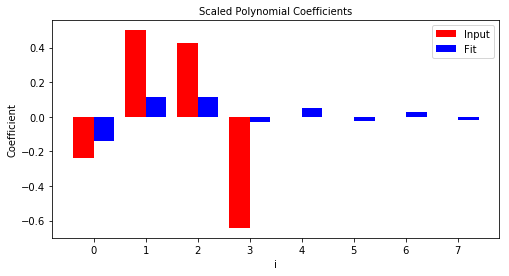

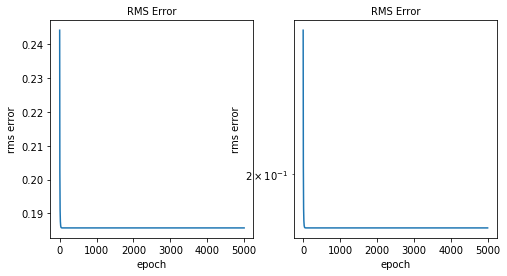

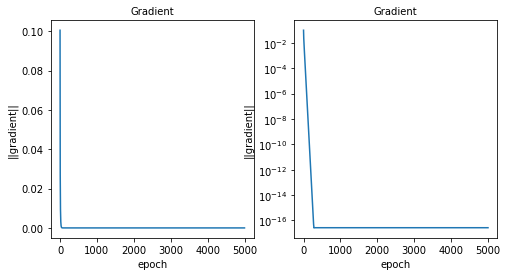

 
done


In [150]:
# Case: L2 regularization with power parameter, lambda=0.1
# Case parameters
# Type of regularization: 2 => L2 regularization
reg_type = 2
# Lambda: 0.1
lambda_reg = 0.1
# Power parameter: 1
reg_power = 1
run(reg_type, lambda_reg, reg_power)

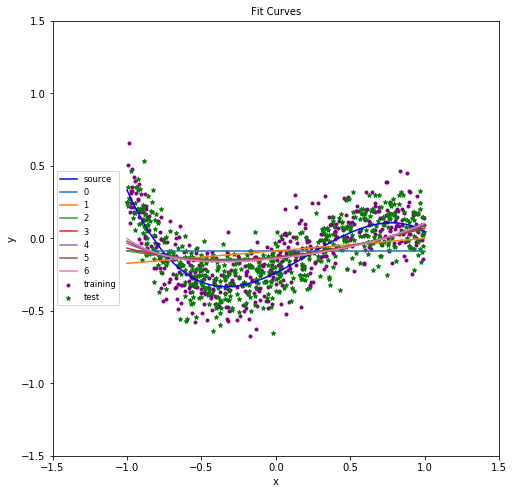

In [151]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

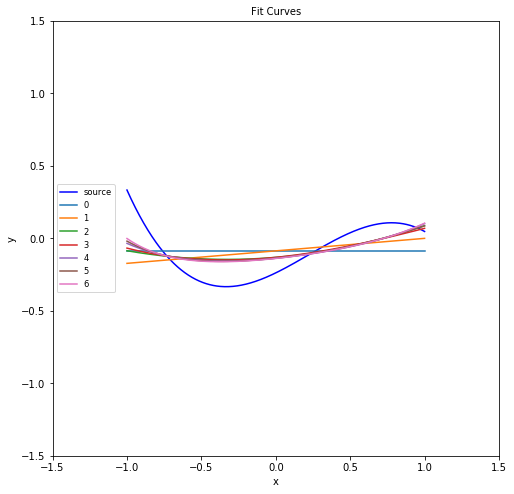

In [152]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

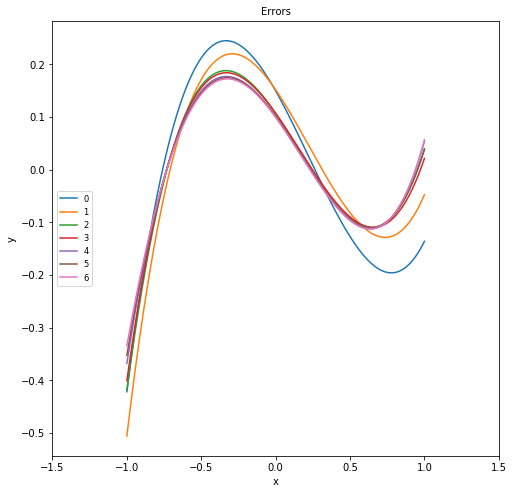

In [153]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

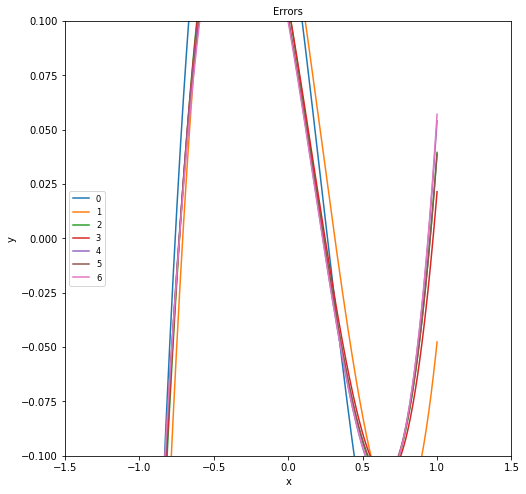

In [154]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

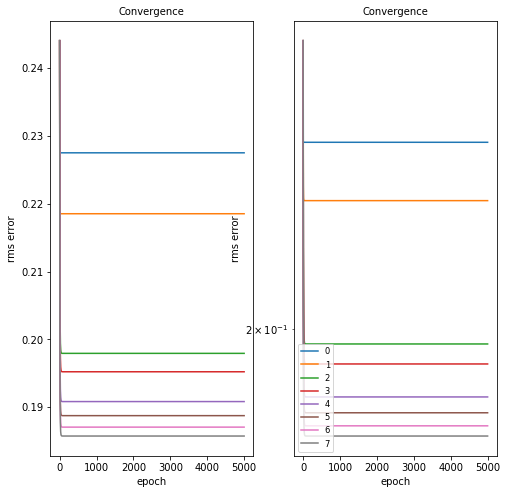

In [155]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


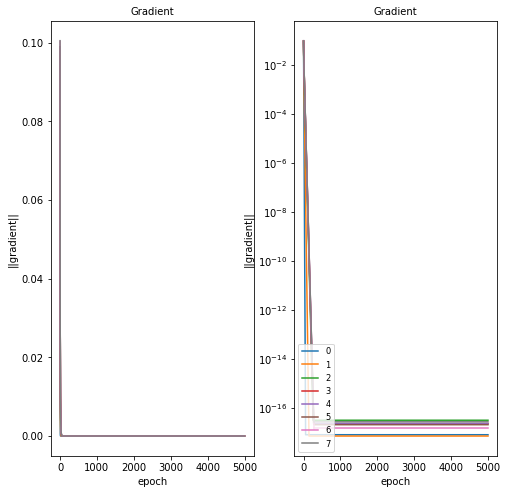

In [156]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


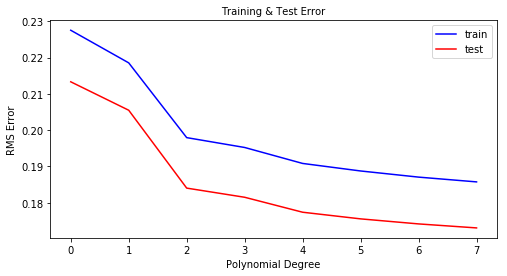

In [157]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        144
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           1
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


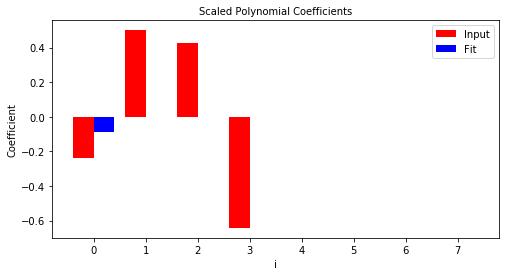

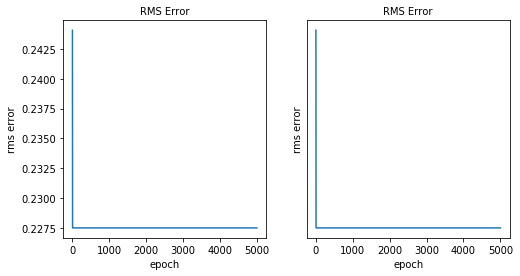

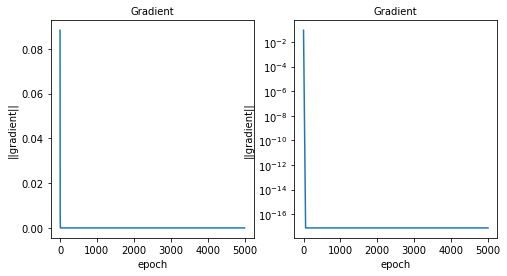

 
case_num:        145
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           1
inner loop:      5000000
train rms error: 0.223365153272
test rms error:  0.209437470981


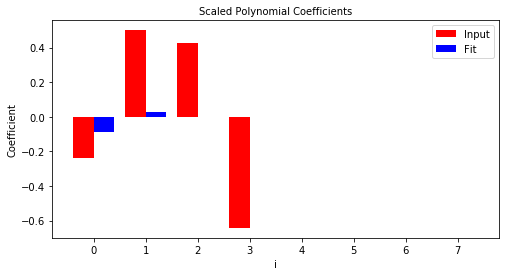

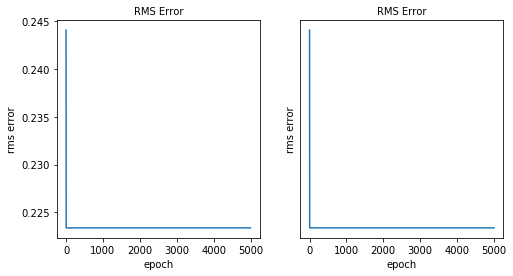

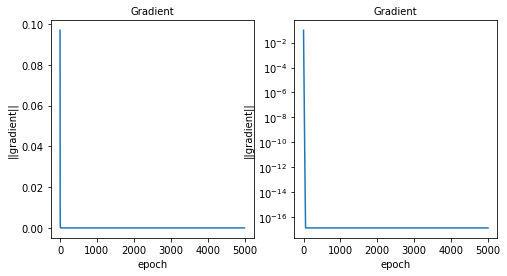

 
case_num:        146
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           1
inner loop:      7500000
train rms error: 0.220224385467
test rms error:  0.206141308353


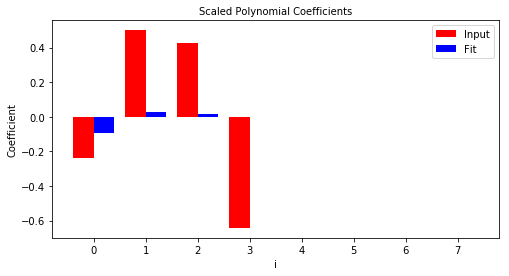

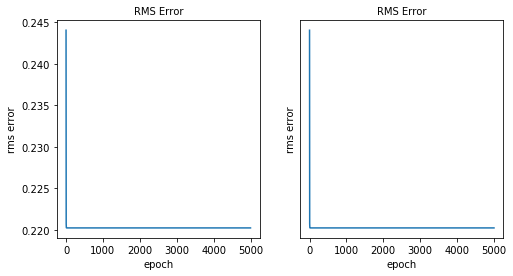

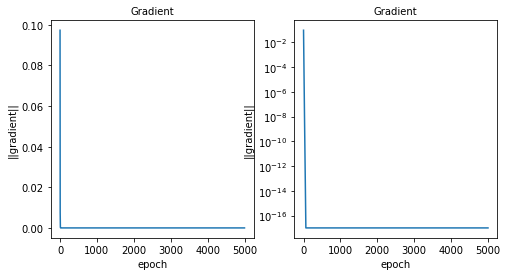

 
case_num:        147
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           1
inner loop:      10000000
train rms error: 0.220223347352
test rms error:  0.206140402014


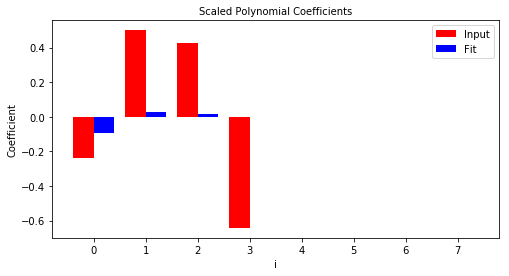

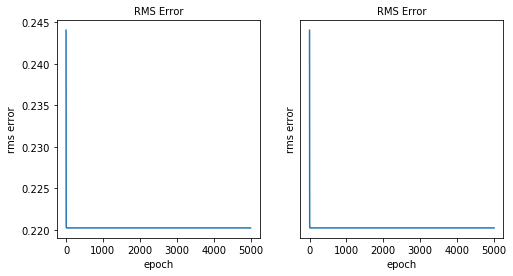

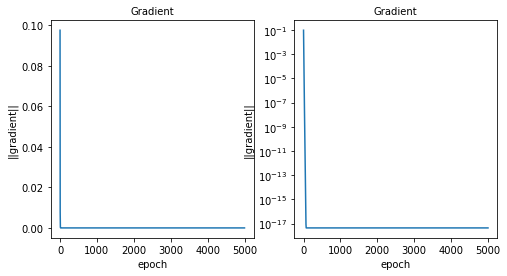

 
case_num:        148
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           1
inner loop:      12500000
train rms error: 1.9898700221e+151
test rms error:  1.97049819068e+151


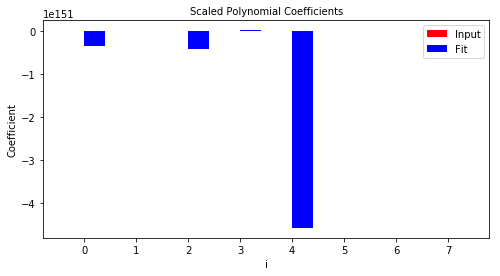

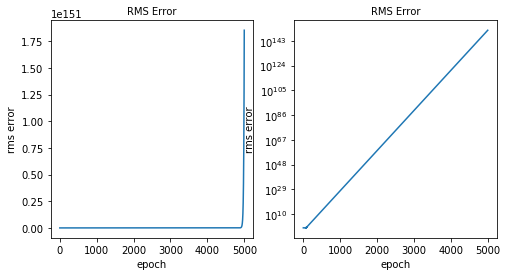

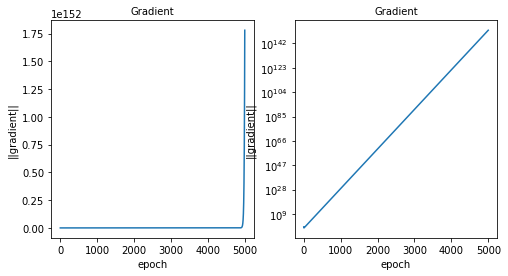

 
case_num:        149
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           1
inner loop:      15000000
train rms error: nan
test rms error:  nan


c:\users\balwant\anaconda2\envs\python3\lib\site-packages\ipykernel_launcher.py:81: RuntimeWarning: overflow encountered in square
c:\users\balwant\anaconda2\envs\python3\lib\site-packages\ipykernel_launcher.py:80: RuntimeWarning: invalid value encountered in subtract


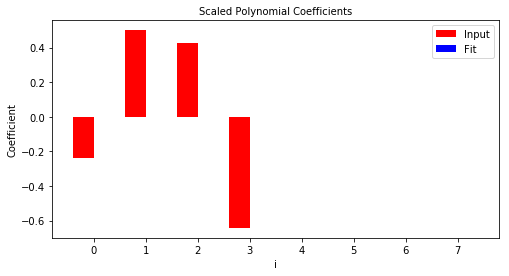

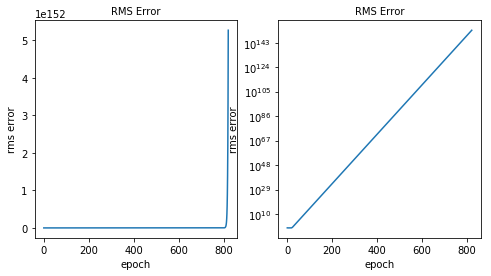

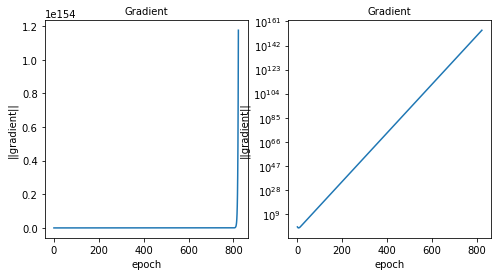

 
case_num:        150
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           1
inner loop:      17500000
train rms error: nan
test rms error:  nan


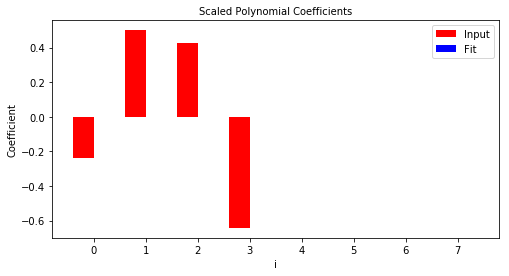

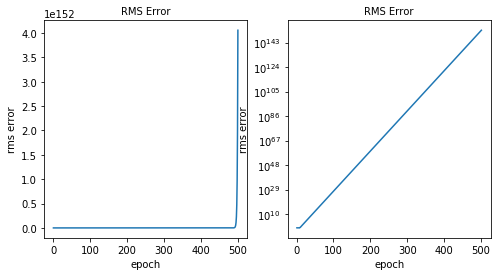

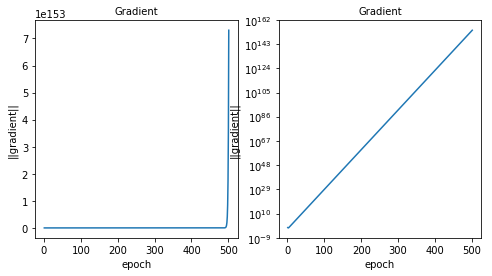

 
case_num:        151
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           1
Regularization:  2
Power:           1
inner loop:      20000000
train rms error: nan
test rms error:  nan


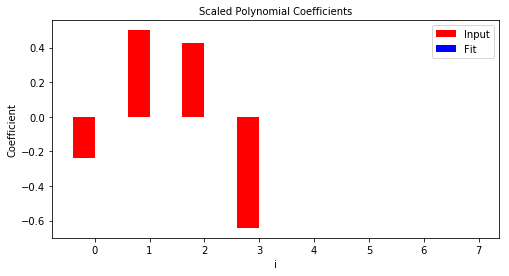

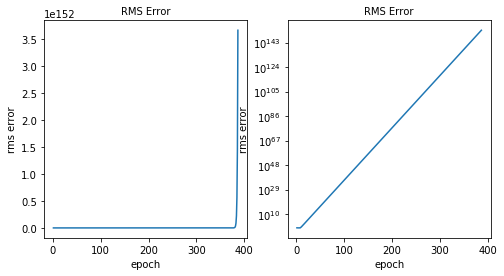

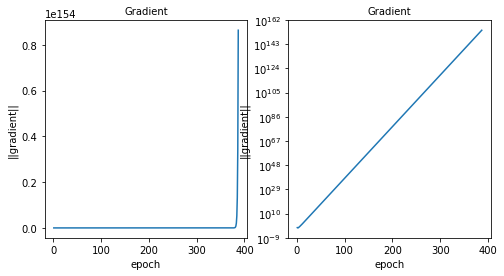

 
done


In [158]:
# Case: L2 regularization with power parameter, lambda=1
# Case parameters
# Type of regularization: 2 => L2 regularization
reg_type = 2
# Lambda: 1
lambda_reg = 1
# Power parameter: 1
reg_power = 1
run(reg_type, lambda_reg, reg_power)

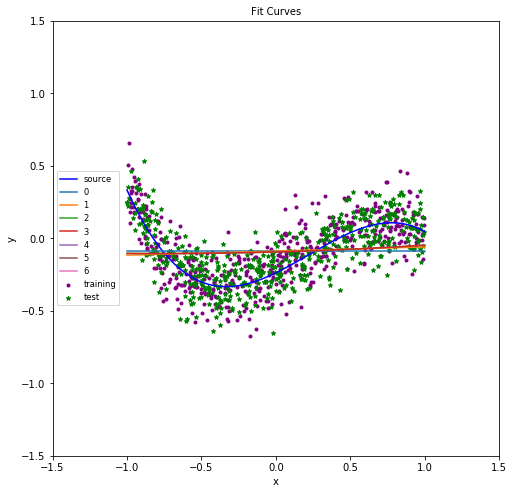

In [159]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

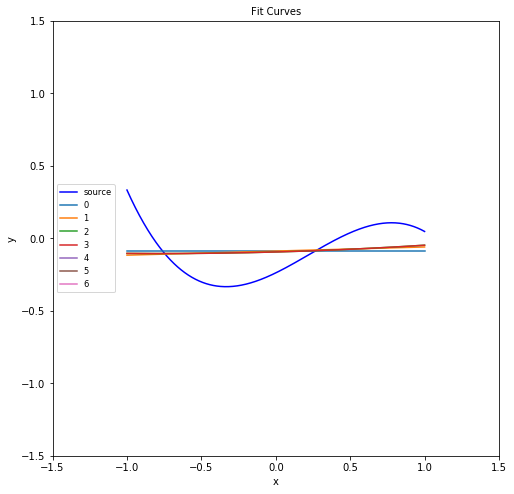

In [160]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

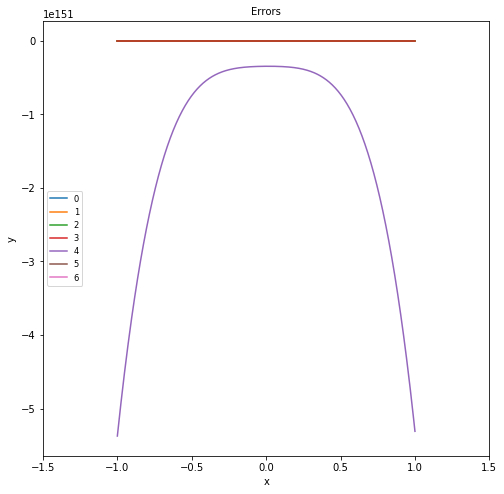

In [161]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

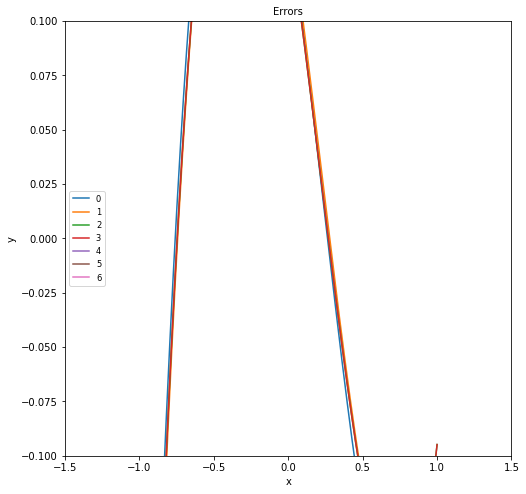

In [162]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

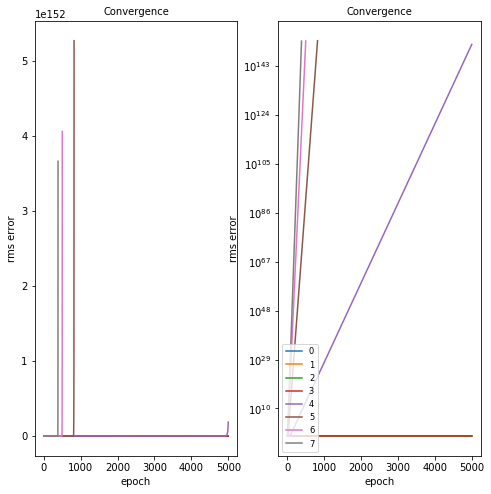

In [163]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


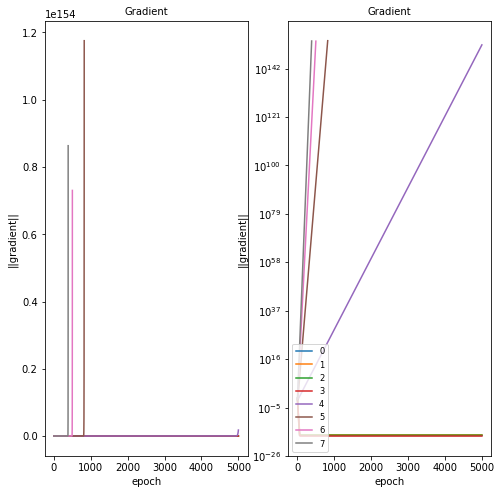

In [164]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


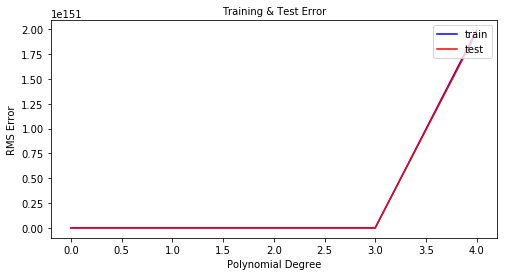

In [165]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        152
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           1
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


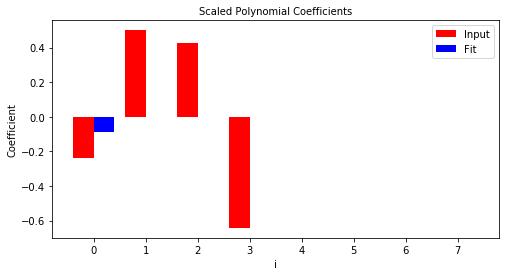

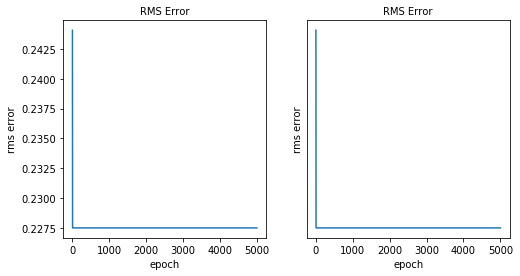

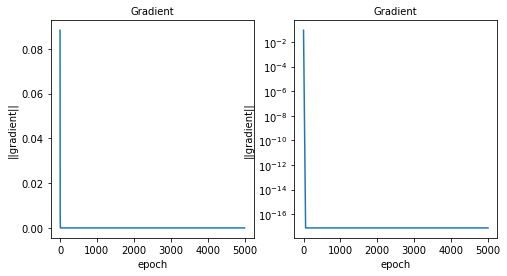

 
case_num:        153
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           1
inner loop:      5000000
train rms error: nan
test rms error:  nan


c:\users\balwant\anaconda2\envs\python3\lib\site-packages\ipykernel_launcher.py:81: RuntimeWarning: overflow encountered in square
c:\users\balwant\anaconda2\envs\python3\lib\site-packages\ipykernel_launcher.py:80: RuntimeWarning: invalid value encountered in subtract


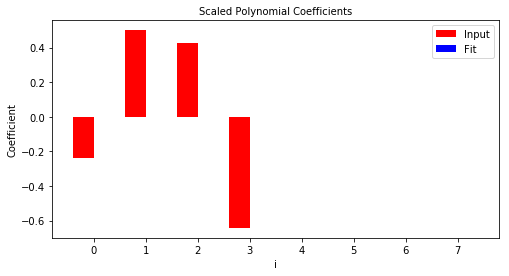

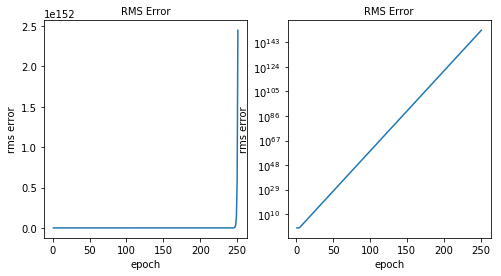

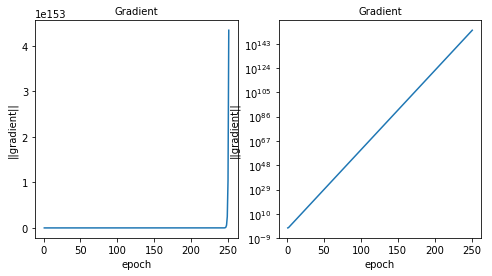

 
case_num:        154
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           1
inner loop:      7500000
train rms error: nan
test rms error:  nan


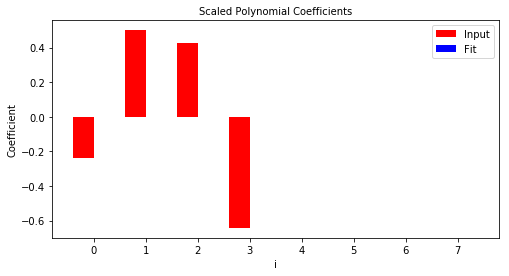

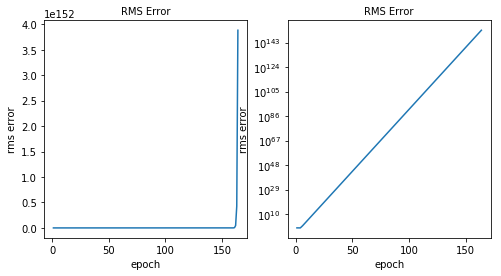

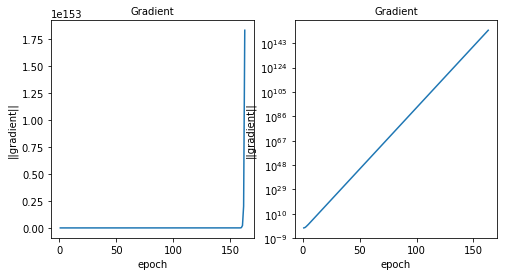

 
case_num:        155
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           1
inner loop:      10000000
train rms error: nan
test rms error:  nan


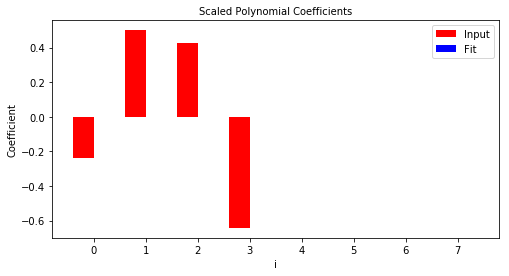

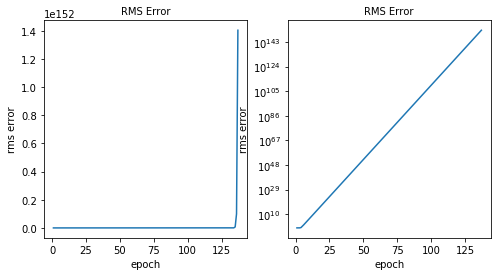

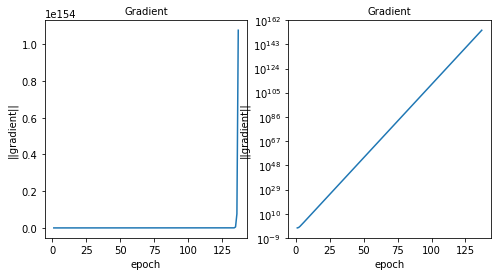

 
case_num:        156
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           1
inner loop:      12500000
train rms error: nan
test rms error:  nan


c:\users\balwant\anaconda2\envs\python3\lib\site-packages\ipykernel_launcher.py:118: RuntimeWarning: overflow encountered in double_scalars


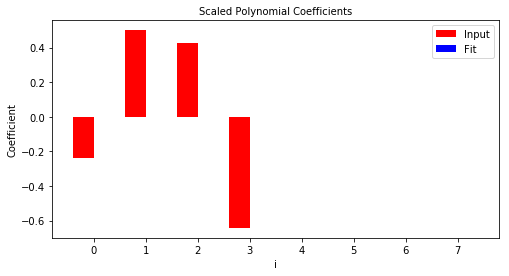

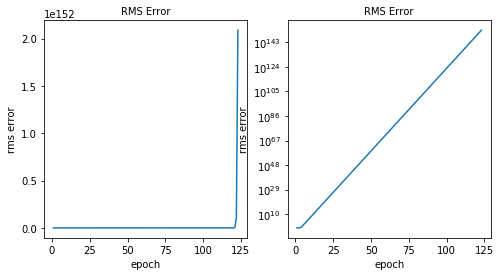

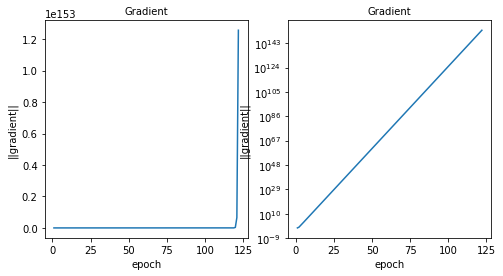

 
case_num:        157
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           1
inner loop:      15000000
train rms error: nan
test rms error:  nan


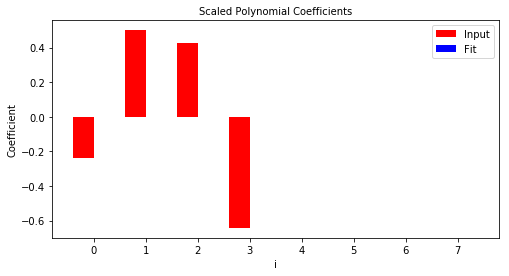

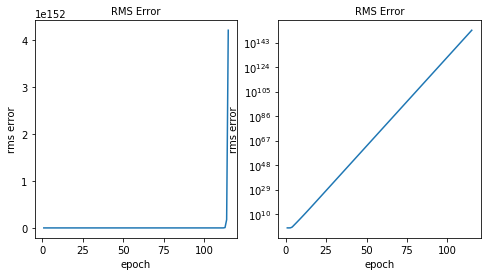

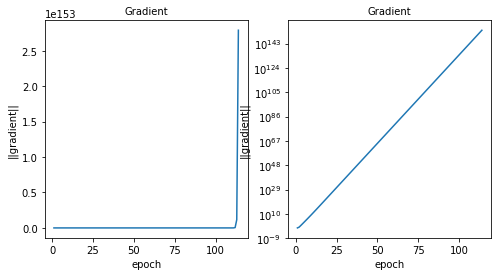

 
case_num:        158
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           1
inner loop:      17500000
train rms error: nan
test rms error:  nan


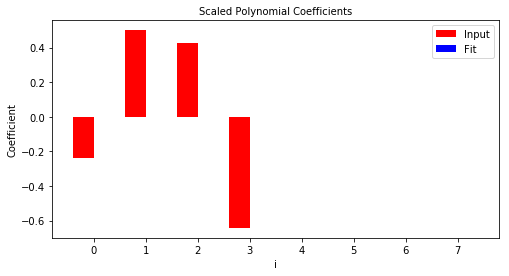

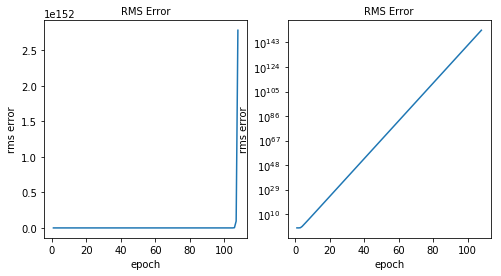

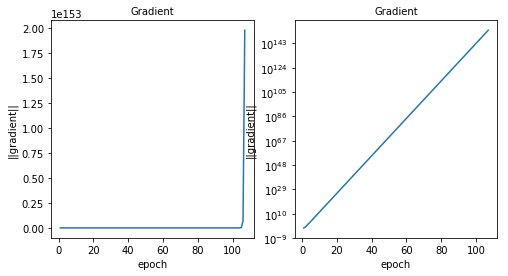

 
case_num:        159
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           10
Regularization:  2
Power:           1
inner loop:      20000000
train rms error: nan
test rms error:  nan


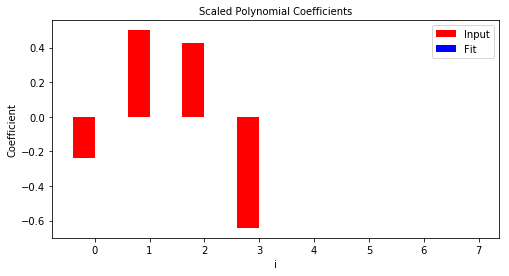

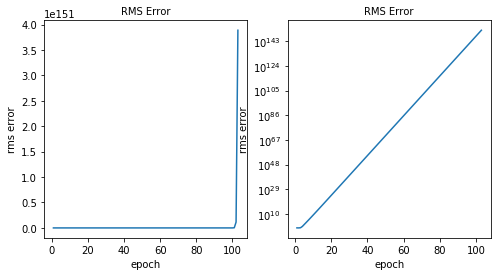

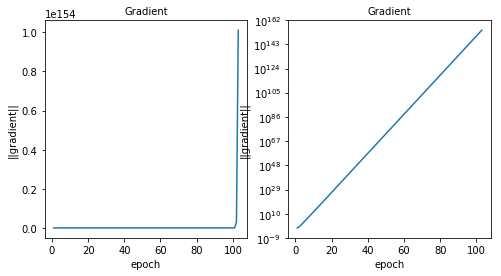

 
done


In [166]:
# Case: L2 regularization with power parameter, lambda=10
# Case parameters
# Type of regularization: 2 => L2 regularization
reg_type = 2
# Lambda: 10
lambda_reg = 10
# Power parameter: 1
reg_power = 1
run(reg_type, lambda_reg, reg_power)

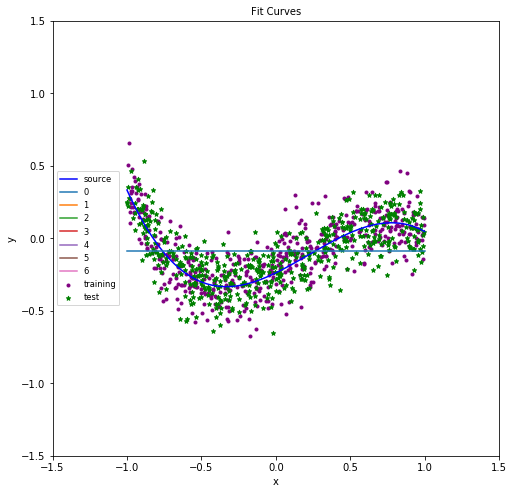

In [167]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

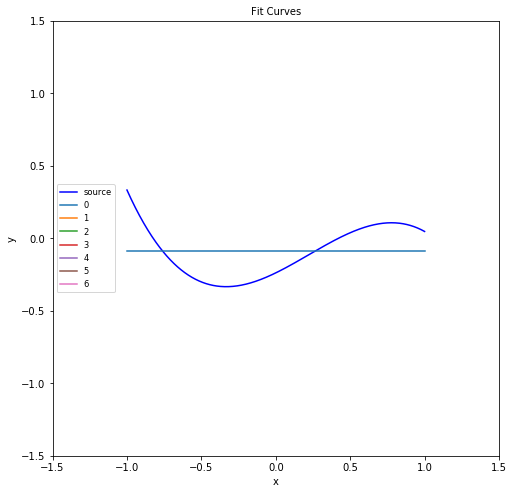

In [168]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

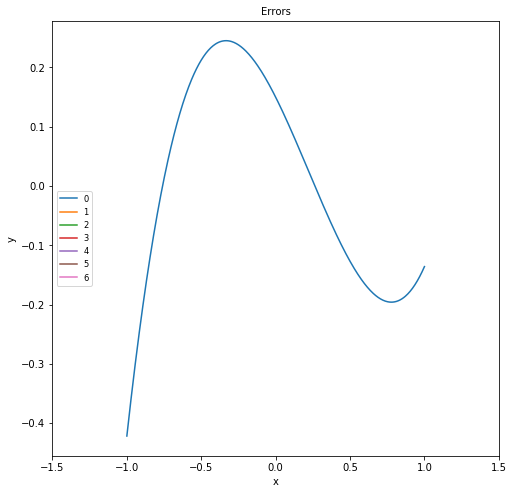

In [169]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

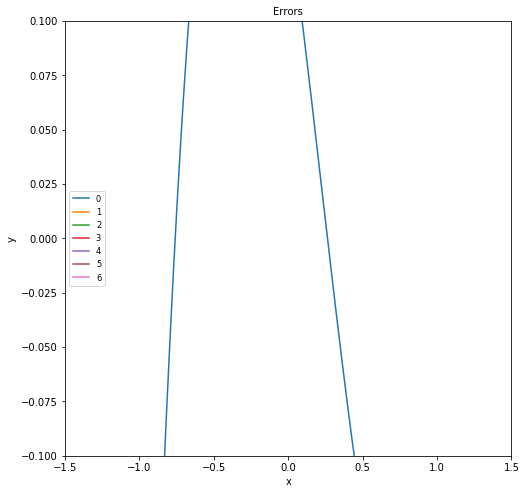

In [170]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

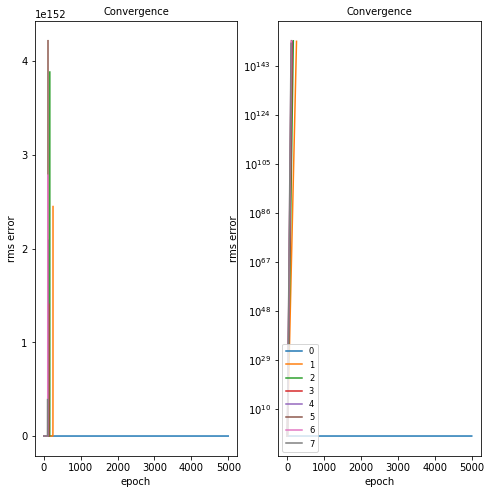

In [171]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


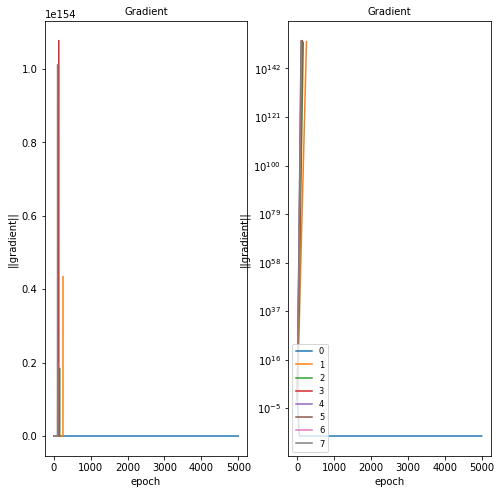

In [172]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


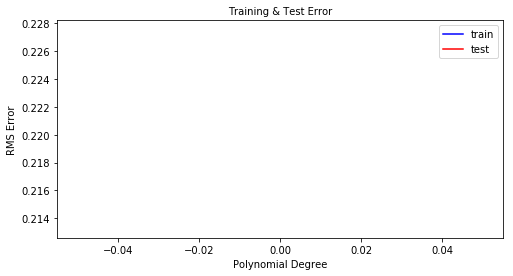

In [173]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

case_num:        160
degree:          0
sample size:     500
parameters:      1
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           1
inner loop:      2500000
train rms error: 0.227514470284
test rms error:  0.213308799054


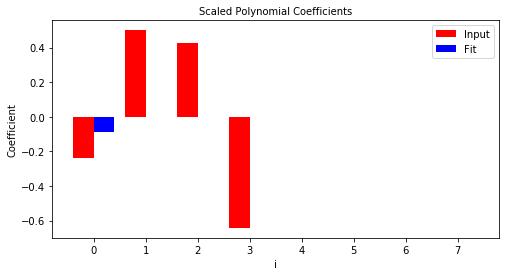

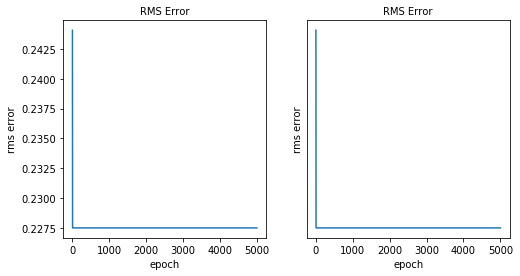

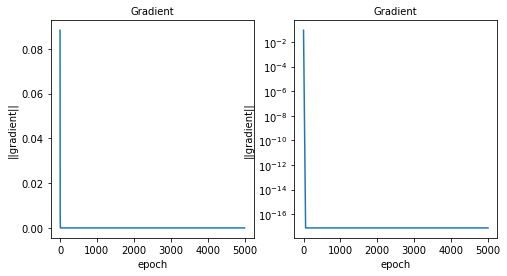

 
case_num:        161
degree:          1
sample size:     500
parameters:      2
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           1
inner loop:      5000000
train rms error: nan
test rms error:  nan


c:\users\balwant\anaconda2\envs\python3\lib\site-packages\ipykernel_launcher.py:81: RuntimeWarning: overflow encountered in square
c:\users\balwant\anaconda2\envs\python3\lib\site-packages\ipykernel_launcher.py:80: RuntimeWarning: invalid value encountered in subtract


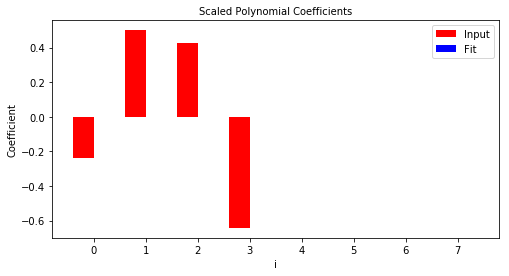

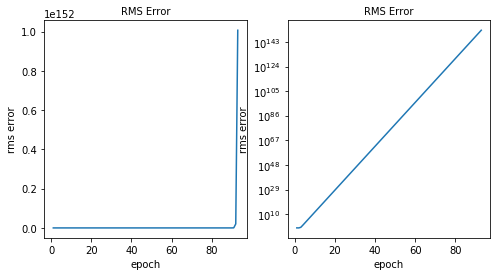

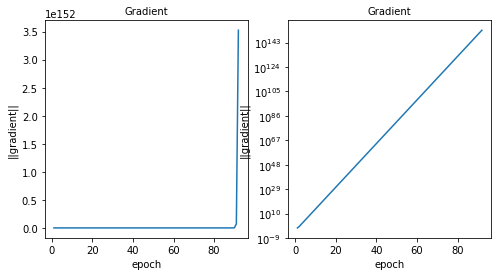

 
case_num:        162
degree:          2
sample size:     500
parameters:      3
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           1
inner loop:      7500000
train rms error: nan
test rms error:  nan


c:\users\balwant\anaconda2\envs\python3\lib\site-packages\ipykernel_launcher.py:118: RuntimeWarning: overflow encountered in double_scalars


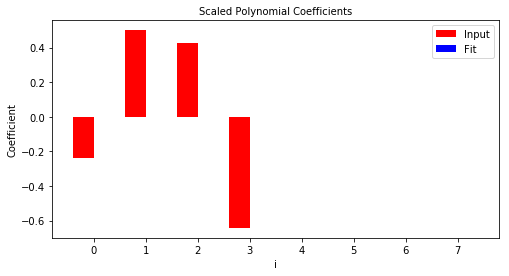

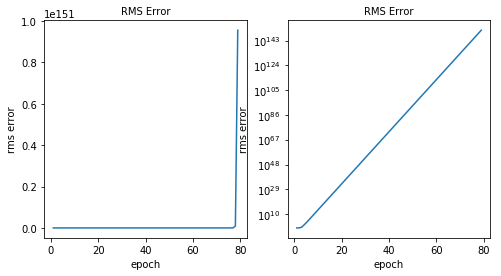

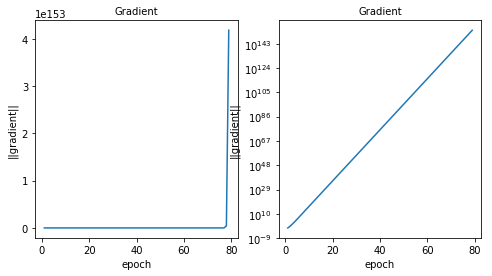

 
case_num:        163
degree:          3
sample size:     500
parameters:      4
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           1
inner loop:      10000000
train rms error: nan
test rms error:  nan


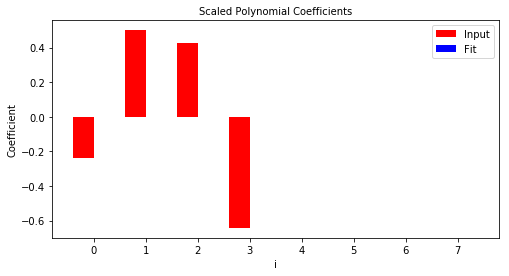

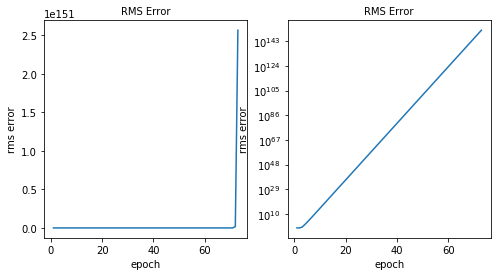

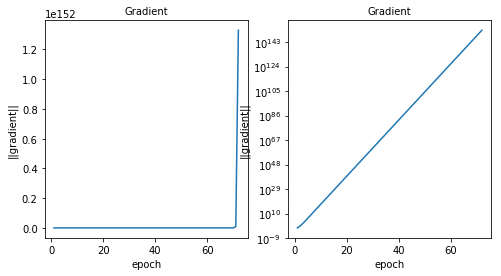

 
case_num:        164
degree:          4
sample size:     500
parameters:      5
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           1
inner loop:      12500000
train rms error: nan
test rms error:  nan


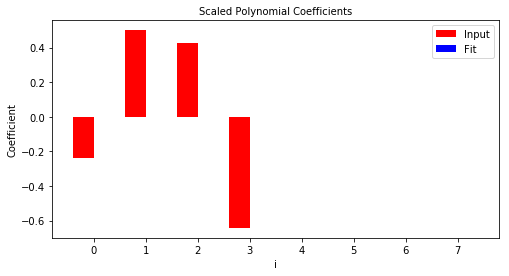

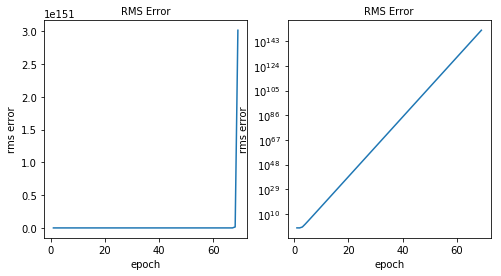

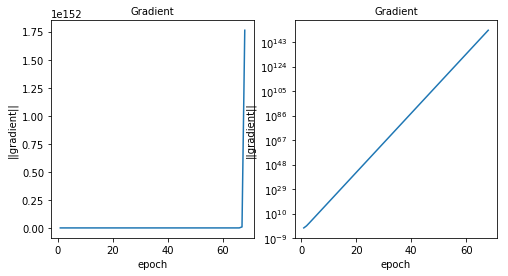

 
case_num:        165
degree:          5
sample size:     500
parameters:      6
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           1
inner loop:      15000000
train rms error: nan
test rms error:  nan


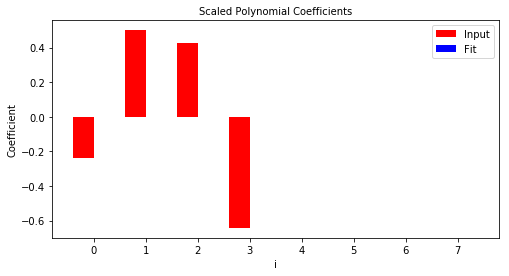

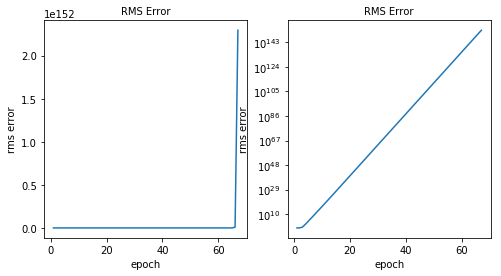

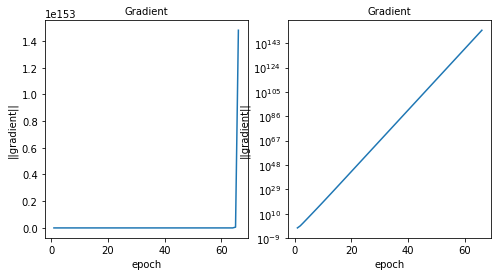

 
case_num:        166
degree:          6
sample size:     500
parameters:      7
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           1
inner loop:      17500000
train rms error: nan
test rms error:  nan


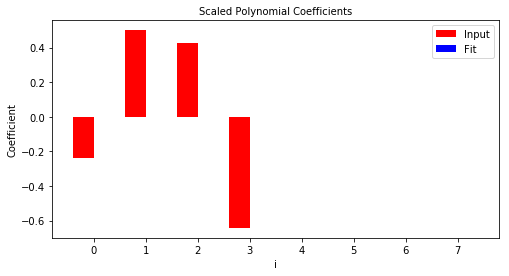

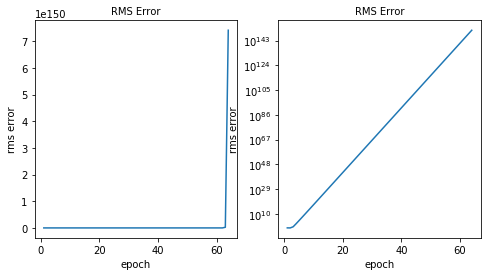

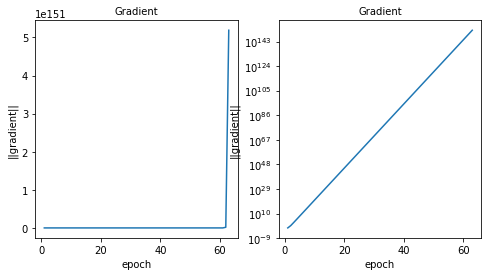

 
case_num:        167
degree:          7
sample size:     500
parameters:      8
iterations:      5000
batch size:      100000
eta:             0.5
lambda           100
Regularization:  2
Power:           1
inner loop:      20000000
train rms error: nan
test rms error:  nan


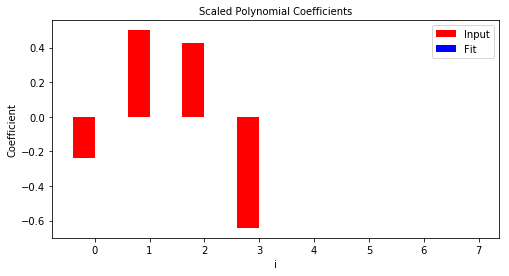

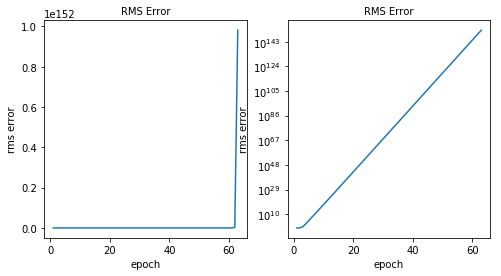

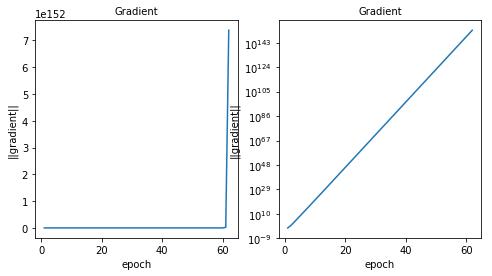

 
done


In [174]:
# Case: L2 regularization with power parameter, lambda=100
# Case parameters
# Type of regularization: 2 => L2 regularization
reg_type = 2
# Lambda: 100
lambda_reg = 100
# Power parameter: 1
reg_power = 1
run(reg_type, lambda_reg, reg_power)

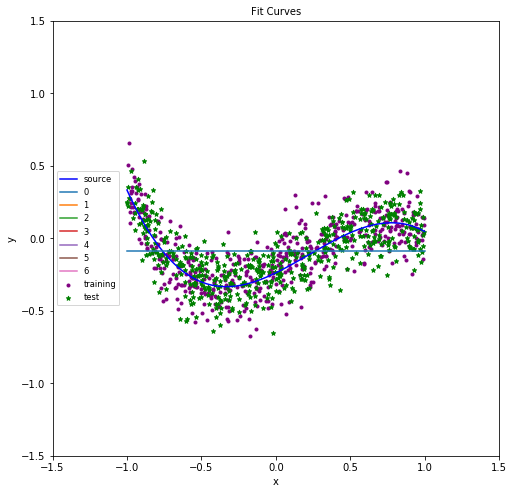

In [175]:
# plot the results

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

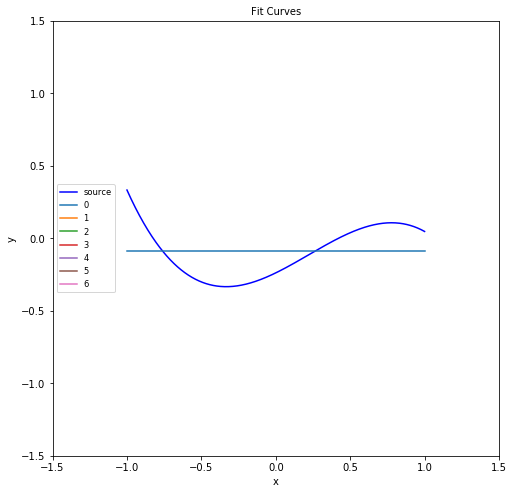

In [176]:
# plot the results without the input sample

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Fit Curves', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyyi[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

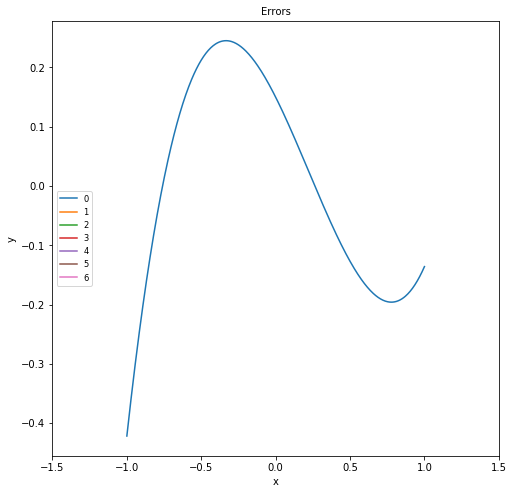

In [177]:
# plot the errors

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
#plt.ylim(-1.5,1.5)
plt.axis(range=1, aspect=1)
plt.show()

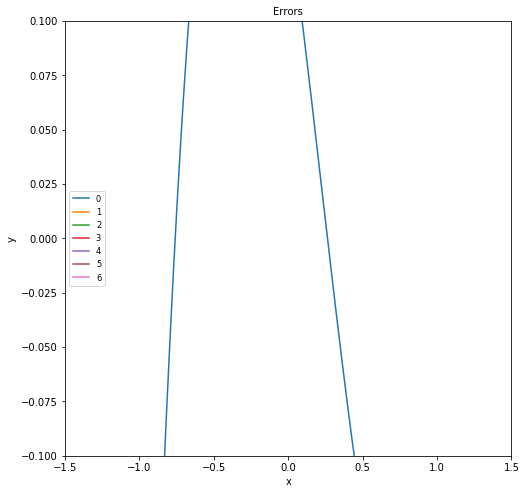

In [178]:
# plot the errors in more detail

plt.close('all')
plt.figure(figsize=(8, 8))
plt.title('Errors', fontsize='medium')
plt.xlabel('x')
plt.ylabel('y')
#plt.scatter(x_train,y_train, color = pltC[3], marker = pltM[3], label='training')
#plt.scatter(x_test,y_test, color = pltC[2], marker = pltM[2], label ='test', s=20)
#plt.plot(xpoly,ypolyt, color = pltC[1], label='source')
for i in range(0, ndegrees):
    plt.plot(xxx,yyye[:,i], label=degrees[i])
plt.legend(loc='center left', fontsize='small')
plt.xlim(-1.5,1.5)
plt.ylim(-0.1,0.1)
plt.axis(range=1, aspect=1)
plt.show()

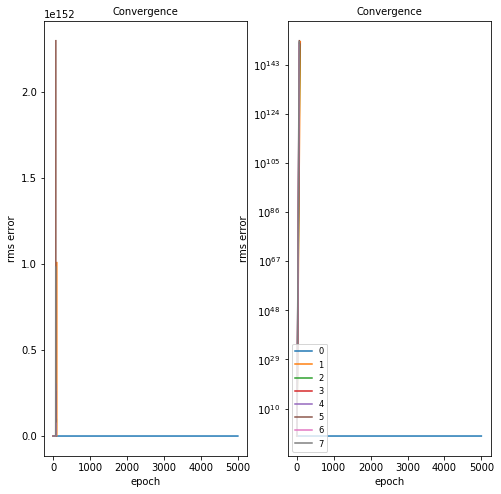

In [179]:
#plot rms error
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),costi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),costi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('rms error')
ax[0].set_title('Convergence', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('rms error')
ax[1].set_title('Convergence', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


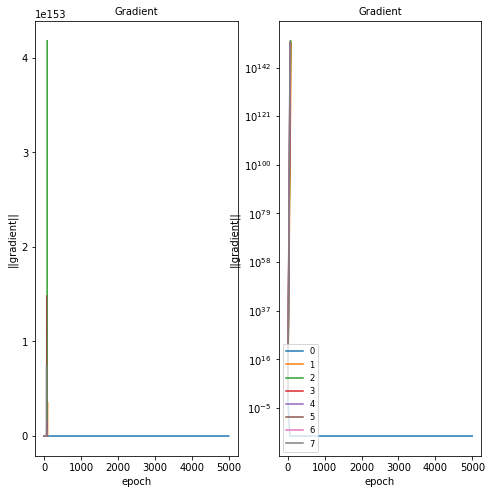

In [180]:
#plot ||gradient||
plt.close('all')
 
fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (8,8))
for i in range(0,ndegrees1):
    ax[0].plot(range(1, niters + 1),gradi[:,i], label=degrees[i])
    ax[1].semilogy(range(1, niters + 1),gradi[:,i], label=degrees[i])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('||gradient||')
ax[0].set_title('Gradient', fontsize ='medium')
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('||gradient||')
ax[1].set_title('Gradient', fontsize ='medium')
ax[1].legend(loc='lower left', fontsize='small')
plt.show()


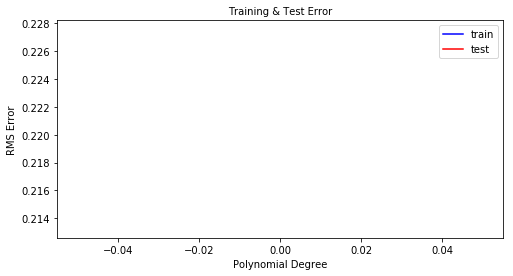

In [181]:
# plot training and test errors

plt.close('all')
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (8,4))
ax.plot(degrees, err_train, color='blue', label='train')
ax.plot(degrees, err_test, color='red', label='test')
ax.set_xlabel('Polynomial Degree')
ax.set_ylabel('RMS Error')
ax.legend(loc='upper right', fontsize='medium')
ax.set_title('Training & Test Error', fontsize ='medium')
plt.show()

## --------------------------------------------Summary-----------------------------------------------------

In [182]:
from prettytable import PrettyTable
t = PrettyTable(['Case Num', 'Reg Type', 'Lambda', 'Power', 'Degrees', 'Train RMSE', 'Test RMSE'])
for record in records:
    t.add_row(record[:7])
print(t)

+----------+----------+--------+-------+---------+-------------------+--------------------+
| Case Num | Reg Type | Lambda | Power | Degrees |     Train RMSE    |     Test RMSE      |
+----------+----------+--------+-------+---------+-------------------+--------------------+
|    0     |    0     |   0    |   0   |    0    |   0.227514470284  |   0.213308799054   |
|    1     |    0     |   0    |   0   |    1    |   0.21802458661   |   0.205483363595   |
|    2     |    0     |   0    |   0   |    2    |   0.177297131483  |   0.163054881955   |
|    3     |    0     |   0    |   0   |    3    |   0.136844247355  |   0.133772792765   |
|    4     |    0     |   0    |   0   |    4    |   0.136262243678  |   0.134060424114   |
|    5     |    0     |   0    |   0   |    5    |   0.136263267994  |   0.13401431581    |
|    6     |    0     |   0    |   0   |    6    |   0.136215162129  |   0.134101876803   |
|    7     |    0     |   0    |   0   |    7    |   0.136210629572  |   0.13408

In [ ]:
# Discussion
#     Based on the results, I feel like there may have been an error in the code for the power since the coefficients
# on the higher powers became much larger than they were expected to be, larger even then those of the same parameters
# without the addition of a power parameter. This effect was more pronounced for higher values of lambda. After a few 
# attempts to mitigate this, I was not able to fix this issue. 